In [1]:
import time
import math
import copy
import torch
import pickle
import random
import logging
import warnings
import datetime
import pandas as pd
import numpy as np
import seaborn as sns
import torch.nn as nn
import torch.optim as opt
import matplotlib.pyplot as plt
from imblearn.under_sampling import RandomUnderSampler
import fairlearn.datasets
from tqdm import tqdm
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from torch.autograd import grad, Variable
import torchvision.transforms as transforms
import torchvision.datasets as dsets
from torch.autograd.functional import vhp

from torch.utils.data import Subset, DataLoader
from sklearn.metrics import mean_absolute_error, r2_score, accuracy_score, precision_score, recall_score
from scipy.stats import spearmanr

plt.rcParams['figure.dpi'] = 300
warnings.filterwarnings("ignore")

E = math.e

### Utility Functions

In [2]:
def get_MNIST():
    train_dataset = dsets.MNIST(root='', train=True, transform=transforms.ToTensor(), download=True)
    test_dataset = dsets.MNIST(root='', train=False, transform=transforms.ToTensor(), download=True)
    
    idx = (train_dataset.targets==1) | (train_dataset.targets==7) | (train_dataset.targets==3) | (train_dataset.targets==8)
    train_dataset.targets = train_dataset.targets[idx]
    train_dataset.data = train_dataset.data[idx]
    
    new_targets = []
    
    for old_lab in train_dataset.targets:
        if old_lab == 1:
            new_targets.append(0)
        elif old_lab == 3:
            new_targets.append(1)
        elif old_lab == 7:
            new_targets.append(2)
        elif old_lab == 8:
            new_targets.append(3)
            
    train_dataset.targets = new_targets
    
    idx = (test_dataset.targets==1) | (test_dataset.targets==7) | (test_dataset.targets==3) | (test_dataset.targets==8)
    test_dataset.targets = test_dataset.targets[idx]
    test_dataset.data = test_dataset.data[idx]
    
    new_targets = []
    
    for old_lab in test_dataset.targets:
        if old_lab == 1:
            new_targets.append(0)
        elif old_lab == 3:
            new_targets.append(1)
        elif old_lab == 7:
            new_targets.append(2)
        elif old_lab == 8:
            new_targets.append(3)
            
    test_dataset.targets = new_targets
    print(len(train_dataset))
    return train_dataset, test_dataset

In [3]:
def visualize_result(e_k_actual, e_k_estimated, ep, k_):

    #e_k_estimated = [-1*ek for ek in e_k_estimated]
    fig, ax = plt.subplots()
    palette = sns.color_palette("cool", len(e_k_actual))
    sns.set(font_scale=1.15)
    sns.set_style(style='white')
    min_x = np.min(e_k_actual)
    max_x = np.max(e_k_actual)
    min_y = np.min(e_k_estimated)
    max_y = np.max(e_k_estimated)
    
    plt.rcParams['figure.figsize'] = 6, 5
    z = np.polyfit(e_k_actual,  e_k_estimated, 1)
    p = np.poly1d(z)
    xx = np.linspace(-p(2)/p(1), max(e_k_actual)+.0001)
    yy = np.polyval(p, xx)
    #add trendline to plot
    ax.plot(xx, yy, ls="-", color='k')
    for k in range(len(e_k_actual)):
        ax.scatter(e_k_actual[k], e_k_estimated[k], zorder=2, s=45, color = palette[k], label=ep[k])

    ax.set_title(f'Actual vs. Estimated loss for k={k_:.2f}%')
    ax.set_xlabel('Actual loss difference')
    ax.set_ylabel('Estimated loss difference')
   
    ax.set_xlim(min_x-.0001, max_x+.0001)
    ax.set_ylim(min_y-.0001, max_y+.0001)
    
   
    text = 'MAE = {:.03}\nP = {:.03}'.format(mean_absolute_error(e_k_actual, e_k_estimated), spearmanr(e_k_actual, e_k_estimated).correlation)
    ax.text(max_x+.00009,min_y-.00008, text, verticalalignment='bottom', horizontalalignment='right')
#     ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    #plt.tight_layout()
    plt.xticks(rotation = 45)
    plt.show()
    # cooler color = smaller epsilon

In [4]:
 class CreateData(torch.utils.data.Dataset):
    def __init__(self, data, targets):
        self.data = data
        self.targets = targets

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        out_data = self.data[idx]
        out_label = self.targets[idx]

        return out_data, out_label

In [5]:
def get_data(new_train_df, k):    

    selected_group = new_train_df.loc[new_train_df['label'] == 0]

    num_to_sample = round((k / 100)*len(new_train_df))

    try:
        sampled_group = selected_group.sample(n=num_to_sample, replace=False)
    except ValueError:
        sampled_group = selected_group.sample(n=num_to_sample, replace=True)
    not_selected = new_train_df.drop(sampled_group.index)

    feats = set(new_train_df.columns) - {'label'}
    selected_group_X = sampled_group[feats]
    selected_group_y = sampled_group['label']

    not_selected_group_X = not_selected[feats]
    not_selected_group_y = not_selected['label']   
    
    return selected_group_X, selected_group_y, not_selected_group_X, not_selected_group_y

### Randomized Response

In [6]:
def get_p(epsilon):
    probability = float(E ** epsilon) / float(3 + (E ** epsilon))
    p = torch.FloatTensor([[probability, 1-probability], [1-probability, probability]])
    
    return p

### Models

In [7]:
class LogisticRegression(torch.nn.Module):
    def __init__(self):
        super(LogisticRegression, self).__init__()
        
        self.fc1 = torch.nn.Linear(784, 4)
        self.criterion = torch.nn.CrossEntropyLoss()
        
    def forward(self, x):
        logits = self.fc1(x)

        return logits
    
    def loss(self, test_loader, print_, device):
        correct = 0
        total = 0
        all_labels = []
        all_predicted = []
        all_loss = 0
        for images, labels in test_loader:
            images = Variable(images.view(-1, 28*28)).to(device)
            labels = Variable(labels).to(device)
            outputs = self.fc1(images)
            loss = self.criterion(outputs, labels)
            all_loss += loss
            _, predicted = torch.max(outputs.data, 1)
            total+= labels.size(0)
            
            all_labels.extend(list(labels.detach().cpu().numpy()))
            all_predicted.extend(list(predicted.detach().cpu().numpy()))
            correct+= (predicted.detach().cpu().numpy() == labels.detach().cpu().numpy()).sum()
        acc = 100 * correct/total
        
#         print("Accuracy is {0:.3f}".format(acc))
#         print("Precision is {0:.3f}".format(precision_score(all_labels, all_predicted, average='micro')))
#         print("Recall is {0:.3f}".format(recall_score(all_labels, all_predicted, average='micro')))
        return loss/len(test_loader), acc

In [8]:
def train(model, train_data, device):
    model.train()
    
    optimizer = torch.optim.SGD(model.parameters(), lr=.5, weight_decay=0)
    
    criterion = torch.nn.CrossEntropyLoss()

    train_dataloader = DataLoader(train_data, batch_size=100, shuffle=True)

    for itr in range(0, 10):
        itr_loss = 0
        correct = 0
        total = 0
        for i, (images, labels) in enumerate(train_dataloader):
            images = Variable(images.view(-1, 28*28)).to(device)
            labels = Variable(labels).to(device)
            
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            itr_loss += loss
            loss.backward()
            optimizer.step()
            
            _, predicted = torch.max(outputs.data, 1)
            total+= labels.size(0)
            correct+= (predicted.detach().cpu() == labels.detach().cpu()).sum()
            
#         print(f'Epoch {itr+1} - Loss: {itr_loss/len(train_dataloader):.3f} - Acc: {100*correct/total:.3f}')
            
    return model

### Influence Calculation Functions


In [9]:
def calc_influence_single(model, epsilon, train_dataset, train_dataloader, test_dataloader, group_data, device, criterion, hessian):
    start = time.time()
    
    if hessian is None:
        s_test_vec = s_test_sample(model, test_dataloader, train_dataset, device, criterion)
    else:
        s_test_vec = hessian 
        
    grad_z_vec = grad_training([group_data[0], group_data[1]], model, device, epsilon)
    
    with torch.no_grad():
        influence = (sum([torch.sum(k * j).data for k, j in zip(grad_z_vec, s_test_vec)]) / len(train_dataset))
            
    end = time.time() - start

    return influence.cpu(), end, s_test_vec

In [10]:
def s_test_sample(model, test_dataloader, train_dataset, device, criterion):
    scale = 25
    damp = 0.01
    recursion_depth = 7500
    r = 3
    
    inverse_hvp = [torch.zeros_like(params, dtype=torch.float) for params in model.parameters()]
    
    for i in range(r):
        hessian_loader = DataLoader(train_dataset, sampler=torch.utils.data.RandomSampler(train_dataset, True, num_samples=recursion_depth), batch_size = 1, num_workers=4)
        
        cur_estimate = s_test(test_dataloader, model, i, hessian_loader, device, damp, scale, criterion)
        
        with torch.no_grad():
            inverse_hvp = [old + (cur/scale) for old,cur in zip(inverse_hvp, cur_estimate)]
    
    with torch.no_grad():
        inverse_hvp = [component / r for component in inverse_hvp]
        
    return inverse_hvp

In [11]:
def s_test(test_dataloader, model, i, hessian_loader, device, damp, scale, criterion):
    v = grad_z(test_dataloader, model, device, criterion)
    h_estimate = v
    
    params, names = make_functional(model)
    params = tuple(p.detach().requires_grad_() for p in params)
    
    progress_bar = tqdm(hessian_loader, desc=f"IHVP sample {i}")
    
    for i, (x_train, y_train) in enumerate(progress_bar):
        x_train = Variable(x_train.view(-1, 28*28)).to(device)
        y_train = Variable(y_train).to(device)
        
        def f(*new_params):
            load_weights(model, names, new_params)
            out = model(x_train)
            loss = criterion(out, y_train)
            return loss
    
        hv = vhp(f, params, tuple(h_estimate), strict=True)[1]
        
        with torch.no_grad():
            h_estimate = [
                _v + (1-damp) * _h_e - _hv / scale for _v, _h_e, _hv in zip(v, h_estimate, hv)
            ]
            
            if i % 100 == 0:
                norm = sum([h_.norm() for h_ in h_estimate])
                progress_bar.set_postfix({"est norm": norm.item()})
                
    with torch.no_grad():
        load_weights(model, names, params, as_params=True)
        
    return h_estimate

In [12]:
def make_functional(model):
    orig_params = tuple(model.parameters())
    names = []
    
    for name, p in list(model.named_parameters()):
        del_attr(model, name.split("."))
        names.append(name)
    
    return orig_params, names

In [13]:
def del_attr(obj, names):
    if len(names) == 1:
        delattr(obj, names[0])
    else:
        del_attr(getattr(obj, names[0]), names[1:])

In [14]:
def set_attr(obj, names, val):
    if len(names) == 1:
        setattr(obj, names[0], val)
    else:
        set_attr(getattr(obj, names[0]), names[1:], val)

In [15]:
def load_weights(model, names, params, as_params=False):
    for name, p in zip(names, params):
        if not as_params:
            set_attr(model, name.split("."), p)
        else:
            set_attr(model, name.split("."), torch.nn.Parameter(p))

In [16]:
def grad_z(test_data, model, device, criterion):

    model.eval()

    itr_loss = 0
    for i, (images, labels) in enumerate(test_data):
        images = Variable(images.view(-1, 28*28)).to(device)
        labels = Variable(labels).to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)
        itr_loss += loss

    loss_ = itr_loss / len(test_data)
    return grad(loss_, model.parameters())

In [17]:
def grad_training(train_data, model, device, epsilon):

    model.eval()

    x_train_input = torch.FloatTensor(train_data[0].values).to(device)
    y_train_input = torch.LongTensor(train_data[1].values).to(device)

    train_data = CreateData(x_train_input, y_train_input)
    train_dataloader = DataLoader(train_data, batch_size=1, shuffle=True)

    criterion = torch.nn.CrossEntropyLoss(reduction='sum')
    
    agg_loss = 0
    possible_labels = [0,1,2,3]
    for i, (image, label) in enumerate(train_dataloader):
        pert_agg_loss = 0
        
        output = model(image)
        orig_loss = criterion(output, label)

        for j in possible_labels:
            if j == label.item():
                continue
            else:
                pert_label = torch.LongTensor([j]).to(device)
               
                pert_loss = criterion(output, pert_label)
                pert_agg_loss += (pert_loss - orig_loss)
            
        itr_loss = pert_agg_loss 
        agg_loss += itr_loss
        
    loss = float(1/(3+(E ** epsilon)))*(agg_loss)
    
    to_return = grad(loss, model.parameters())
    
        
    return to_return

### Main Function

In [18]:
def Main(dataset, epsilons, ks, num_rounds):

    device = 'cuda:4' if torch.cuda.is_available() else 'cpu'
    criterion = torch.nn.CrossEntropyLoss()
    
    all_orig_loss_e_k = []
    all_est_loss_e_k = []
    all_time = []
    
    for nr in range(num_rounds):
        print(f'\nRound {nr+1}')
        ############
        # Get data #
        ############
        print('\nGetting Data...')

        train_dataset, test_dataset = get_MNIST()

        images_train = []
        labels_train = []
        
        images_test = []
        labels_test = []
        
        for i, (image, label) in enumerate(train_dataset):
            images_train.append(image.view(-1, 28*28).tolist()[0])
            labels_train.append(label)
        
        X_train = pd.DataFrame(images_train)
        y_train = pd.DataFrame(labels_test, columns =['label'])
        
        for i, (image, label) in enumerate(test_dataset):
            images_test.append(image.view(-1, 28*28).tolist()[0])
            labels_test.append(label)
        
        X_train = pd.DataFrame(images_train)
        y_train = pd.DataFrame(labels_train, columns =['label'])
        
        X_test = pd.DataFrame(images_test)
        y_test= pd.DataFrame(labels_test, columns =['label'])
        
        x_test_input = torch.FloatTensor(X_test.values).to(device)
        y_test_input = torch.LongTensor(y_test.values).to(device)

        x_train_input = torch.FloatTensor(X_train.values).to(device)
        y_train_input = torch.LongTensor(y_train.values).to(device)
   
        new_train_df = pd.concat([X_train, y_train], axis=1)
      
        train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=100, shuffle=True)
        test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=100, shuffle=False)
   
        ##############################################
        # Train original model and get original loss #
        ##############################################
        print('Training original model...')
        torch_model = LogisticRegression()
        torch.save(torch_model.state_dict(), 'initial_config_g2g.pth')
        torch_model.to(device)
        torch_model = train(torch_model, train_dataset, device)
        test_loss_ori, acc_ori = torch_model.loss(test_loader, True, device)

        e_k_act_losses = []
        e_k_est_losses = []
        influence_time = []
        
        ################################################################
        # Perform influence and retraining for all epsilons a k values #
        ################################################################
        print('\nBegining epsilon and k rounds')
        print('-----------------------------')
        for k_elem, k in enumerate(ks):
            print(f'\nk: {k}')
            hessian = None
            k_act_losses = []
            k_est_losses = []
            inf_time = []
            
            for ep_elem, ep in enumerate(epsilons):
                # Influence
                print(f'ep: {ep}')
                selected_group_X, selected_group_y, not_selected_group_X, not_selected_group_y = get_data(new_train_df, k)
                loss_diff_approx, tot_time, hessian = calc_influence_single(torch_model, ep, train_dataset, train_loader, test_loader, [selected_group_X, selected_group_y, not_selected_group_X, not_selected_group_y], device, criterion, hessian)
                loss_diff_approx = -torch.FloatTensor(loss_diff_approx).cpu().numpy()
                print(f'Approx difference: {loss_diff_approx:.5f}')
                
                # Retrain - need to actually perturb
                p_stay = ((E**ep)/(3+(E**ep)))
                p_change = (1/(3+(E**ep)))

                G_pert = []
                G_labels = selected_group_y.values.tolist()
                
                for lab in G_labels:
                    poss_labels = [0,1,2,3]
                    
                    weights = [p_change for i in range(len(poss_labels))]
                    weights[lab] = p_stay
                    
                    pert_lab = random.choices(poss_labels, weights=weights, k=1)
                    G_pert.append(pert_lab[0])
                    
                y_w_group_pert = pd.concat([not_selected_group_y, pd.DataFrame(G_pert)], axis = 0, ignore_index=True)
                y_w_group_pert = y_w_group_pert.values.tolist()
                y_w_group_pert = [yw for sublist in y_w_group_pert for yw in sublist]
               
                y_wo_pert = pd.concat([not_selected_group_y, selected_group_y], axis = 0, ignore_index=True)
                reconstructed_x = pd.concat([not_selected_group_X, selected_group_X], axis = 0, ignore_index=True)
                x_train_input_pert = torch.FloatTensor(reconstructed_x.values).to(device)
                y_train_input_pert = torch.LongTensor(y_w_group_pert).to(device)

                train_data_pert = CreateData(x_train_input_pert, y_train_input_pert)
                model_pert = LogisticRegression()
                model_pert.load_state_dict(torch.load('initial_config_g2g.pth'))
                model_pert.to(device)
                torch_model = train(model_pert, train_data_pert, device)
                test_loss_retrain, acc_retrain = model_pert.loss(test_loader, True, device)

                 # get true loss diff
                loss_diff_true = (test_loss_retrain - test_loss_ori).detach().cpu().item()
                print(f'True difference: {loss_diff_true:.5f}')
                k_act_losses.append(loss_diff_true)
                k_est_losses.append(loss_diff_approx)
                inf_time.append(tot_time)
            
            visualize_result(k_act_losses, k_est_losses, epsilons, k)
            
            e_k_act_losses.append(k_act_losses)
            e_k_est_losses.append(k_est_losses)
            influence_time.append(inf_time)
            
        all_orig_loss_e_k.append(e_k_act_losses)
        all_est_loss_e_k.append(e_k_est_losses) 
        all_time.append(influence_time)
    
    return all_orig_loss_e_k, all_est_loss_e_k, all_time

### Perform Experiment 

#### Constants

In [19]:
epsilons = np.linspace(.001, 5, 30) #30 5
k = np.linspace(1, 30, 10) #10
rounds = 5


Round 1

Getting Data...
24989
Training original model...

Begining epsilon and k rounds
-----------------------------

k: 1.0
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 428.37it/s, est norm=6.31]


Approx difference: 0.00144
True difference: -0.00071
ep: 0.17337931034482756
Approx difference: 0.00127
True difference: 0.00001
ep: 0.3457586206896551
Approx difference: 0.00122
True difference: -0.00108
ep: 0.5181379310344827
Approx difference: 0.00117
True difference: -0.00196
ep: 0.6905172413793103
Approx difference: 0.00106
True difference: -0.00102
ep: 0.8628965517241378
Approx difference: 0.00095
True difference: 0.00054
ep: 1.0352758620689653
Approx difference: 0.00095
True difference: -0.00137
ep: 1.207655172413793
Approx difference: 0.00088
True difference: -0.00153
ep: 1.3800344827586204
Approx difference: 0.00082
True difference: -0.00113
ep: 1.5524137931034478
Approx difference: 0.00067
True difference: -0.00097
ep: 1.7247931034482755
Approx difference: 0.00061
True difference: -0.00003
ep: 1.8971724137931032
Approx difference: 0.00057
True difference: 0.00086
ep: 2.0695517241379306
Approx difference: 0.00051
True difference: -0.00075
ep: 2.241931034482758
Approx differenc

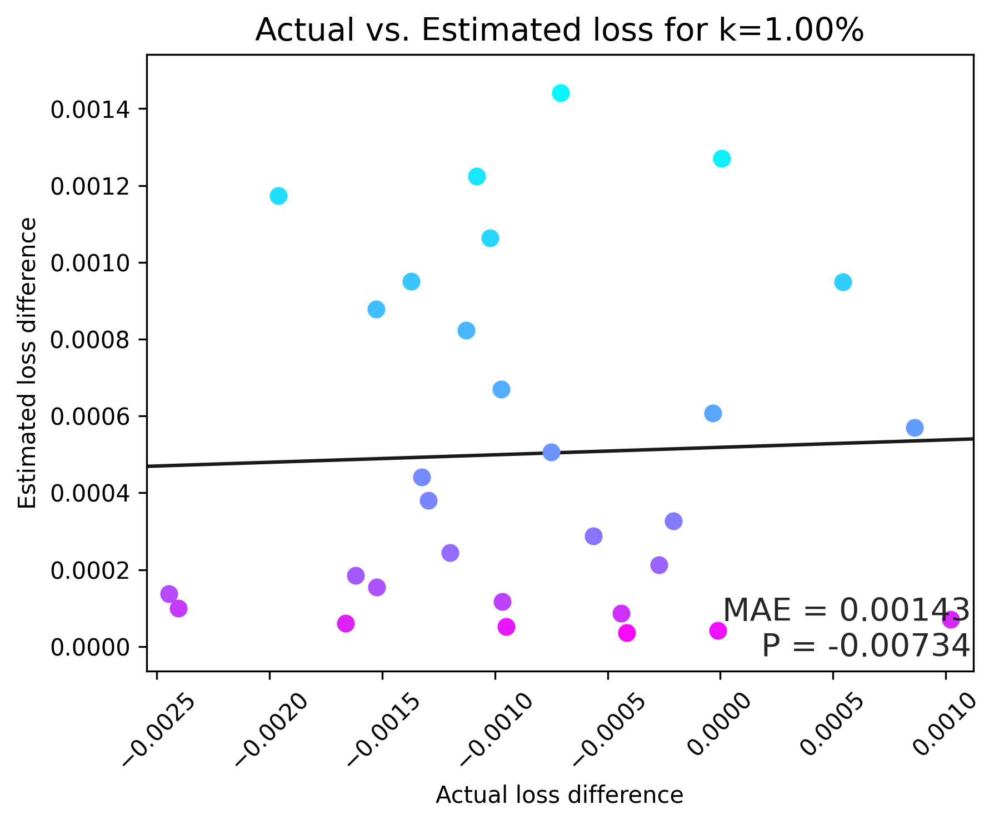


k: 4.222222222222222
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 450.19it/s, est norm=3.77]


Approx difference: 0.00433
True difference: 0.00122
ep: 0.17337931034482756
Approx difference: 0.00408
True difference: 0.00070
ep: 0.3457586206896551
Approx difference: 0.00393
True difference: 0.00132
ep: 0.5181379310344827
Approx difference: 0.00363
True difference: -0.00017
ep: 0.6905172413793103
Approx difference: 0.00344
True difference: 0.00019
ep: 0.8628965517241378
Approx difference: 0.00321
True difference: -0.00031
ep: 1.0352758620689653
Approx difference: 0.00301
True difference: 0.00033
ep: 1.207655172413793
Approx difference: 0.00274
True difference: -0.00072
ep: 1.3800344827586204
Approx difference: 0.00249
True difference: 0.00148
ep: 1.5524137931034478
Approx difference: 0.00228
True difference: -0.00023
ep: 1.7247931034482755
Approx difference: 0.00203
True difference: -0.00035
ep: 1.8971724137931032
Approx difference: 0.00179
True difference: -0.00074
ep: 2.0695517241379306
Approx difference: 0.00157
True difference: -0.00134
ep: 2.241931034482758
Approx difference: 

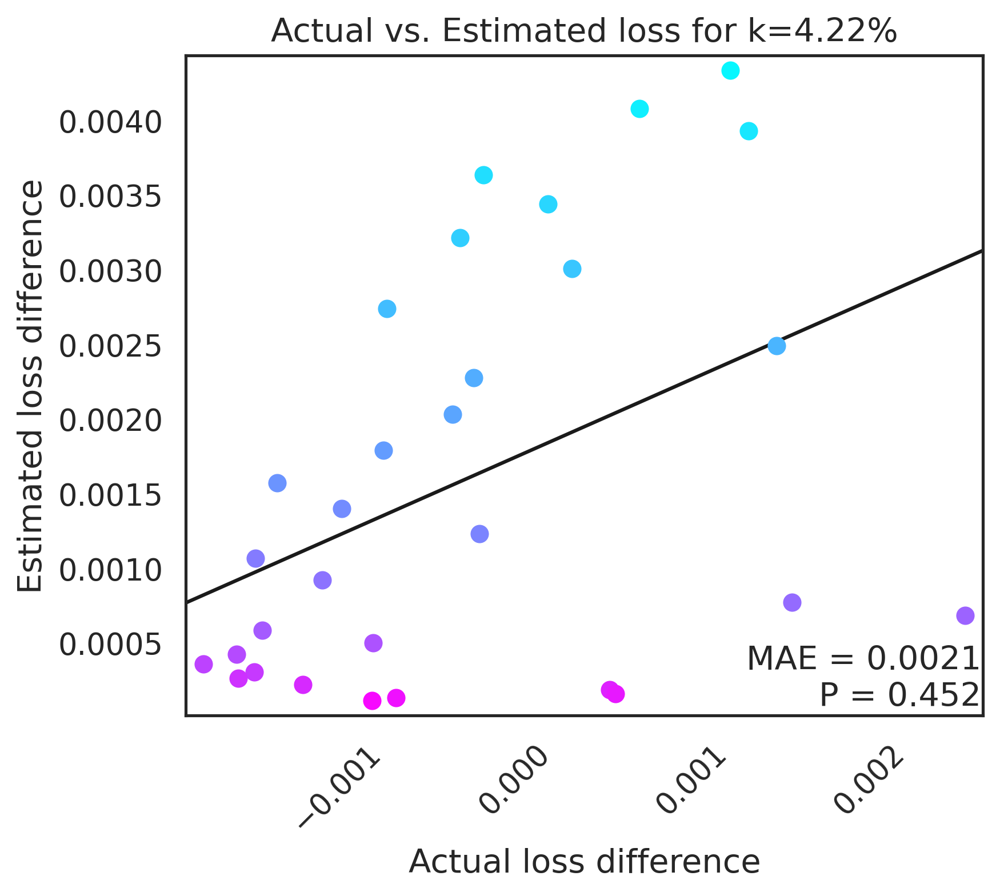


k: 7.444444444444445
ep: 0.001


IHVP sample 2: 100%|█████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 433.00it/s, est norm=5.6]


Approx difference: -0.00820
True difference: 0.00110
ep: 0.17337931034482756
Approx difference: -0.00781
True difference: 0.00267
ep: 0.3457586206896551
Approx difference: -0.00736
True difference: 0.00185
ep: 0.5181379310344827
Approx difference: -0.00702
True difference: 0.00316
ep: 0.6905172413793103
Approx difference: -0.00661
True difference: 0.00021
ep: 0.8628965517241378
Approx difference: -0.00604
True difference: 0.00002
ep: 1.0352758620689653
Approx difference: -0.00562
True difference: 0.00054
ep: 1.207655172413793
Approx difference: -0.00519
True difference: 0.00095
ep: 1.3800344827586204
Approx difference: -0.00474
True difference: 0.00096
ep: 1.5524137931034478
Approx difference: -0.00427
True difference: 0.00023
ep: 1.7247931034482755
Approx difference: -0.00383
True difference: -0.00029
ep: 1.8971724137931032
Approx difference: -0.00334
True difference: -0.00028
ep: 2.0695517241379306
Approx difference: -0.00298
True difference: 0.00206
ep: 2.241931034482758
Approx diff

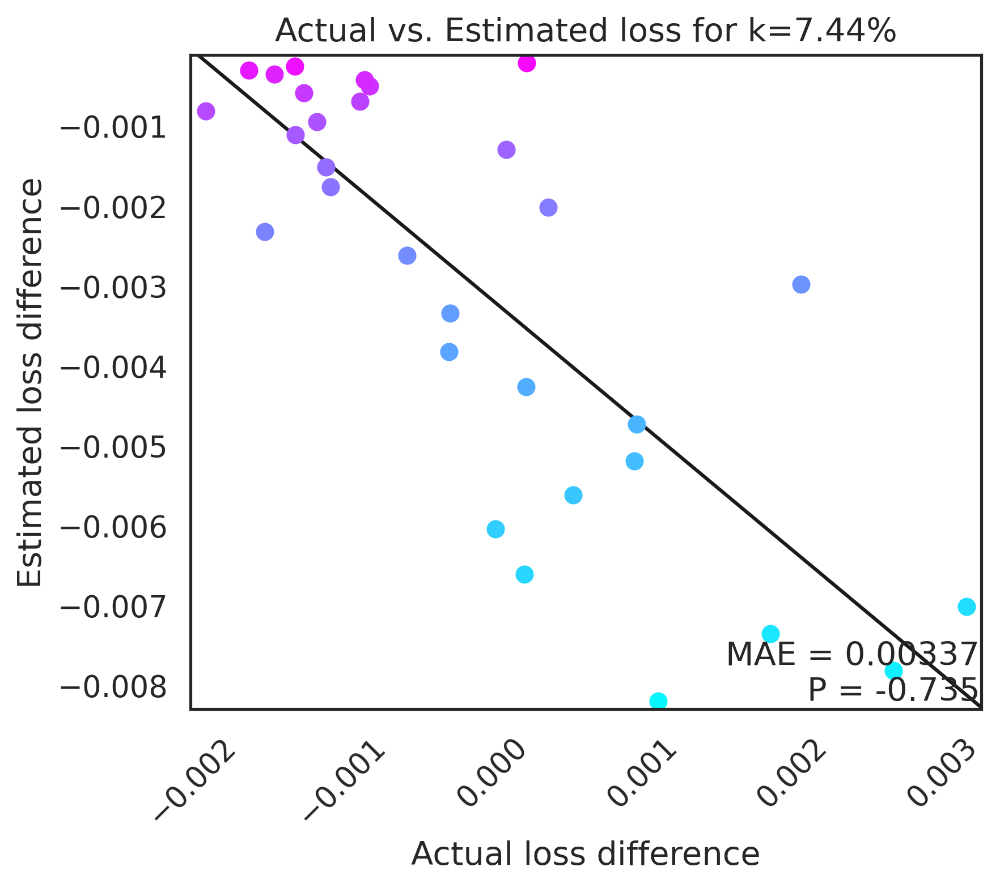


k: 10.666666666666668
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 452.14it/s, est norm=3.58]


Approx difference: 0.00172
True difference: 0.00216
ep: 0.17337931034482756
Approx difference: 0.00167
True difference: 0.00339
ep: 0.3457586206896551
Approx difference: 0.00159
True difference: 0.00479
ep: 0.5181379310344827
Approx difference: 0.00159
True difference: 0.00247
ep: 0.6905172413793103
Approx difference: 0.00152
True difference: 0.00196
ep: 0.8628965517241378
Approx difference: 0.00135
True difference: 0.00224
ep: 1.0352758620689653
Approx difference: 0.00117
True difference: 0.00193
ep: 1.207655172413793
Approx difference: 0.00121
True difference: 0.00171
ep: 1.3800344827586204
Approx difference: 0.00100
True difference: 0.00026
ep: 1.5524137931034478
Approx difference: 0.00097
True difference: -0.00057
ep: 1.7247931034482755
Approx difference: 0.00091
True difference: 0.00197
ep: 1.8971724137931032
Approx difference: 0.00079
True difference: 0.00101
ep: 2.0695517241379306
Approx difference: 0.00067
True difference: 0.00279
ep: 2.241931034482758
Approx difference: 0.0005

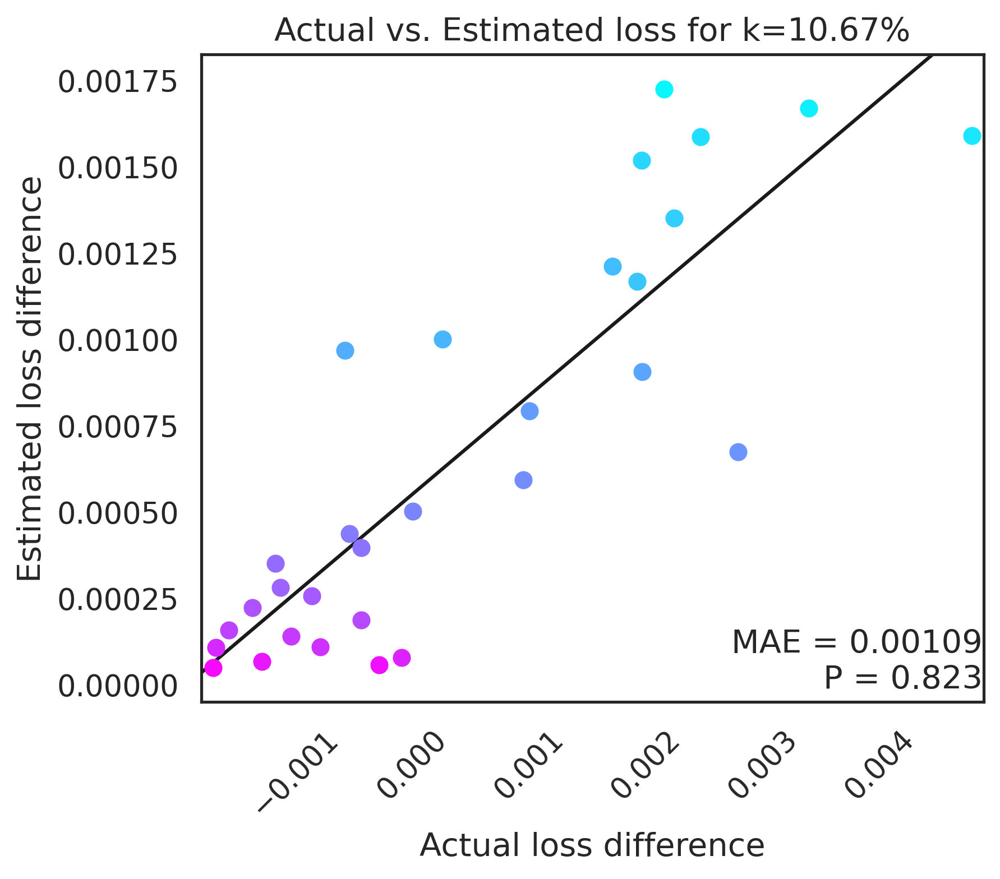


k: 13.88888888888889
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 464.34it/s, est norm=4.52]


Approx difference: 0.05010
True difference: 0.00555
ep: 0.17337931034482756
Approx difference: 0.04808
True difference: 0.00389
ep: 0.3457586206896551
Approx difference: 0.04538
True difference: 0.00228
ep: 0.5181379310344827
Approx difference: 0.04274
True difference: 0.00239
ep: 0.6905172413793103
Approx difference: 0.04011
True difference: 0.00149
ep: 0.8628965517241378
Approx difference: 0.03704
True difference: 0.00488
ep: 1.0352758620689653
Approx difference: 0.03449
True difference: 0.00136
ep: 1.207655172413793
Approx difference: 0.03158
True difference: 0.00171
ep: 1.3800344827586204
Approx difference: 0.02899
True difference: 0.00299
ep: 1.5524137931034478
Approx difference: 0.02604
True difference: 0.00313
ep: 1.7247931034482755
Approx difference: 0.02337
True difference: 0.00114
ep: 1.8971724137931032
Approx difference: 0.02055
True difference: 0.00069
ep: 2.0695517241379306
Approx difference: 0.01829
True difference: 0.00088
ep: 2.241931034482758
Approx difference: 0.01602

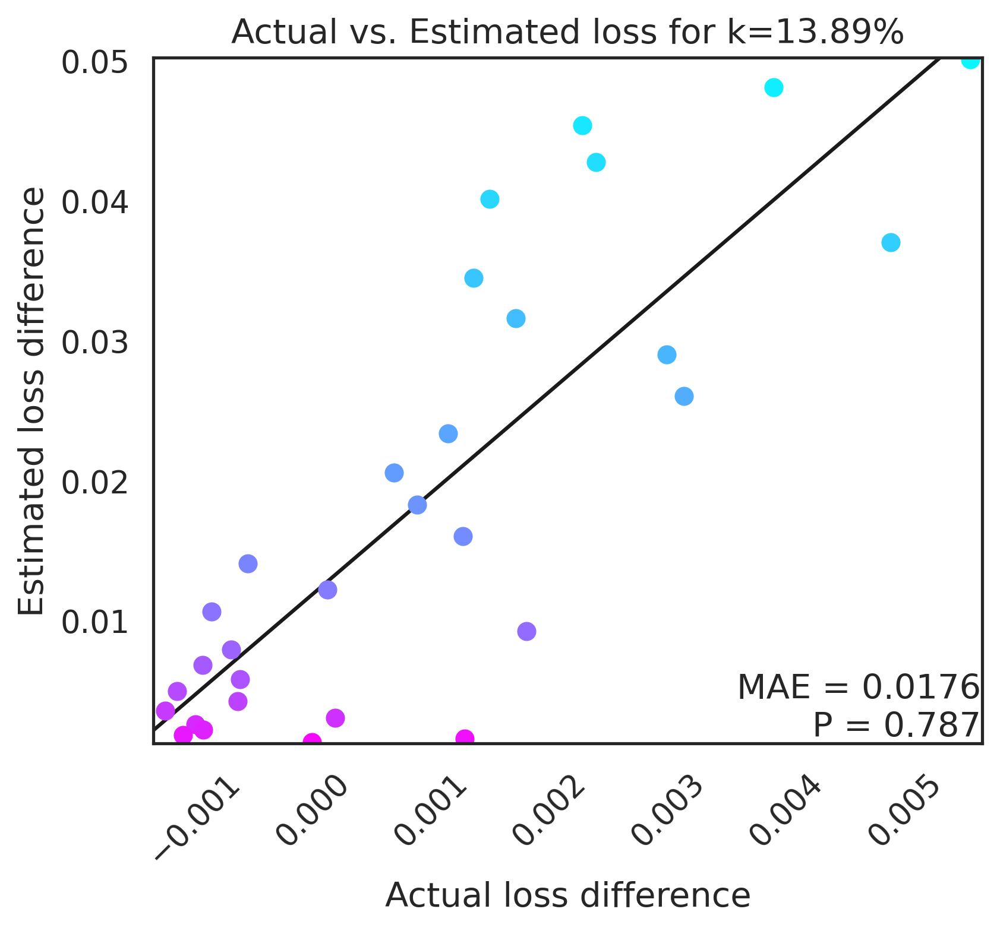


k: 17.11111111111111
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 447.80it/s, est norm=5.72]


Approx difference: -0.02121
True difference: 0.00320
ep: 0.17337931034482756
Approx difference: -0.02015
True difference: 0.00278
ep: 0.3457586206896551
Approx difference: -0.01918
True difference: 0.00245
ep: 0.5181379310344827
Approx difference: -0.01812
True difference: 0.00227
ep: 0.6905172413793103
Approx difference: -0.01698
True difference: 0.00261
ep: 0.8628965517241378
Approx difference: -0.01576
True difference: 0.00319
ep: 1.0352758620689653
Approx difference: -0.01449
True difference: 0.00116
ep: 1.207655172413793
Approx difference: -0.01337
True difference: 0.00261
ep: 1.3800344827586204
Approx difference: -0.01209
True difference: 0.00170
ep: 1.5524137931034478
Approx difference: -0.01094
True difference: 0.00218
ep: 1.7247931034482755
Approx difference: -0.00986
True difference: 0.00080
ep: 1.8971724137931032
Approx difference: -0.00877
True difference: 0.00393
ep: 2.0695517241379306
Approx difference: -0.00772
True difference: 0.00223
ep: 2.241931034482758
Approx differ

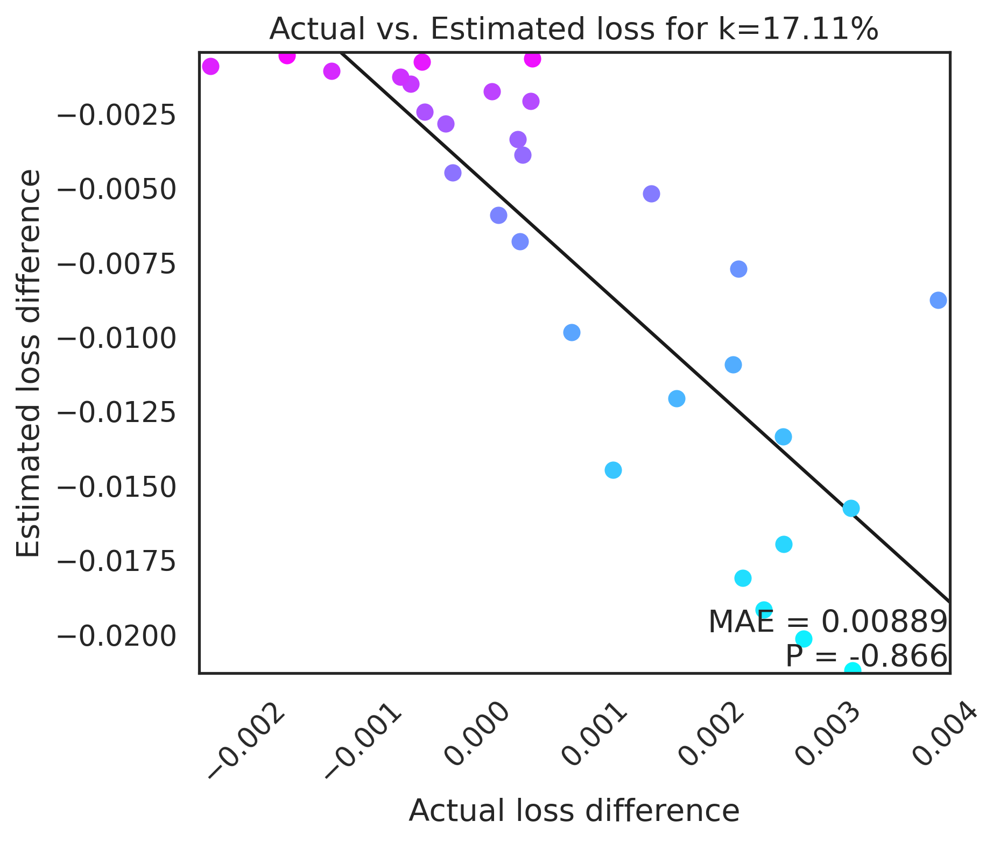


k: 20.333333333333336
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 448.41it/s, est norm=4.74]


Approx difference: 0.02337
True difference: 0.00703
ep: 0.17337931034482756
Approx difference: 0.02238
True difference: 0.00308
ep: 0.3457586206896551
Approx difference: 0.02119
True difference: 0.01037
ep: 0.5181379310344827
Approx difference: 0.02013
True difference: 0.00671
ep: 0.6905172413793103
Approx difference: 0.01876
True difference: 0.00330
ep: 0.8628965517241378
Approx difference: 0.01736
True difference: 0.00712
ep: 1.0352758620689653
Approx difference: 0.01604
True difference: 0.00483
ep: 1.207655172413793
Approx difference: 0.01471
True difference: 0.00144
ep: 1.3800344827586204
Approx difference: 0.01339
True difference: 0.00198
ep: 1.5524137931034478
Approx difference: 0.01208
True difference: 0.00217
ep: 1.7247931034482755
Approx difference: 0.01087
True difference: 0.00443
ep: 1.8971724137931032
Approx difference: 0.00971
True difference: 0.00260
ep: 2.0695517241379306
Approx difference: 0.00860
True difference: 0.00158
ep: 2.241931034482758
Approx difference: 0.00751

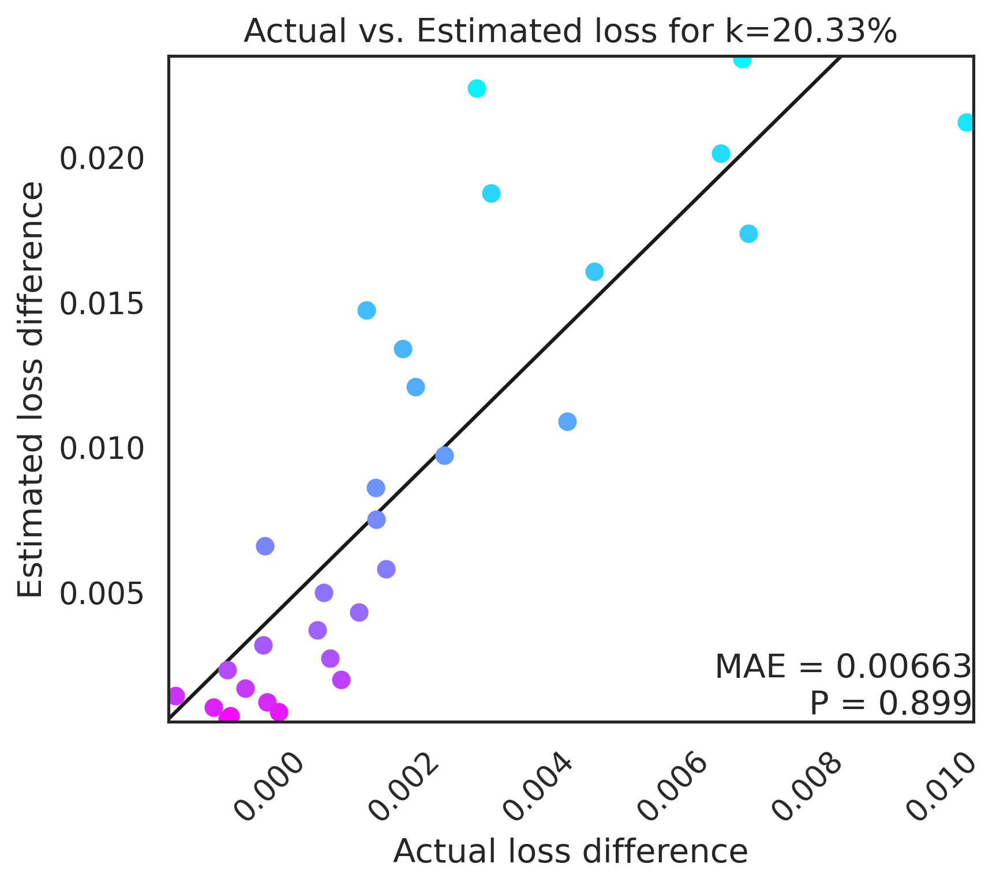


k: 23.555555555555557
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 445.89it/s, est norm=3.51]


Approx difference: -0.00785
True difference: 0.01049
ep: 0.17337931034482756
Approx difference: -0.00746
True difference: 0.00311
ep: 0.3457586206896551
Approx difference: -0.00713
True difference: 0.00640
ep: 0.5181379310344827
Approx difference: -0.00671
True difference: 0.01409
ep: 0.6905172413793103
Approx difference: -0.00635
True difference: 0.01243
ep: 0.8628965517241378
Approx difference: -0.00582
True difference: 0.00494
ep: 1.0352758620689653
Approx difference: -0.00546
True difference: 0.00335
ep: 1.207655172413793
Approx difference: -0.00495
True difference: 0.00435
ep: 1.3800344827586204
Approx difference: -0.00449
True difference: 0.00348
ep: 1.5524137931034478
Approx difference: -0.00405
True difference: 0.00249
ep: 1.7247931034482755
Approx difference: -0.00366
True difference: 0.00429
ep: 1.8971724137931032
Approx difference: -0.00327
True difference: 0.00368
ep: 2.0695517241379306
Approx difference: -0.00287
True difference: 0.00390
ep: 2.241931034482758
Approx differ

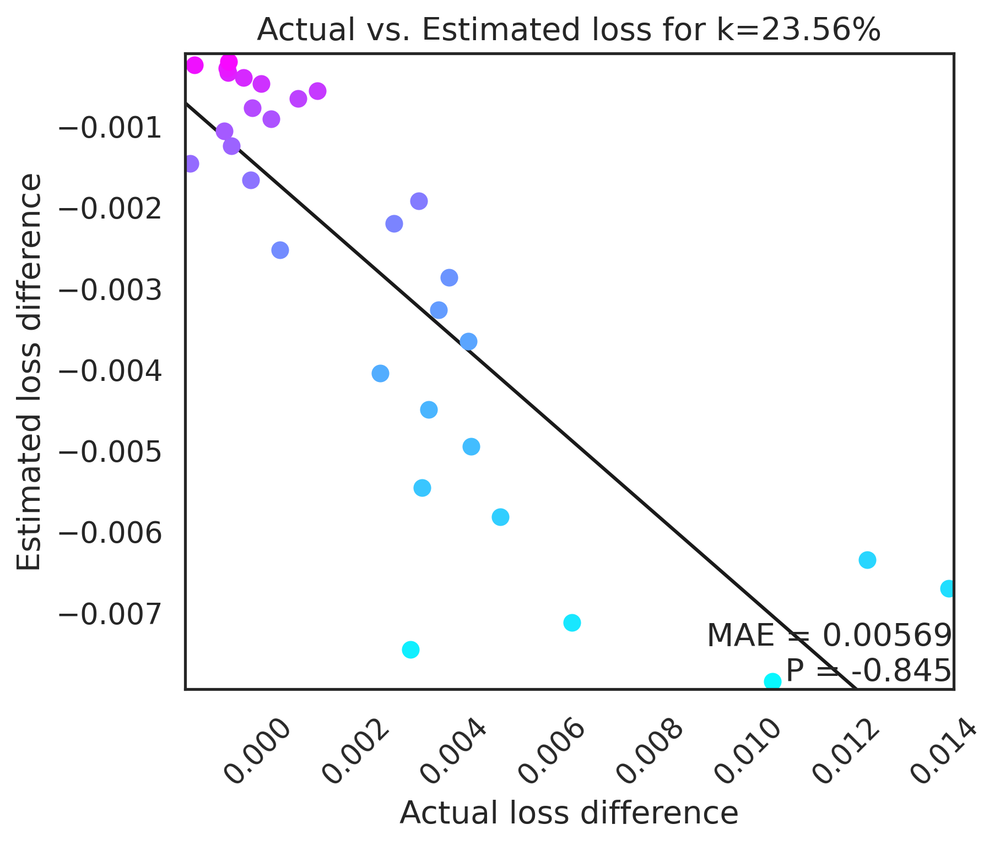


k: 26.77777777777778
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 401.51it/s, est norm=3.31]


Approx difference: 0.03500
True difference: 0.00758
ep: 0.17337931034482756
Approx difference: 0.03341
True difference: 0.01393
ep: 0.3457586206896551
Approx difference: 0.03174
True difference: 0.00956
ep: 0.5181379310344827
Approx difference: 0.02991
True difference: 0.01146
ep: 0.6905172413793103
Approx difference: 0.02803
True difference: 0.00719
ep: 0.8628965517241378
Approx difference: 0.02608
True difference: 0.00206
ep: 1.0352758620689653
Approx difference: 0.02407
True difference: 0.00944
ep: 1.207655172413793
Approx difference: 0.02206
True difference: 0.00550
ep: 1.3800344827586204
Approx difference: 0.02007
True difference: 0.00389
ep: 1.5524137931034478
Approx difference: 0.01812
True difference: 0.00418
ep: 1.7247931034482755
Approx difference: 0.01625
True difference: 0.00173
ep: 1.8971724137931032
Approx difference: 0.01448
True difference: 0.00449
ep: 2.0695517241379306
Approx difference: 0.01282
True difference: 0.00157
ep: 2.241931034482758
Approx difference: 0.01127

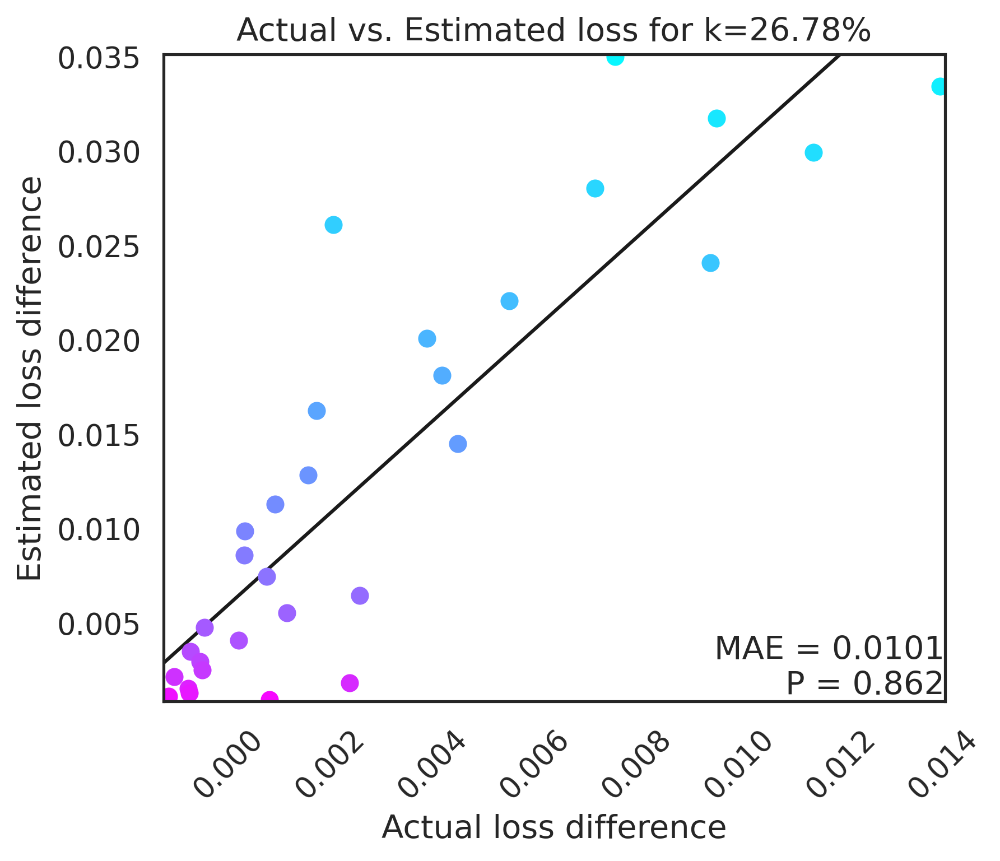


k: 30.0
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 447.36it/s, est norm=5.56]


Approx difference: 0.08134
True difference: 0.00811
ep: 0.17337931034482756
Approx difference: 0.07772
True difference: 0.00541
ep: 0.3457586206896551
Approx difference: 0.07395
True difference: 0.00520
ep: 0.5181379310344827
Approx difference: 0.07056
True difference: 0.00205
ep: 0.6905172413793103
Approx difference: 0.06580
True difference: 0.00625
ep: 0.8628965517241378
Approx difference: 0.06117
True difference: 0.01354
ep: 1.0352758620689653
Approx difference: 0.05598
True difference: 0.01779
ep: 1.207655172413793
Approx difference: 0.05170
True difference: 0.00352
ep: 1.3800344827586204
Approx difference: 0.04637
True difference: 0.00130
ep: 1.5524137931034478
Approx difference: 0.04229
True difference: 0.00180
ep: 1.7247931034482755
Approx difference: 0.03778
True difference: 0.00145
ep: 1.8971724137931032
Approx difference: 0.03379
True difference: 0.00254
ep: 2.0695517241379306
Approx difference: 0.03003
True difference: 0.00113
ep: 2.241931034482758
Approx difference: 0.02606

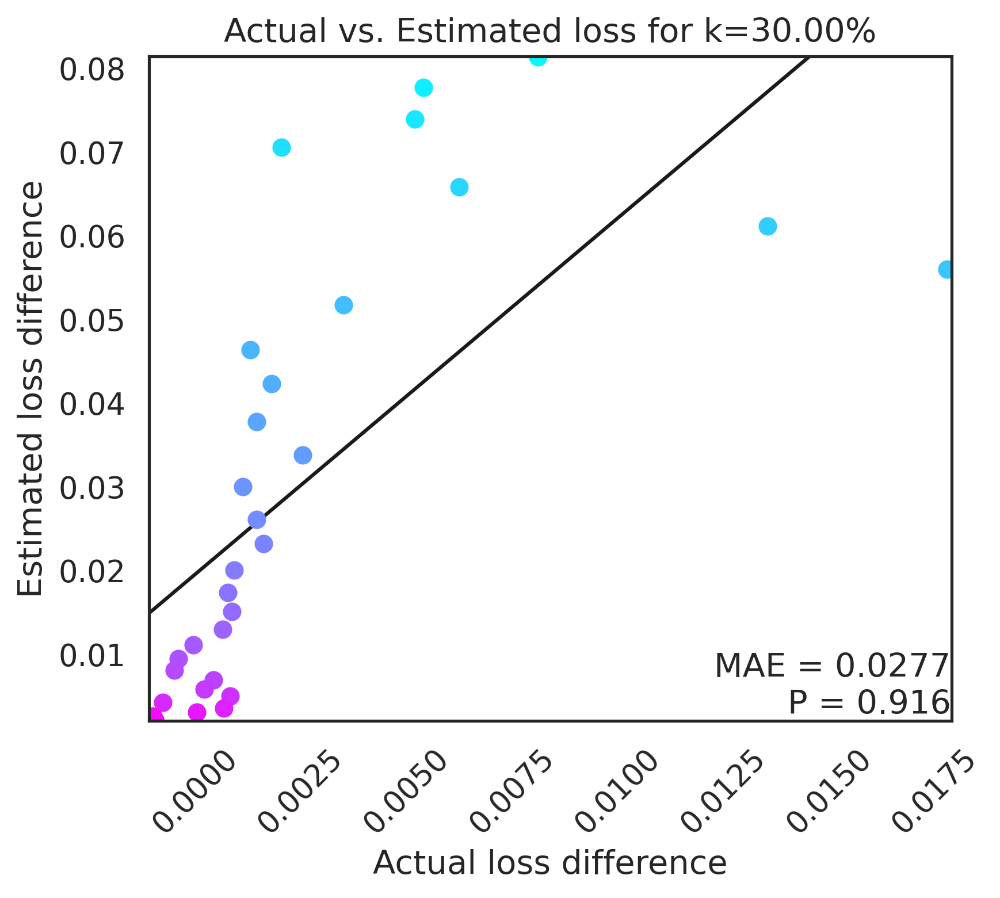


Round 2

Getting Data...
24989
Training original model...

Begining epsilon and k rounds
-----------------------------

k: 1.0
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 434.03it/s, est norm=4.38]


Approx difference: 0.00077
True difference: 0.00022
ep: 0.17337931034482756
Approx difference: 0.00074
True difference: 0.00233
ep: 0.3457586206896551
Approx difference: 0.00070
True difference: 0.00034
ep: 0.5181379310344827
Approx difference: 0.00066
True difference: 0.00143
ep: 0.6905172413793103
Approx difference: 0.00065
True difference: 0.00437
ep: 0.8628965517241378
Approx difference: 0.00059
True difference: 0.00061
ep: 1.0352758620689653
Approx difference: 0.00056
True difference: 0.00122
ep: 1.207655172413793
Approx difference: 0.00050
True difference: 0.00184
ep: 1.3800344827586204
Approx difference: 0.00043
True difference: 0.00051
ep: 1.5524137931034478
Approx difference: 0.00041
True difference: 0.00018
ep: 1.7247931034482755
Approx difference: 0.00037
True difference: 0.00189
ep: 1.8971724137931032
Approx difference: 0.00033
True difference: 0.00050
ep: 2.0695517241379306
Approx difference: 0.00029
True difference: 0.00008
ep: 2.241931034482758
Approx difference: 0.00026

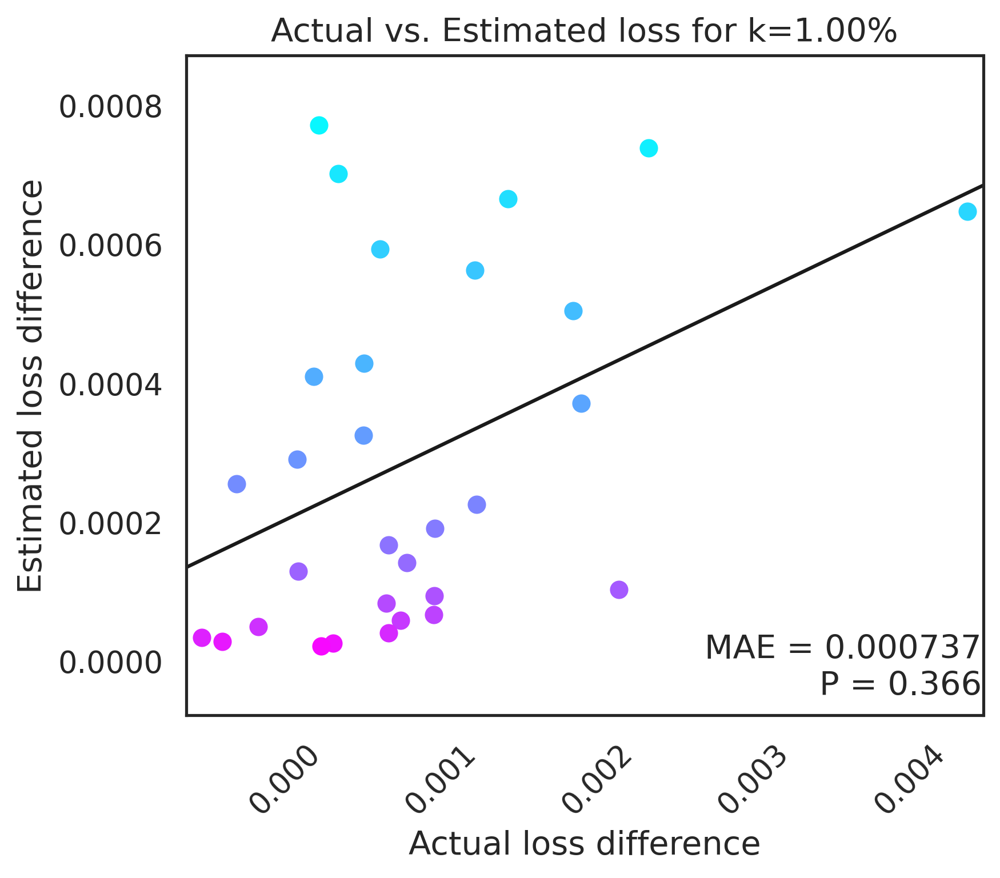


k: 4.222222222222222
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 397.52it/s, est norm=3.51]


Approx difference: 0.00991
True difference: 0.00221
ep: 0.17337931034482756
Approx difference: 0.00941
True difference: 0.00279
ep: 0.3457586206896551
Approx difference: 0.00898
True difference: 0.00156
ep: 0.5181379310344827
Approx difference: 0.00848
True difference: 0.00177
ep: 0.6905172413793103
Approx difference: 0.00785
True difference: 0.00136
ep: 0.8628965517241378
Approx difference: 0.00718
True difference: 0.00087
ep: 1.0352758620689653
Approx difference: 0.00674
True difference: 0.00170
ep: 1.207655172413793
Approx difference: 0.00619
True difference: 0.00131
ep: 1.3800344827586204
Approx difference: 0.00556
True difference: 0.00102
ep: 1.5524137931034478
Approx difference: 0.00505
True difference: 0.00241
ep: 1.7247931034482755
Approx difference: 0.00458
True difference: 0.00152
ep: 1.8971724137931032
Approx difference: 0.00413
True difference: 0.00059
ep: 2.0695517241379306
Approx difference: 0.00354
True difference: 0.00121
ep: 2.241931034482758
Approx difference: 0.00315

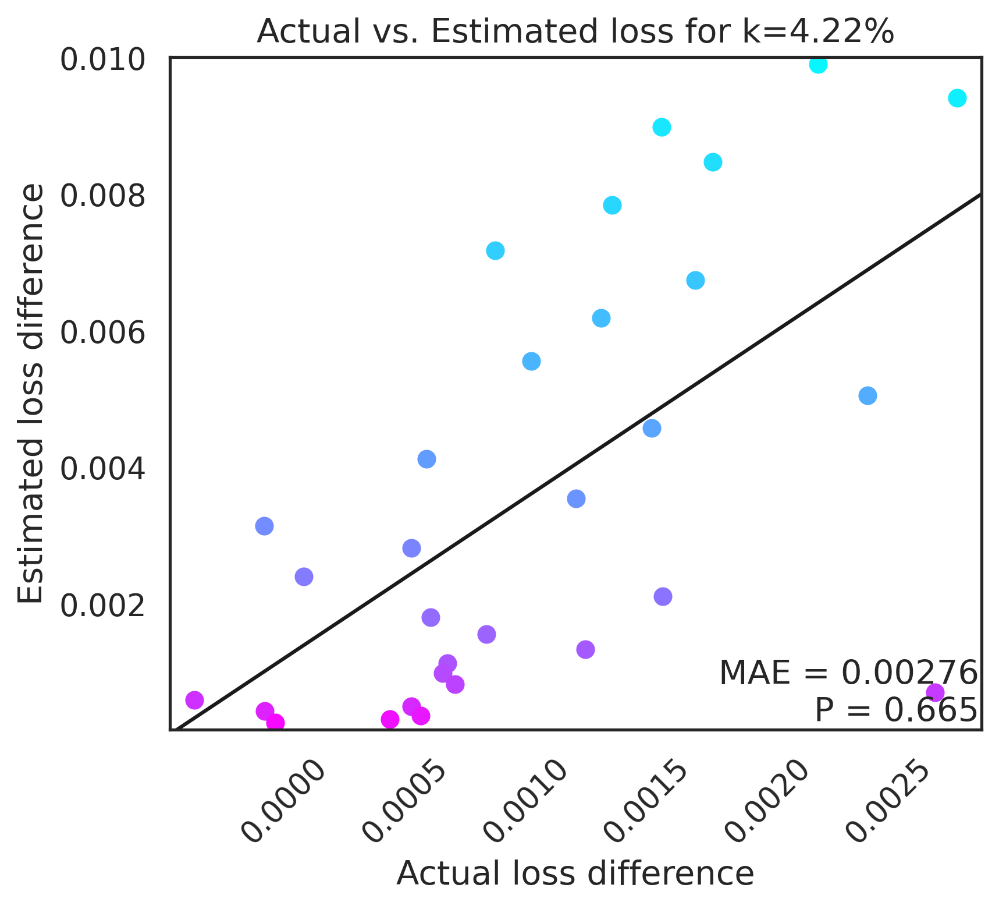


k: 7.444444444444445
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 412.52it/s, est norm=3.88]


Approx difference: 0.00833
True difference: 0.00494
ep: 0.17337931034482756
Approx difference: 0.00812
True difference: 0.00312
ep: 0.3457586206896551
Approx difference: 0.00761
True difference: 0.00239
ep: 0.5181379310344827
Approx difference: 0.00703
True difference: 0.00218
ep: 0.6905172413793103
Approx difference: 0.00652
True difference: 0.00199
ep: 0.8628965517241378
Approx difference: 0.00620
True difference: 0.00305
ep: 1.0352758620689653
Approx difference: 0.00591
True difference: 0.00348
ep: 1.207655172413793
Approx difference: 0.00511
True difference: 0.00257
ep: 1.3800344827586204
Approx difference: 0.00481
True difference: 0.00249
ep: 1.5524137931034478
Approx difference: 0.00432
True difference: 0.00109
ep: 1.7247931034482755
Approx difference: 0.00384
True difference: 0.00478
ep: 1.8971724137931032
Approx difference: 0.00349
True difference: 0.00163
ep: 2.0695517241379306
Approx difference: 0.00312
True difference: -0.00026
ep: 2.241931034482758
Approx difference: 0.0027

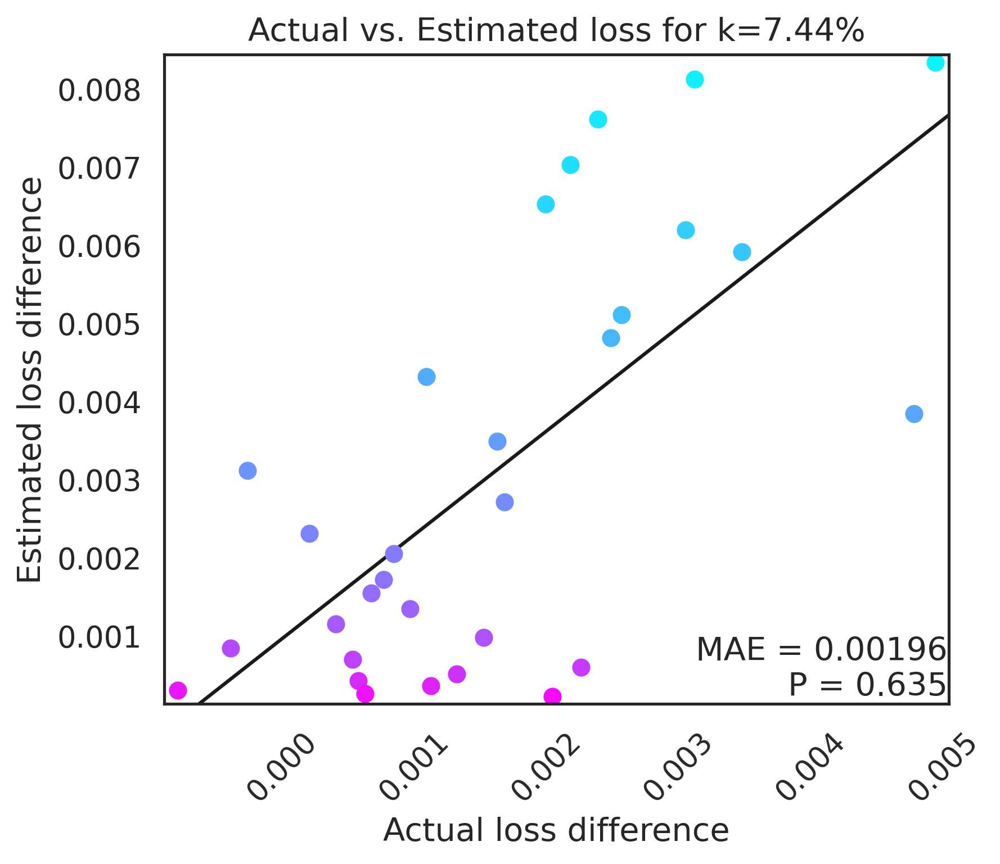


k: 10.666666666666668
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 429.32it/s, est norm=5.63]


Approx difference: 0.01578
True difference: 0.00526
ep: 0.17337931034482756
Approx difference: 0.01493
True difference: 0.00480
ep: 0.3457586206896551
Approx difference: 0.01428
True difference: 0.00413
ep: 0.5181379310344827
Approx difference: 0.01348
True difference: 0.00410
ep: 0.6905172413793103
Approx difference: 0.01263
True difference: 0.00270
ep: 0.8628965517241378
Approx difference: 0.01178
True difference: 0.00271
ep: 1.0352758620689653
Approx difference: 0.01083
True difference: 0.00298
ep: 1.207655172413793
Approx difference: 0.00994
True difference: 0.00346
ep: 1.3800344827586204
Approx difference: 0.00897
True difference: 0.00229
ep: 1.5524137931034478
Approx difference: 0.00816
True difference: 0.00219
ep: 1.7247931034482755
Approx difference: 0.00730
True difference: 0.00196
ep: 1.8971724137931032
Approx difference: 0.00652
True difference: 0.00199
ep: 2.0695517241379306
Approx difference: 0.00577
True difference: 0.00172
ep: 2.241931034482758
Approx difference: 0.00508

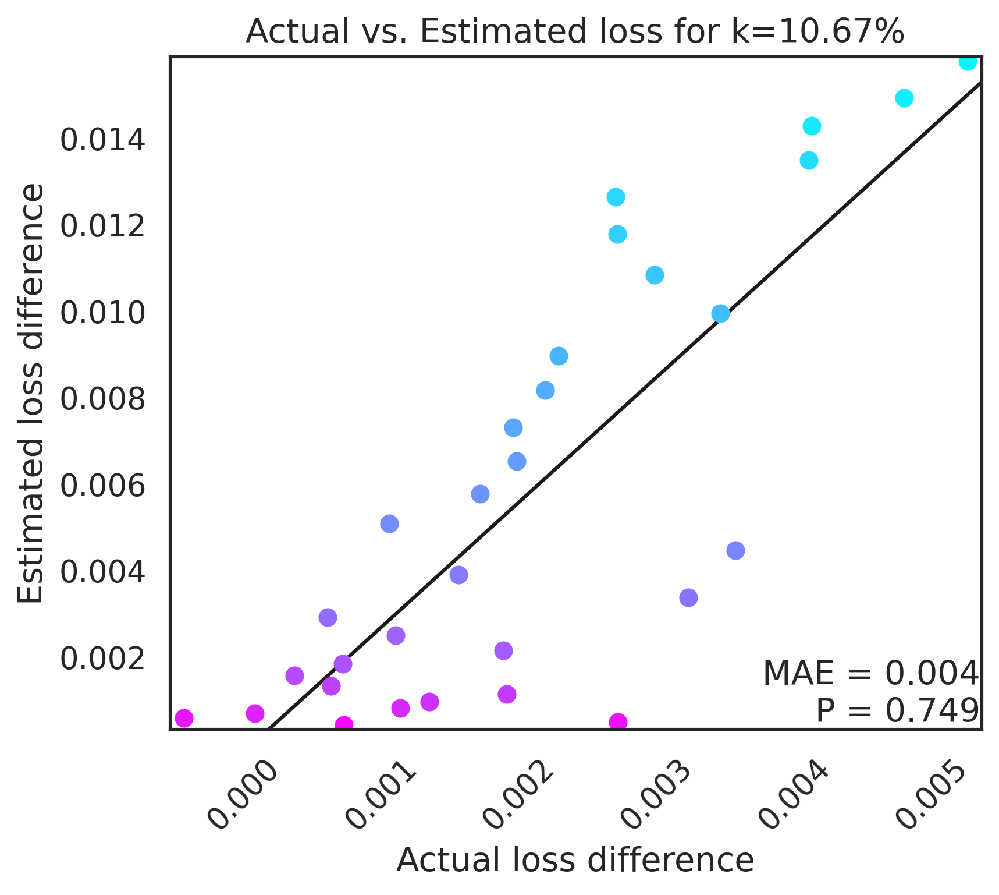


k: 13.88888888888889
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 465.51it/s, est norm=3.31]


Approx difference: 0.01410
True difference: 0.00978
ep: 0.17337931034482756
Approx difference: 0.01340
True difference: 0.00732
ep: 0.3457586206896551
Approx difference: 0.01272
True difference: 0.00509
ep: 0.5181379310344827
Approx difference: 0.01209
True difference: 0.00522
ep: 0.6905172413793103
Approx difference: 0.01134
True difference: 0.00451
ep: 0.8628965517241378
Approx difference: 0.01055
True difference: 0.00561
ep: 1.0352758620689653
Approx difference: 0.00964
True difference: 0.00645
ep: 1.207655172413793
Approx difference: 0.00883
True difference: 0.00238
ep: 1.3800344827586204
Approx difference: 0.00814
True difference: 0.00239
ep: 1.5524137931034478
Approx difference: 0.00729
True difference: 0.00206
ep: 1.7247931034482755
Approx difference: 0.00651
True difference: 0.00285
ep: 1.8971724137931032
Approx difference: 0.00582
True difference: 0.00337
ep: 2.0695517241379306
Approx difference: 0.00516
True difference: 0.00382
ep: 2.241931034482758
Approx difference: 0.00451

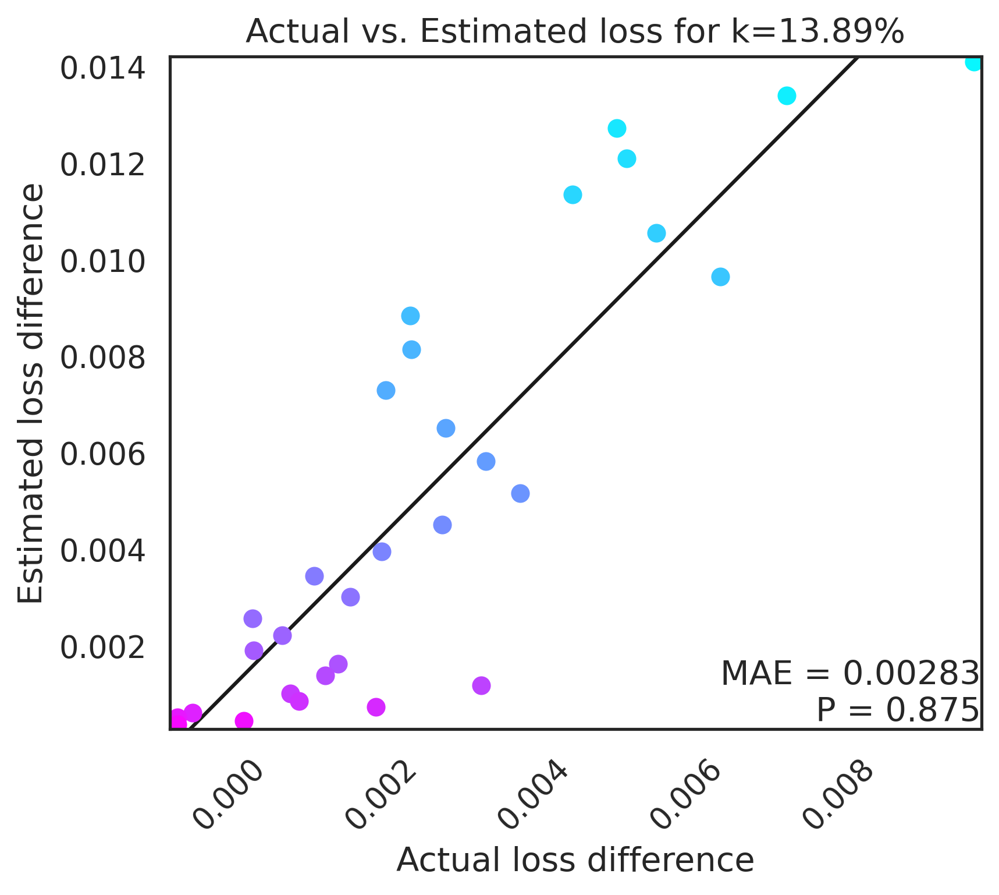


k: 17.11111111111111
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 431.05it/s, est norm=5.94]


Approx difference: 0.00922
True difference: 0.00827
ep: 0.17337931034482756
Approx difference: 0.00872
True difference: 0.00587
ep: 0.3457586206896551
Approx difference: 0.00826
True difference: 0.00810
ep: 0.5181379310344827
Approx difference: 0.00780
True difference: 0.00928
ep: 0.6905172413793103
Approx difference: 0.00737
True difference: 0.00257
ep: 0.8628965517241378
Approx difference: 0.00681
True difference: 0.00291
ep: 1.0352758620689653
Approx difference: 0.00628
True difference: 0.00534
ep: 1.207655172413793
Approx difference: 0.00574
True difference: 0.00265
ep: 1.3800344827586204
Approx difference: 0.00527
True difference: 0.00508
ep: 1.5524137931034478
Approx difference: 0.00475
True difference: 0.00292
ep: 1.7247931034482755
Approx difference: 0.00427
True difference: 0.00372
ep: 1.8971724137931032
Approx difference: 0.00382
True difference: 0.00279
ep: 2.0695517241379306
Approx difference: 0.00334
True difference: 0.00315
ep: 2.241931034482758
Approx difference: 0.00295

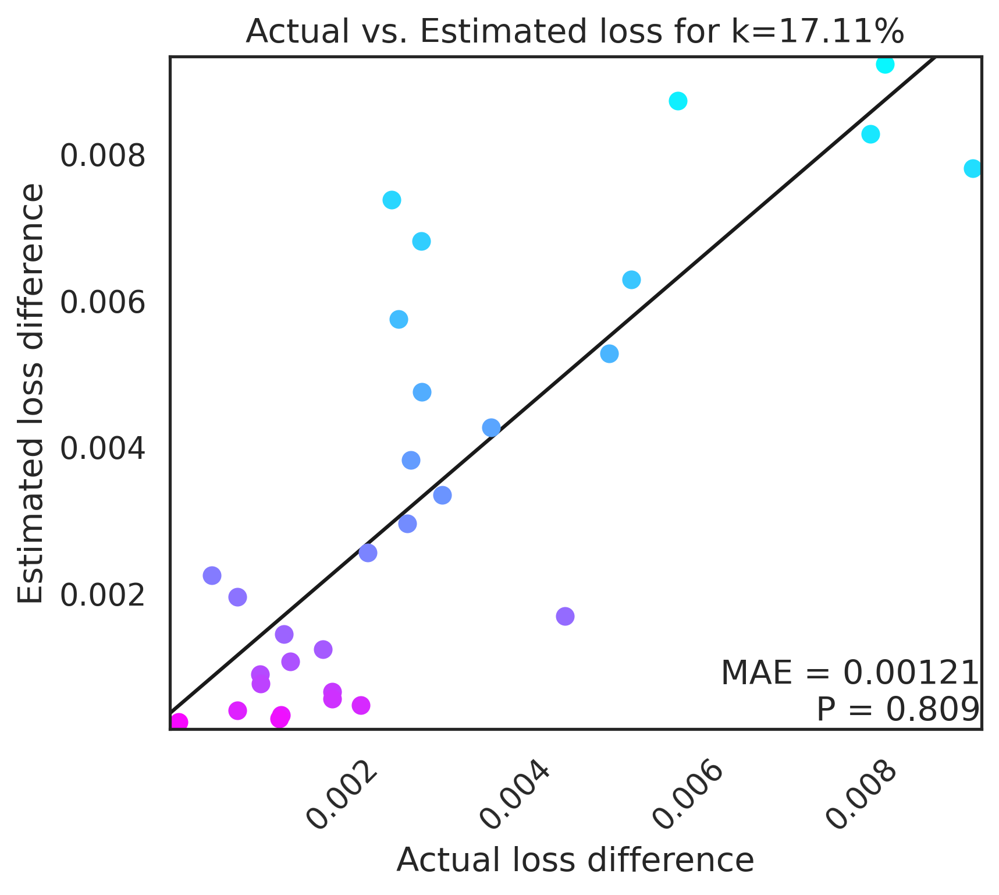


k: 20.333333333333336
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 398.30it/s, est norm=5.18]


Approx difference: 0.06498
True difference: 0.00836
ep: 0.17337931034482756
Approx difference: 0.06224
True difference: 0.00737
ep: 0.3457586206896551
Approx difference: 0.05902
True difference: 0.00610
ep: 0.5181379310344827
Approx difference: 0.05569
True difference: 0.00929
ep: 0.6905172413793103
Approx difference: 0.05197
True difference: 0.01050
ep: 0.8628965517241378
Approx difference: 0.04851
True difference: 0.00651
ep: 1.0352758620689653
Approx difference: 0.04475
True difference: 0.00419
ep: 1.207655172413793
Approx difference: 0.04104
True difference: 0.00856
ep: 1.3800344827586204
Approx difference: 0.03730
True difference: 0.00459
ep: 1.5524137931034478
Approx difference: 0.03376
True difference: 0.00492
ep: 1.7247931034482755
Approx difference: 0.03028
True difference: 0.00262
ep: 1.8971724137931032
Approx difference: 0.02694
True difference: 0.00367
ep: 2.0695517241379306
Approx difference: 0.02383
True difference: 0.00183
ep: 2.241931034482758
Approx difference: 0.02094

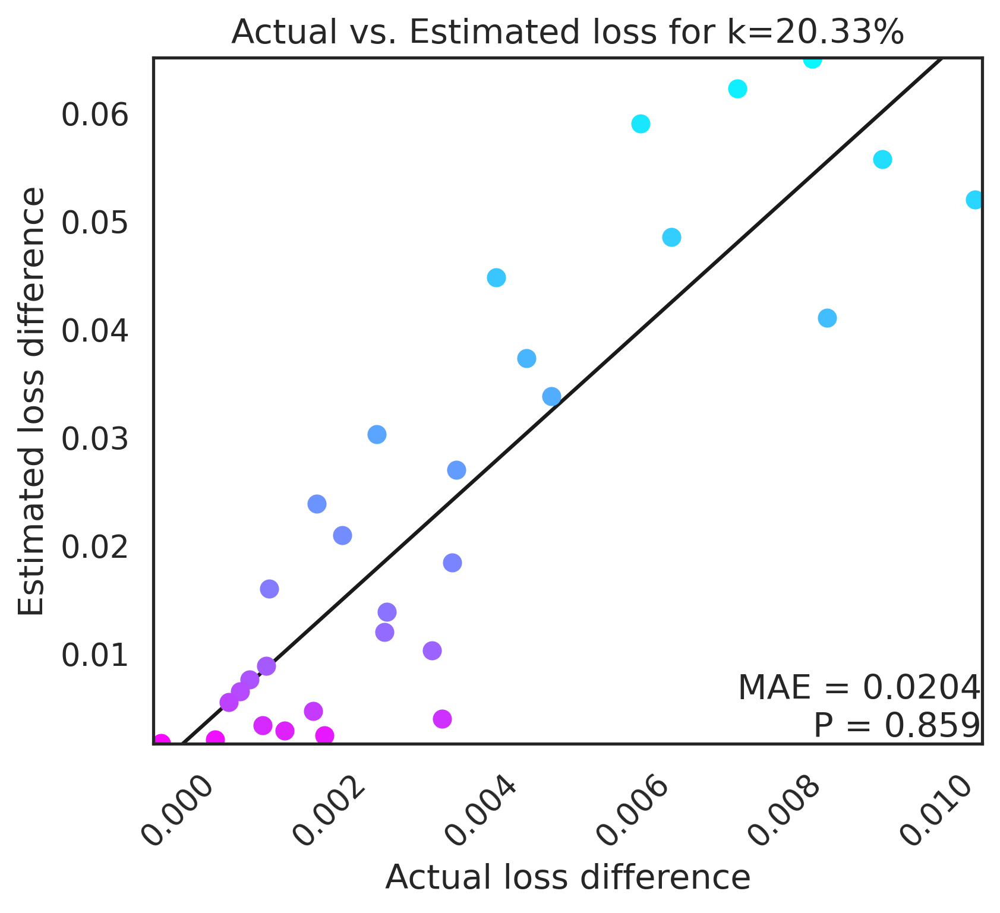


k: 23.555555555555557
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 419.55it/s, est norm=4.16]


Approx difference: 0.05789
True difference: 0.01442
ep: 0.17337931034482756
Approx difference: 0.05543
True difference: 0.01844
ep: 0.3457586206896551
Approx difference: 0.05248
True difference: 0.00864
ep: 0.5181379310344827
Approx difference: 0.04946
True difference: 0.01161
ep: 0.6905172413793103
Approx difference: 0.04643
True difference: 0.00940
ep: 0.8628965517241378
Approx difference: 0.04319
True difference: 0.00619
ep: 1.0352758620689653
Approx difference: 0.03978
True difference: 0.00947
ep: 1.207655172413793
Approx difference: 0.03657
True difference: 0.00811
ep: 1.3800344827586204
Approx difference: 0.03322
True difference: 0.00560
ep: 1.5524137931034478
Approx difference: 0.02999
True difference: 0.00329
ep: 1.7247931034482755
Approx difference: 0.02693
True difference: 0.00257
ep: 1.8971724137931032
Approx difference: 0.02402
True difference: 0.00462
ep: 2.0695517241379306
Approx difference: 0.02123
True difference: 0.00253
ep: 2.241931034482758
Approx difference: 0.01868

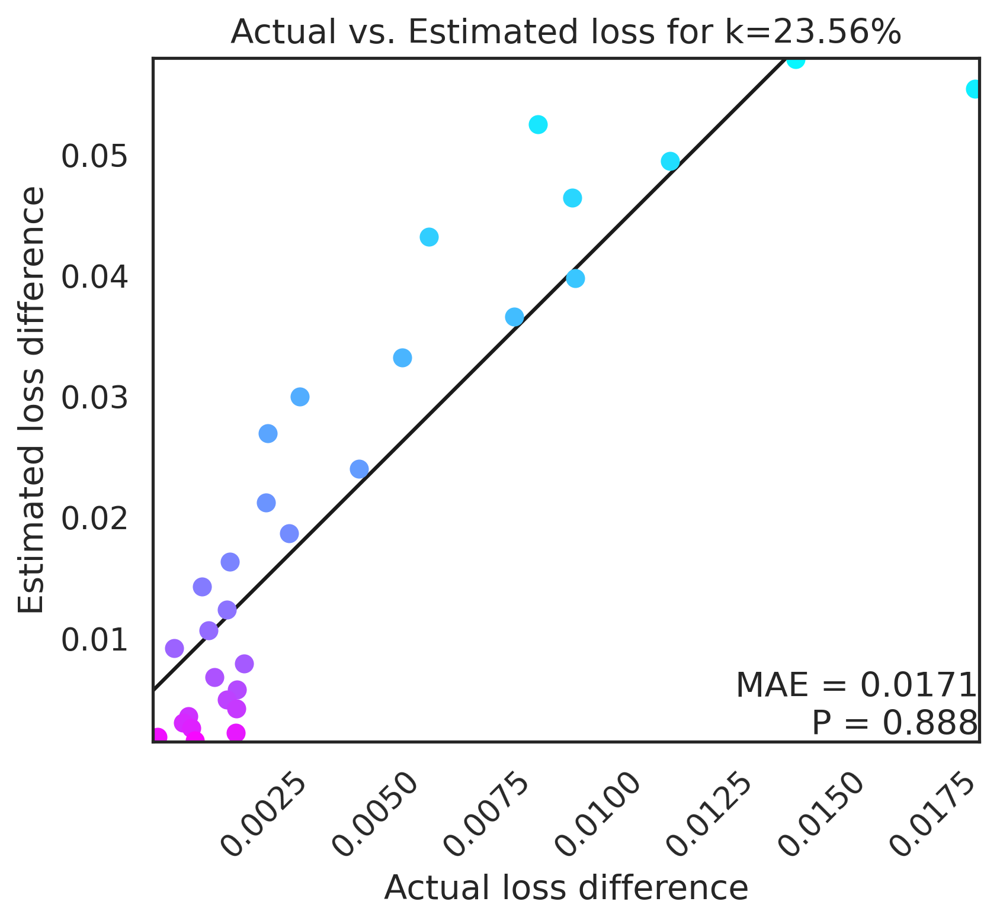


k: 26.77777777777778
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 447.67it/s, est norm=4.26]


Approx difference: 0.02513
True difference: 0.01004
ep: 0.17337931034482756
Approx difference: 0.02399
True difference: 0.00590
ep: 0.3457586206896551
Approx difference: 0.02276
True difference: 0.00852
ep: 0.5181379310344827
Approx difference: 0.02149
True difference: 0.01549
ep: 0.6905172413793103
Approx difference: 0.02013
True difference: 0.00665
ep: 0.8628965517241378
Approx difference: 0.01874
True difference: 0.00865
ep: 1.0352758620689653
Approx difference: 0.01727
True difference: 0.01135
ep: 1.207655172413793
Approx difference: 0.01582
True difference: 0.00452
ep: 1.3800344827586204
Approx difference: 0.01442
True difference: 0.00647
ep: 1.5524137931034478
Approx difference: 0.01302
True difference: 0.00348
ep: 1.7247931034482755
Approx difference: 0.01168
True difference: 0.00509
ep: 1.8971724137931032
Approx difference: 0.01041
True difference: 0.00289
ep: 2.0695517241379306
Approx difference: 0.00920
True difference: 0.00457
ep: 2.241931034482758
Approx difference: 0.00810

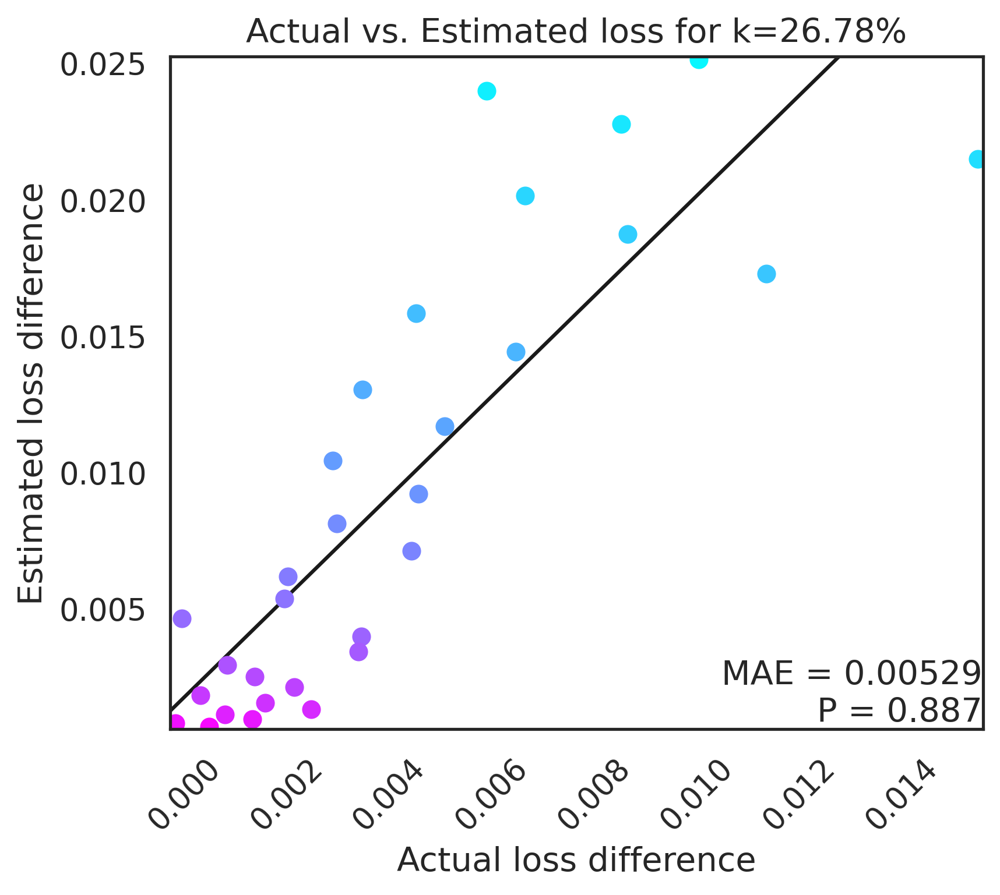


k: 30.0
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 412.57it/s, est norm=4.22]


Approx difference: 0.09076
True difference: 0.00849
ep: 0.17337931034482756
Approx difference: 0.08663
True difference: 0.01381
ep: 0.3457586206896551
Approx difference: 0.08251
True difference: 0.01985
ep: 0.5181379310344827
Approx difference: 0.07752
True difference: 0.01350
ep: 0.6905172413793103
Approx difference: 0.07268
True difference: 0.01211
ep: 0.8628965517241378
Approx difference: 0.06763
True difference: 0.00755
ep: 1.0352758620689653
Approx difference: 0.06280
True difference: 0.01211
ep: 1.207655172413793
Approx difference: 0.05714
True difference: 0.00642
ep: 1.3800344827586204
Approx difference: 0.05185
True difference: 0.00578
ep: 1.5524137931034478
Approx difference: 0.04713
True difference: 0.01237
ep: 1.7247931034482755
Approx difference: 0.04223
True difference: 0.00352
ep: 1.8971724137931032
Approx difference: 0.03772
True difference: 0.00755
ep: 2.0695517241379306
Approx difference: 0.03318
True difference: 0.00263
ep: 2.241931034482758
Approx difference: 0.02920

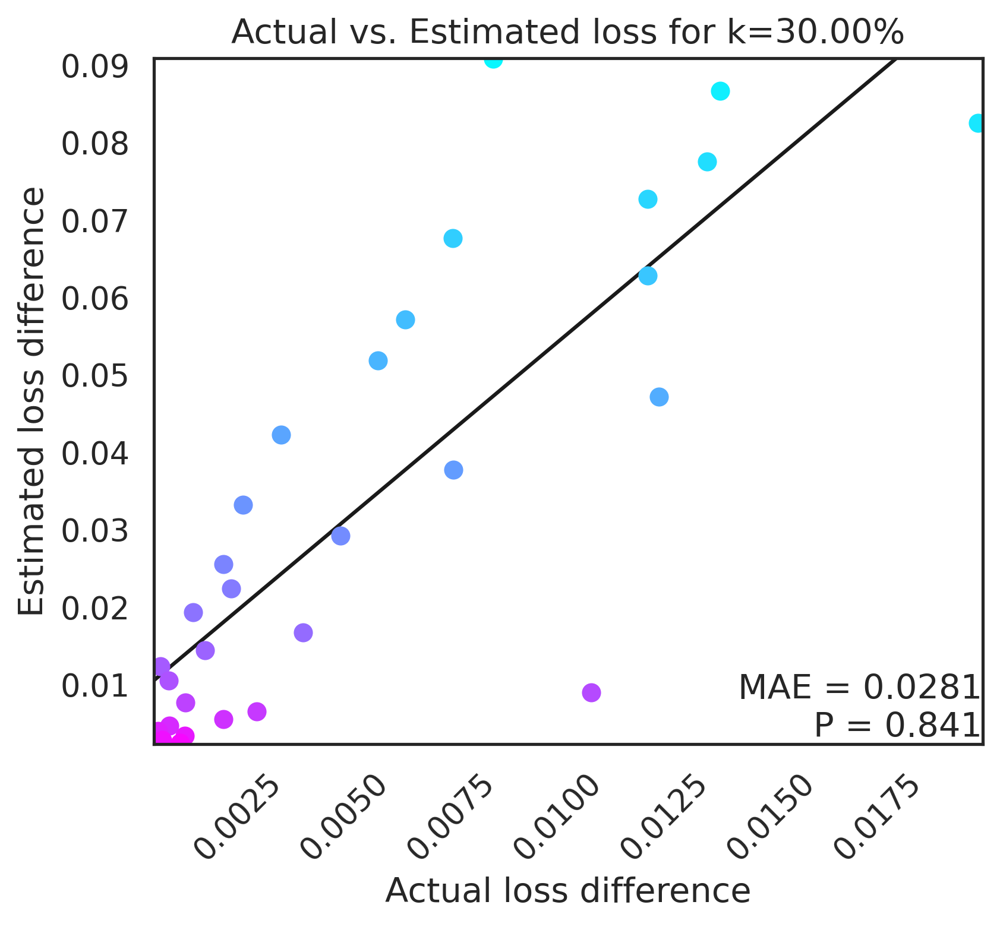


Round 3

Getting Data...
24989
Training original model...

Begining epsilon and k rounds
-----------------------------

k: 1.0
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 447.70it/s, est norm=3.72]


Approx difference: 0.00173
True difference: 0.00123
ep: 0.17337931034482756
Approx difference: 0.00156
True difference: 0.00153
ep: 0.3457586206896551
Approx difference: 0.00161
True difference: 0.00030
ep: 0.5181379310344827
Approx difference: 0.00147
True difference: 0.00067
ep: 0.6905172413793103
Approx difference: 0.00137
True difference: -0.00005
ep: 0.8628965517241378
Approx difference: 0.00127
True difference: 0.00008
ep: 1.0352758620689653
Approx difference: 0.00119
True difference: -0.00007
ep: 1.207655172413793
Approx difference: 0.00114
True difference: -0.00151
ep: 1.3800344827586204
Approx difference: 0.00101
True difference: 0.00081
ep: 1.5524137931034478
Approx difference: 0.00089
True difference: 0.00023
ep: 1.7247931034482755
Approx difference: 0.00078
True difference: -0.00013
ep: 1.8971724137931032
Approx difference: 0.00068
True difference: 0.00008
ep: 2.0695517241379306
Approx difference: 0.00062
True difference: -0.00133
ep: 2.241931034482758
Approx difference: 0.

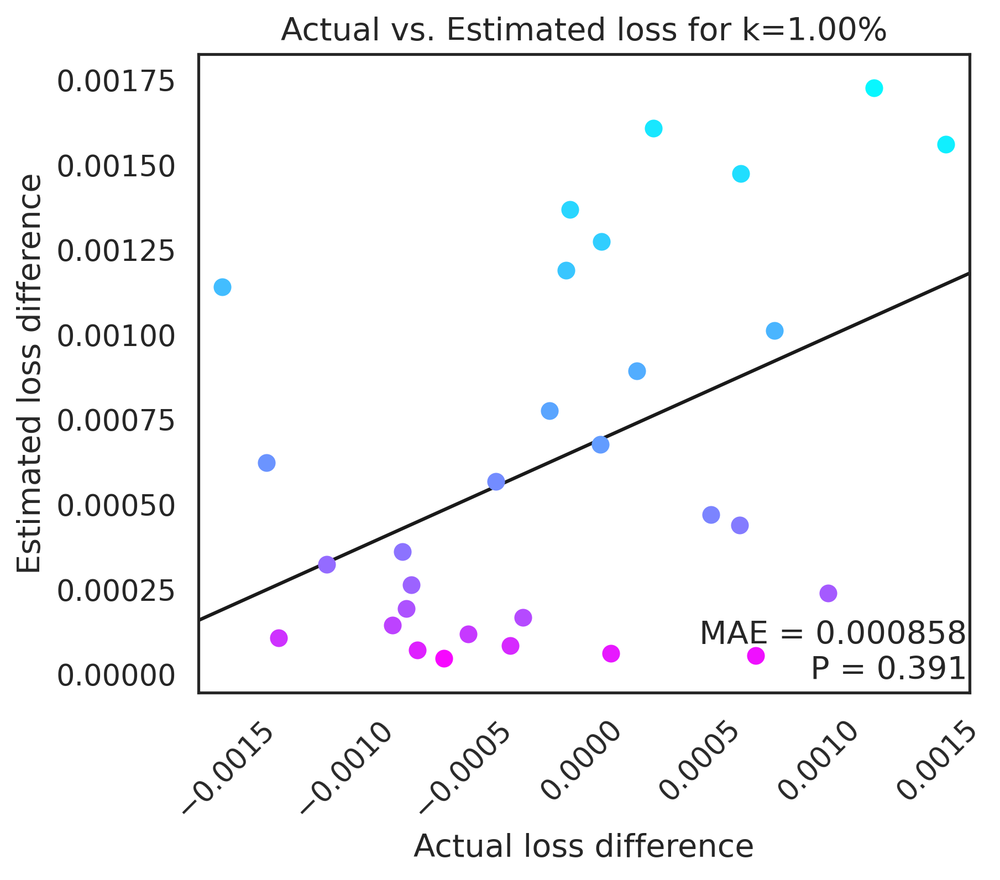


k: 4.222222222222222
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 443.16it/s, est norm=3.82]


Approx difference: -0.00222
True difference: 0.00176
ep: 0.17337931034482756
Approx difference: -0.00213
True difference: 0.00066
ep: 0.3457586206896551
Approx difference: -0.00198
True difference: 0.00081
ep: 0.5181379310344827
Approx difference: -0.00188
True difference: 0.00051
ep: 0.6905172413793103
Approx difference: -0.00180
True difference: 0.00196
ep: 0.8628965517241378
Approx difference: -0.00168
True difference: 0.00008
ep: 1.0352758620689653
Approx difference: -0.00157
True difference: 0.00045
ep: 1.207655172413793
Approx difference: -0.00143
True difference: 0.00153
ep: 1.3800344827586204
Approx difference: -0.00127
True difference: 0.00070
ep: 1.5524137931034478
Approx difference: -0.00114
True difference: 0.00095
ep: 1.7247931034482755
Approx difference: -0.00107
True difference: 0.00166
ep: 1.8971724137931032
Approx difference: -0.00094
True difference: 0.00176
ep: 2.0695517241379306
Approx difference: -0.00081
True difference: 0.00147
ep: 2.241931034482758
Approx differ

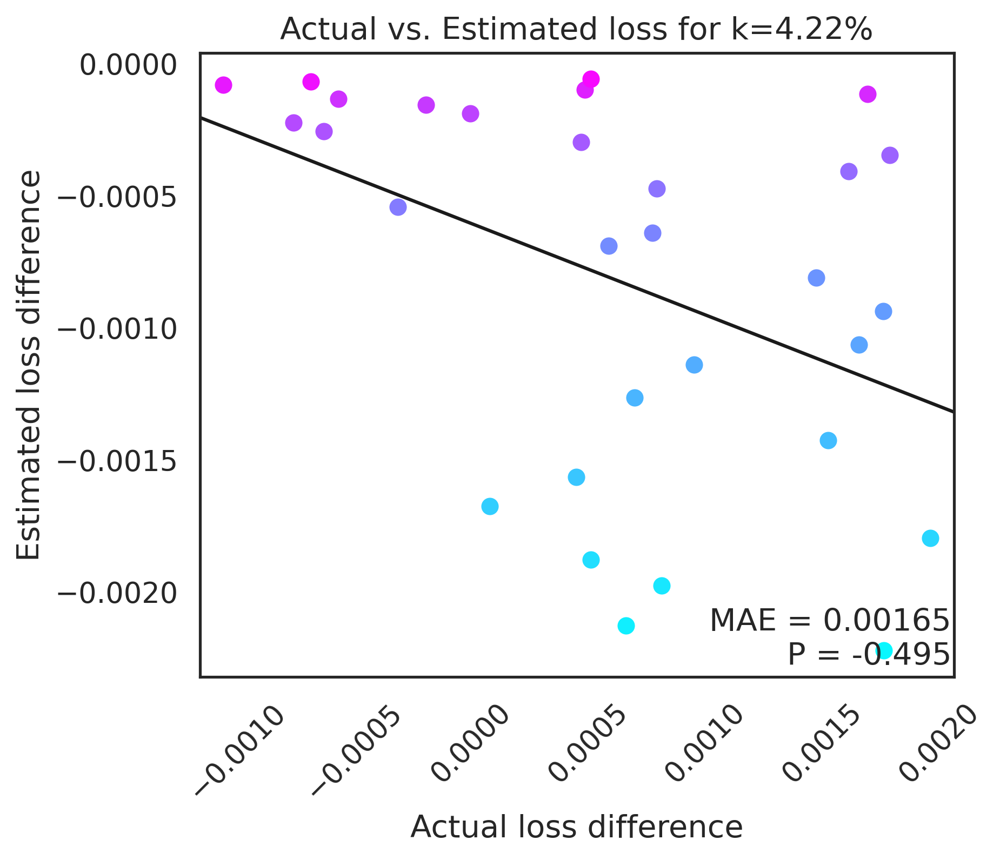


k: 7.444444444444445
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 425.35it/s, est norm=4.36]


Approx difference: 0.01392
True difference: 0.00345
ep: 0.17337931034482756
Approx difference: 0.01300
True difference: 0.00550
ep: 0.3457586206896551
Approx difference: 0.01244
True difference: 0.00136
ep: 0.5181379310344827
Approx difference: 0.01157
True difference: 0.00148
ep: 0.6905172413793103
Approx difference: 0.01110
True difference: 0.00080
ep: 0.8628965517241378
Approx difference: 0.01005
True difference: 0.00241
ep: 1.0352758620689653
Approx difference: 0.00938
True difference: 0.00079
ep: 1.207655172413793
Approx difference: 0.00868
True difference: 0.00104
ep: 1.3800344827586204
Approx difference: 0.00797
True difference: 0.00145
ep: 1.5524137931034478
Approx difference: 0.00710
True difference: 0.00027
ep: 1.7247931034482755
Approx difference: 0.00644
True difference: 0.00073
ep: 1.8971724137931032
Approx difference: 0.00567
True difference: 0.00100
ep: 2.0695517241379306
Approx difference: 0.00491
True difference: 0.00089
ep: 2.241931034482758
Approx difference: 0.00449

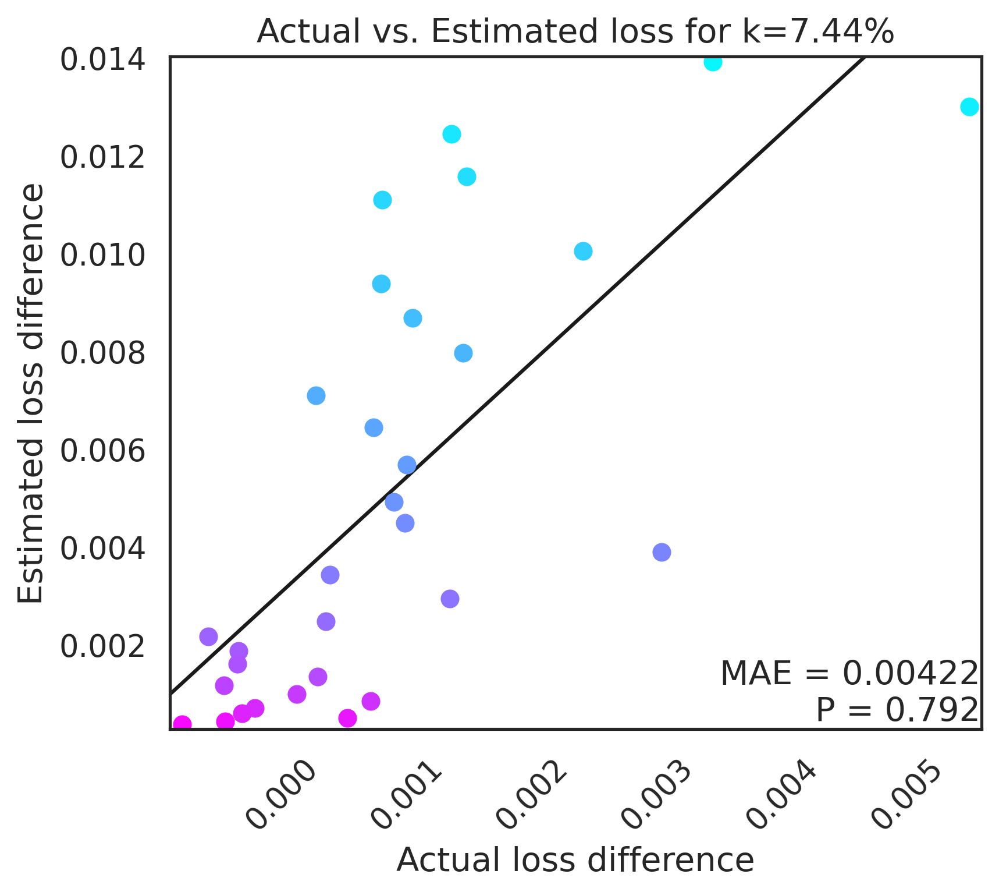


k: 10.666666666666668
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 432.66it/s, est norm=7.12]


Approx difference: 0.00232
True difference: 0.00937
ep: 0.17337931034482756
Approx difference: 0.00217
True difference: 0.00304
ep: 0.3457586206896551
Approx difference: 0.00212
True difference: 0.00322
ep: 0.5181379310344827
Approx difference: 0.00193
True difference: 0.00316
ep: 0.6905172413793103
Approx difference: 0.00187
True difference: 0.00305
ep: 0.8628965517241378
Approx difference: 0.00178
True difference: 0.00232
ep: 1.0352758620689653
Approx difference: 0.00153
True difference: 0.00310
ep: 1.207655172413793
Approx difference: 0.00138
True difference: 0.00113
ep: 1.3800344827586204
Approx difference: 0.00126
True difference: 0.00223
ep: 1.5524137931034478
Approx difference: 0.00115
True difference: 0.00167
ep: 1.7247931034482755
Approx difference: 0.00109
True difference: 0.00119
ep: 1.8971724137931032
Approx difference: 0.00094
True difference: 0.00055
ep: 2.0695517241379306
Approx difference: 0.00085
True difference: 0.00172
ep: 2.241931034482758
Approx difference: 0.00076

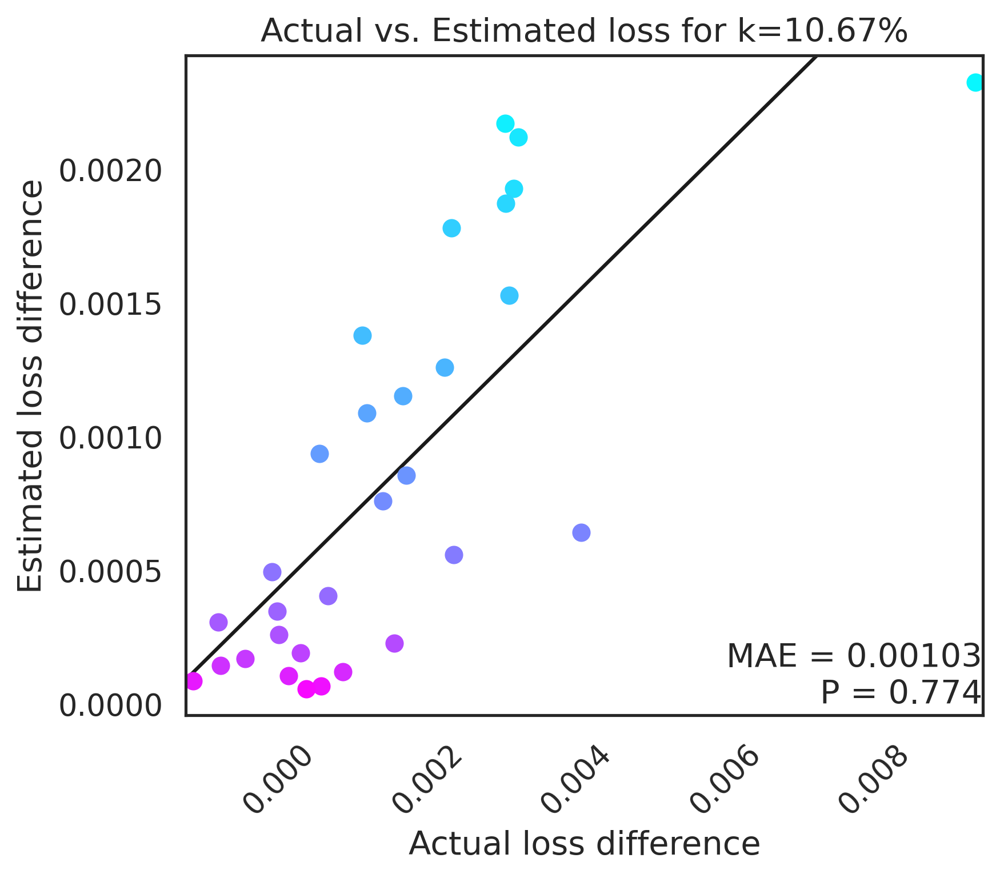


k: 13.88888888888889
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 428.15it/s, est norm=3.53]


Approx difference: 0.01279
True difference: 0.00545
ep: 0.17337931034482756
Approx difference: 0.01213
True difference: 0.01264
ep: 0.3457586206896551
Approx difference: 0.01159
True difference: 0.00469
ep: 0.5181379310344827
Approx difference: 0.01093
True difference: 0.00502
ep: 0.6905172413793103
Approx difference: 0.01026
True difference: 0.00519
ep: 0.8628965517241378
Approx difference: 0.00952
True difference: 0.00307
ep: 1.0352758620689653
Approx difference: 0.00889
True difference: 0.00428
ep: 1.207655172413793
Approx difference: 0.00803
True difference: 0.00456
ep: 1.3800344827586204
Approx difference: 0.00721
True difference: 0.00455
ep: 1.5524137931034478
Approx difference: 0.00657
True difference: 0.00200
ep: 1.7247931034482755
Approx difference: 0.00595
True difference: 0.00162
ep: 1.8971724137931032
Approx difference: 0.00526
True difference: 0.00230
ep: 2.0695517241379306
Approx difference: 0.00465
True difference: 0.00152
ep: 2.241931034482758
Approx difference: 0.00409

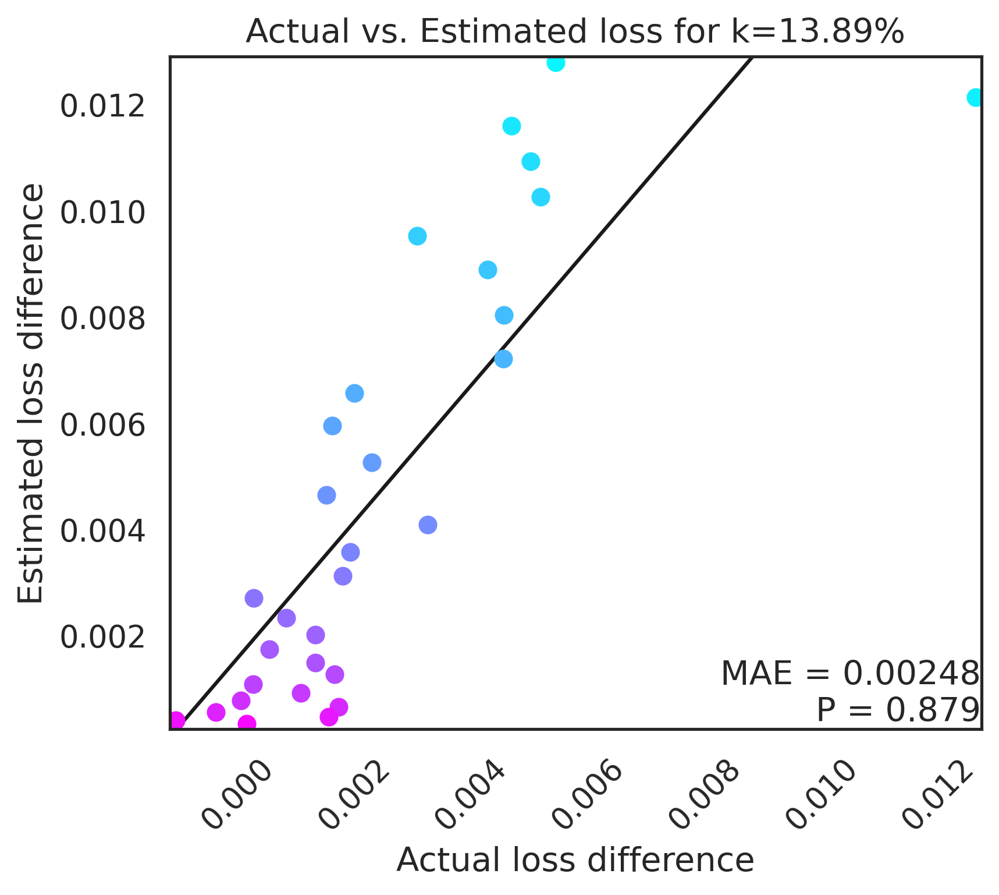


k: 17.11111111111111
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 437.07it/s, est norm=3.68]


Approx difference: 0.01601
True difference: 0.00310
ep: 0.17337931034482756
Approx difference: 0.01524
True difference: 0.00588
ep: 0.3457586206896551
Approx difference: 0.01454
True difference: 0.00736
ep: 0.5181379310344827
Approx difference: 0.01364
True difference: 0.00448
ep: 0.6905172413793103
Approx difference: 0.01276
True difference: 0.01133
ep: 0.8628965517241378
Approx difference: 0.01193
True difference: 0.00884
ep: 1.0352758620689653
Approx difference: 0.01110
True difference: 0.00612
ep: 1.207655172413793
Approx difference: 0.01011
True difference: 0.00263
ep: 1.3800344827586204
Approx difference: 0.00914
True difference: 0.00657
ep: 1.5524137931034478
Approx difference: 0.00825
True difference: 0.00351
ep: 1.7247931034482755
Approx difference: 0.00741
True difference: 0.00190
ep: 1.8971724137931032
Approx difference: 0.00666
True difference: 0.00089
ep: 2.0695517241379306
Approx difference: 0.00589
True difference: 0.00264
ep: 2.241931034482758
Approx difference: 0.00515

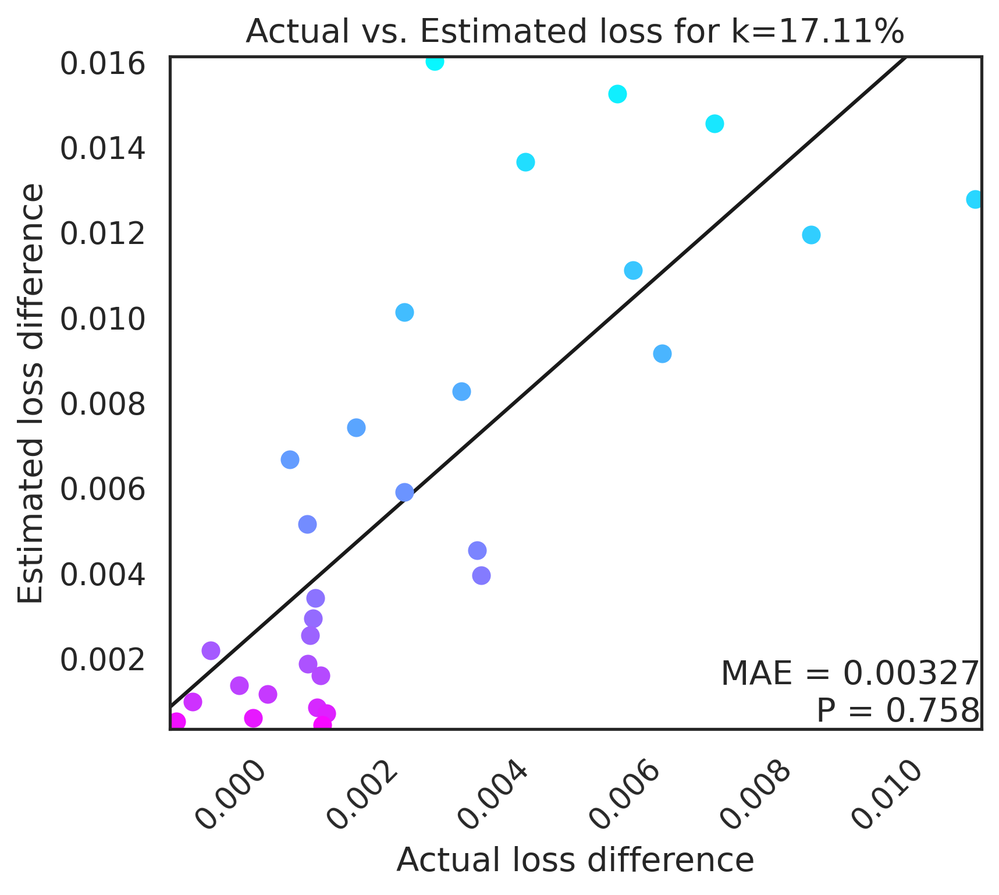


k: 20.333333333333336
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 463.78it/s, est norm=5.89]


Approx difference: 0.01239
True difference: 0.00913
ep: 0.17337931034482756
Approx difference: 0.01175
True difference: 0.00750
ep: 0.3457586206896551
Approx difference: 0.01115
True difference: 0.00502
ep: 0.5181379310344827
Approx difference: 0.01059
True difference: 0.00569
ep: 0.6905172413793103
Approx difference: 0.00986
True difference: 0.00317
ep: 0.8628965517241378
Approx difference: 0.00919
True difference: 0.00531
ep: 1.0352758620689653
Approx difference: 0.00850
True difference: 0.00331
ep: 1.207655172413793
Approx difference: 0.00780
True difference: 0.00666
ep: 1.3800344827586204
Approx difference: 0.00709
True difference: 0.00196
ep: 1.5524137931034478
Approx difference: 0.00640
True difference: 0.00366
ep: 1.7247931034482755
Approx difference: 0.00572
True difference: 0.00291
ep: 1.8971724137931032
Approx difference: 0.00510
True difference: 0.00361
ep: 2.0695517241379306
Approx difference: 0.00454
True difference: 0.00182
ep: 2.241931034482758
Approx difference: 0.00398

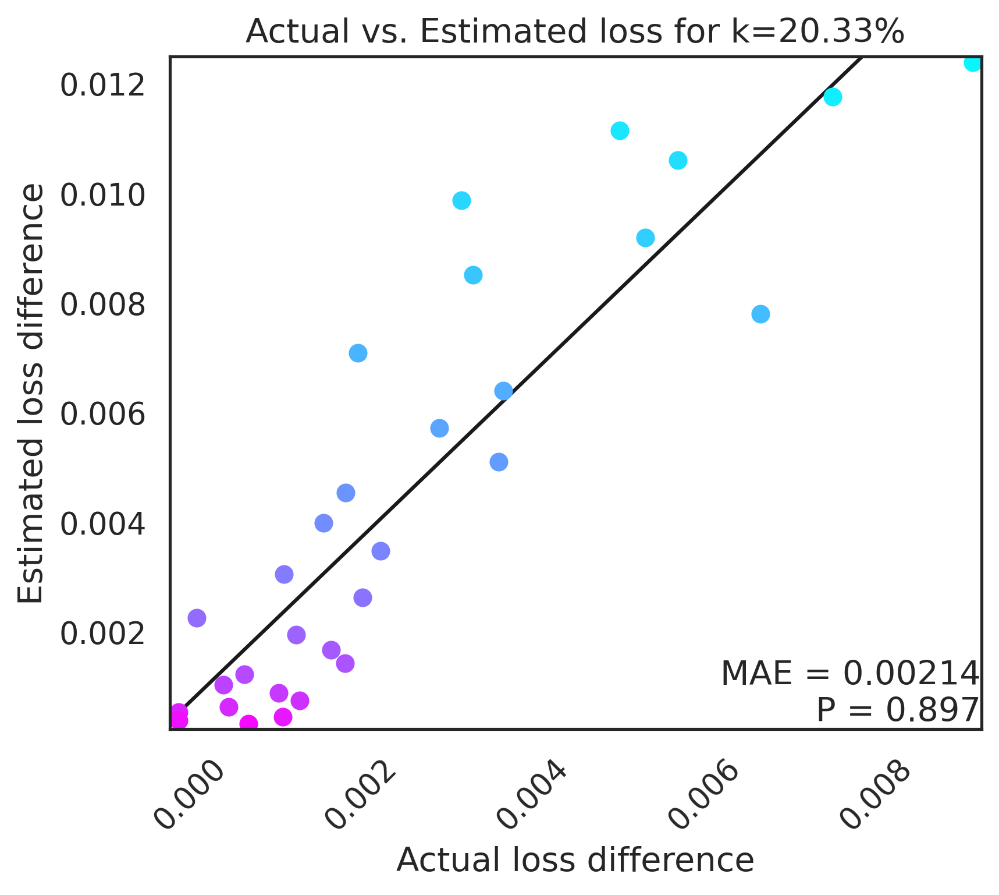


k: 23.555555555555557
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 416.29it/s, est norm=3.53]


Approx difference: 0.03352
True difference: 0.00661
ep: 0.17337931034482756
Approx difference: 0.03202
True difference: 0.01151
ep: 0.3457586206896551
Approx difference: 0.03041
True difference: 0.00407
ep: 0.5181379310344827
Approx difference: 0.02869
True difference: 0.01030
ep: 0.6905172413793103
Approx difference: 0.02684
True difference: 0.00372
ep: 0.8628965517241378
Approx difference: 0.02501
True difference: 0.00484
ep: 1.0352758620689653
Approx difference: 0.02309
True difference: 0.00756
ep: 1.207655172413793
Approx difference: 0.02112
True difference: 0.00284
ep: 1.3800344827586204
Approx difference: 0.01919
True difference: 0.00492
ep: 1.5524137931034478
Approx difference: 0.01731
True difference: 0.00255
ep: 1.7247931034482755
Approx difference: 0.01554
True difference: 0.00388
ep: 1.8971724137931032
Approx difference: 0.01389
True difference: 0.00333
ep: 2.0695517241379306
Approx difference: 0.01231
True difference: 0.00338
ep: 2.241931034482758
Approx difference: 0.01081

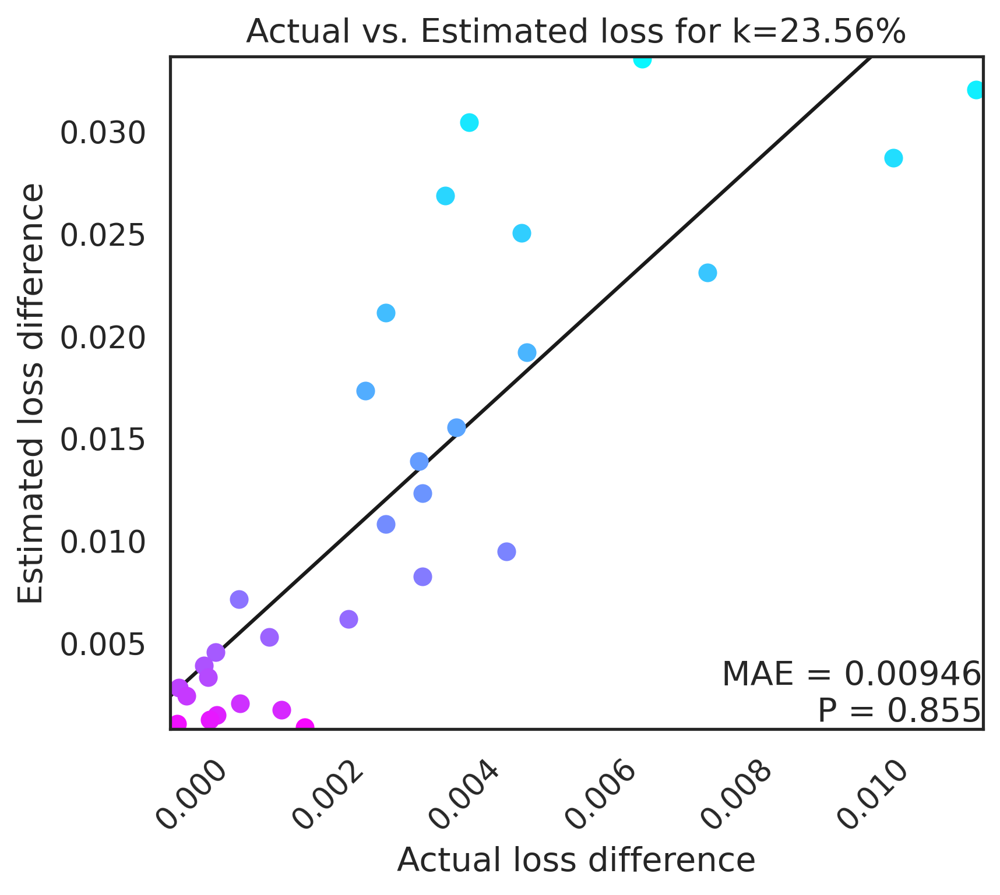


k: 26.77777777777778
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 433.00it/s, est norm=5.78]


Approx difference: 0.07037
True difference: 0.01055
ep: 0.17337931034482756
Approx difference: 0.06716
True difference: 0.00800
ep: 0.3457586206896551
Approx difference: 0.06380
True difference: 0.01006
ep: 0.5181379310344827
Approx difference: 0.06015
True difference: 0.00875
ep: 0.6905172413793103
Approx difference: 0.05632
True difference: 0.01482
ep: 0.8628965517241378
Approx difference: 0.05244
True difference: 0.00781
ep: 1.0352758620689653
Approx difference: 0.04840
True difference: 0.00449
ep: 1.207655172413793
Approx difference: 0.04438
True difference: 0.00984
ep: 1.3800344827586204
Approx difference: 0.04035
True difference: 0.00537
ep: 1.5524137931034478
Approx difference: 0.03645
True difference: 0.00341
ep: 1.7247931034482755
Approx difference: 0.03270
True difference: 0.00392
ep: 1.8971724137931032
Approx difference: 0.02912
True difference: 0.00399
ep: 2.0695517241379306
Approx difference: 0.02577
True difference: 0.00198
ep: 2.241931034482758
Approx difference: 0.02267

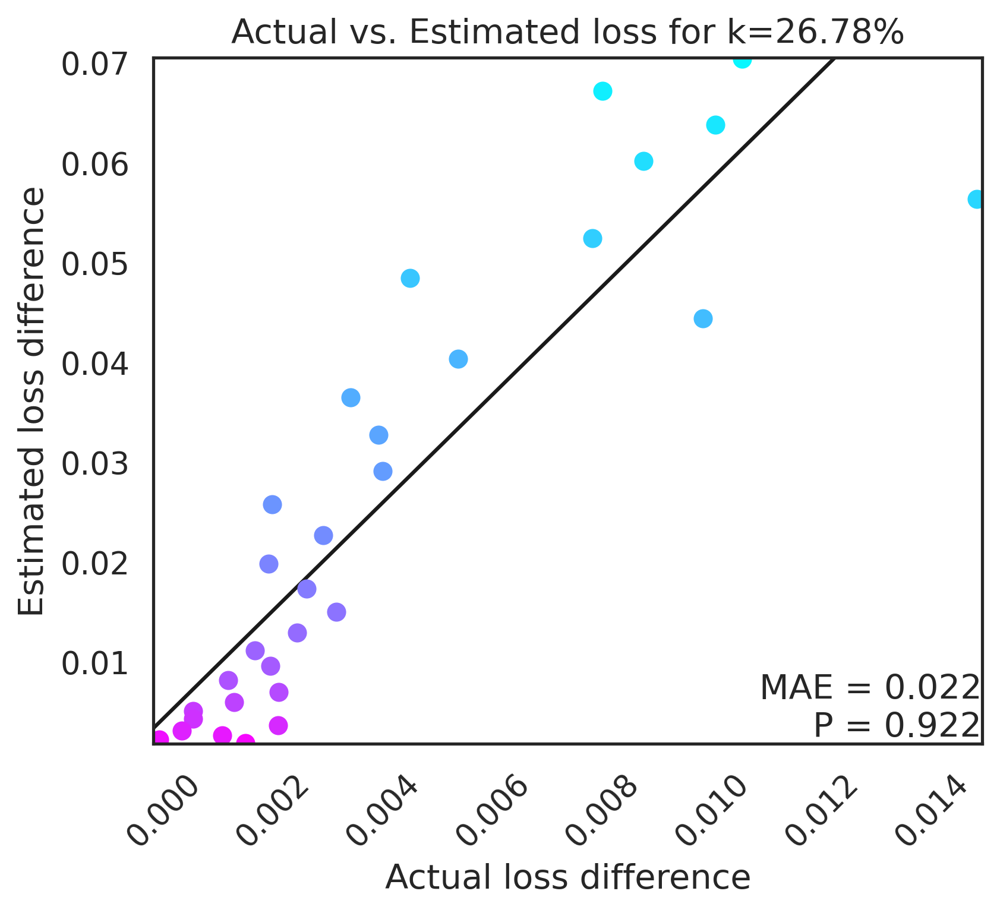


k: 30.0
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:14<00:00, 513.36it/s, est norm=7.82]


Approx difference: 0.04354
True difference: 0.00964
ep: 0.17337931034482756
Approx difference: 0.04104
True difference: 0.00891
ep: 0.3457586206896551
Approx difference: 0.03868
True difference: 0.02725
ep: 0.5181379310344827
Approx difference: 0.03675
True difference: 0.00739
ep: 0.6905172413793103
Approx difference: 0.03438
True difference: 0.01124
ep: 0.8628965517241378
Approx difference: 0.03225
True difference: 0.00240
ep: 1.0352758620689653
Approx difference: 0.02987
True difference: 0.00575
ep: 1.207655172413793
Approx difference: 0.02718
True difference: 0.00498
ep: 1.3800344827586204
Approx difference: 0.02477
True difference: 0.00246
ep: 1.5524137931034478
Approx difference: 0.02244
True difference: 0.00557
ep: 1.7247931034482755
Approx difference: 0.01994
True difference: 0.00222
ep: 1.8971724137931032
Approx difference: 0.01755
True difference: 0.00370
ep: 2.0695517241379306
Approx difference: 0.01564
True difference: 0.00196
ep: 2.241931034482758
Approx difference: 0.01387

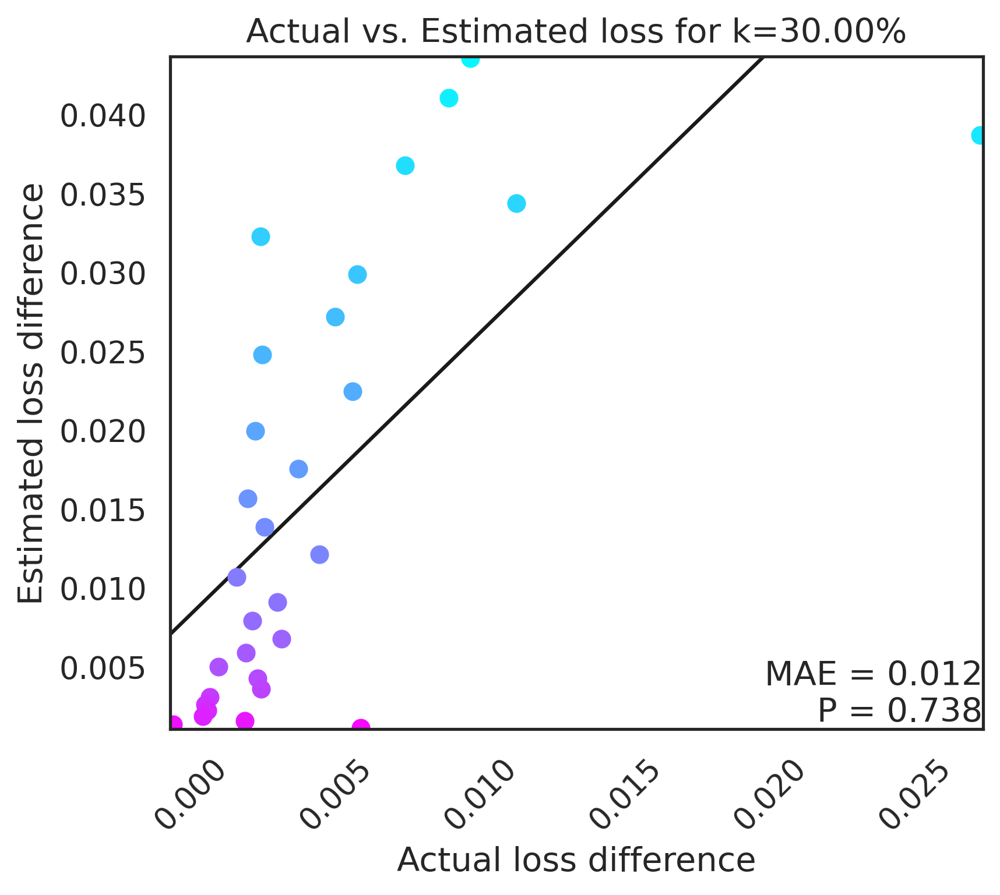


Round 4

Getting Data...
24989
Training original model...

Begining epsilon and k rounds
-----------------------------

k: 1.0
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 421.94it/s, est norm=5.86]


Approx difference: 0.00164
True difference: 0.00036
ep: 0.17337931034482756
Approx difference: 0.00164
True difference: 0.00139
ep: 0.3457586206896551
Approx difference: 0.00150
True difference: 0.00098
ep: 0.5181379310344827
Approx difference: 0.00143
True difference: 0.00126
ep: 0.6905172413793103
Approx difference: 0.00136
True difference: -0.00021
ep: 0.8628965517241378
Approx difference: 0.00128
True difference: 0.00230
ep: 1.0352758620689653
Approx difference: 0.00121
True difference: 0.00089
ep: 1.207655172413793
Approx difference: 0.00108
True difference: 0.00188
ep: 1.3800344827586204
Approx difference: 0.00096
True difference: 0.00063
ep: 1.5524137931034478
Approx difference: 0.00089
True difference: 0.00027
ep: 1.7247931034482755
Approx difference: 0.00079
True difference: 0.00156
ep: 1.8971724137931032
Approx difference: 0.00068
True difference: 0.00029
ep: 2.0695517241379306
Approx difference: 0.00058
True difference: 0.00065
ep: 2.241931034482758
Approx difference: 0.0005

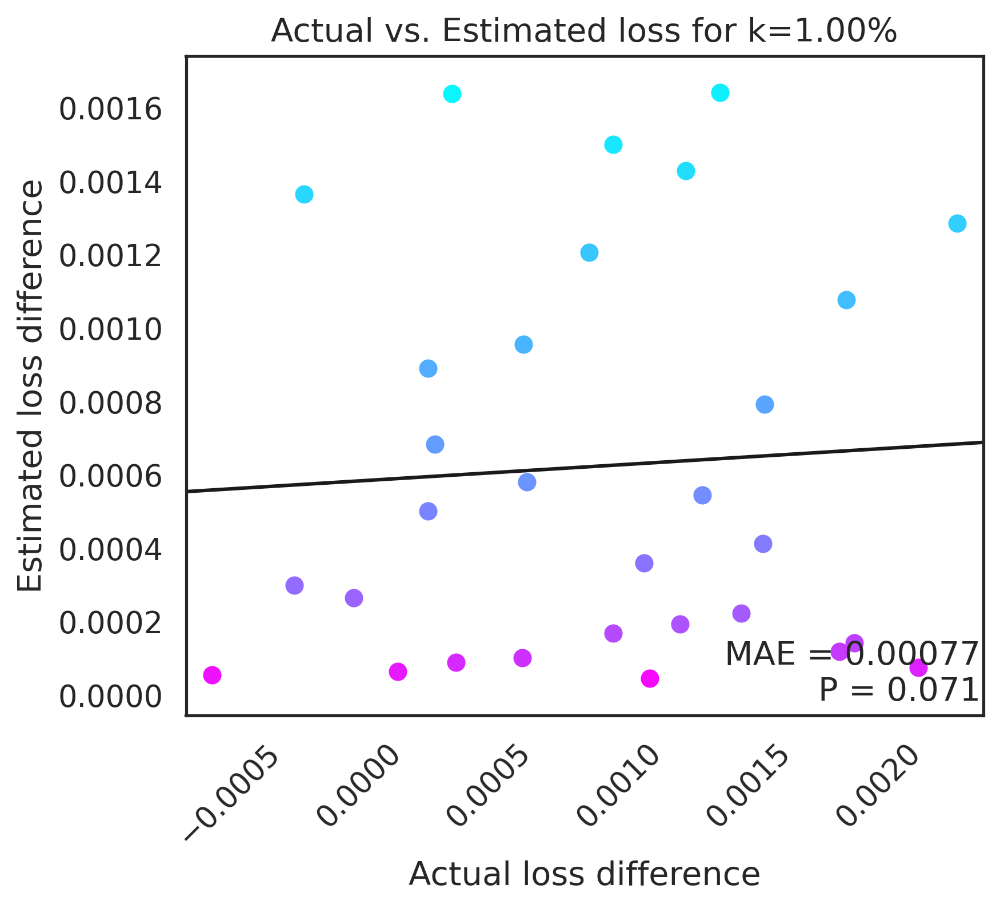


k: 4.222222222222222
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 425.59it/s, est norm=3.75]


Approx difference: -0.01024
True difference: 0.00167
ep: 0.17337931034482756
Approx difference: -0.00986
True difference: 0.00064
ep: 0.3457586206896551
Approx difference: -0.00946
True difference: 0.00171
ep: 0.5181379310344827
Approx difference: -0.00890
True difference: 0.00290
ep: 0.6905172413793103
Approx difference: -0.00828
True difference: 0.00218
ep: 0.8628965517241378
Approx difference: -0.00768
True difference: 0.00197
ep: 1.0352758620689653
Approx difference: -0.00706
True difference: 0.00220
ep: 1.207655172413793
Approx difference: -0.00648
True difference: 0.00178
ep: 1.3800344827586204
Approx difference: -0.00587
True difference: 0.00098
ep: 1.5524137931034478
Approx difference: -0.00535
True difference: 0.00218
ep: 1.7247931034482755
Approx difference: -0.00477
True difference: 0.00062
ep: 1.8971724137931032
Approx difference: -0.00426
True difference: 0.00070
ep: 2.0695517241379306
Approx difference: -0.00385
True difference: 0.00091
ep: 2.241931034482758
Approx differ

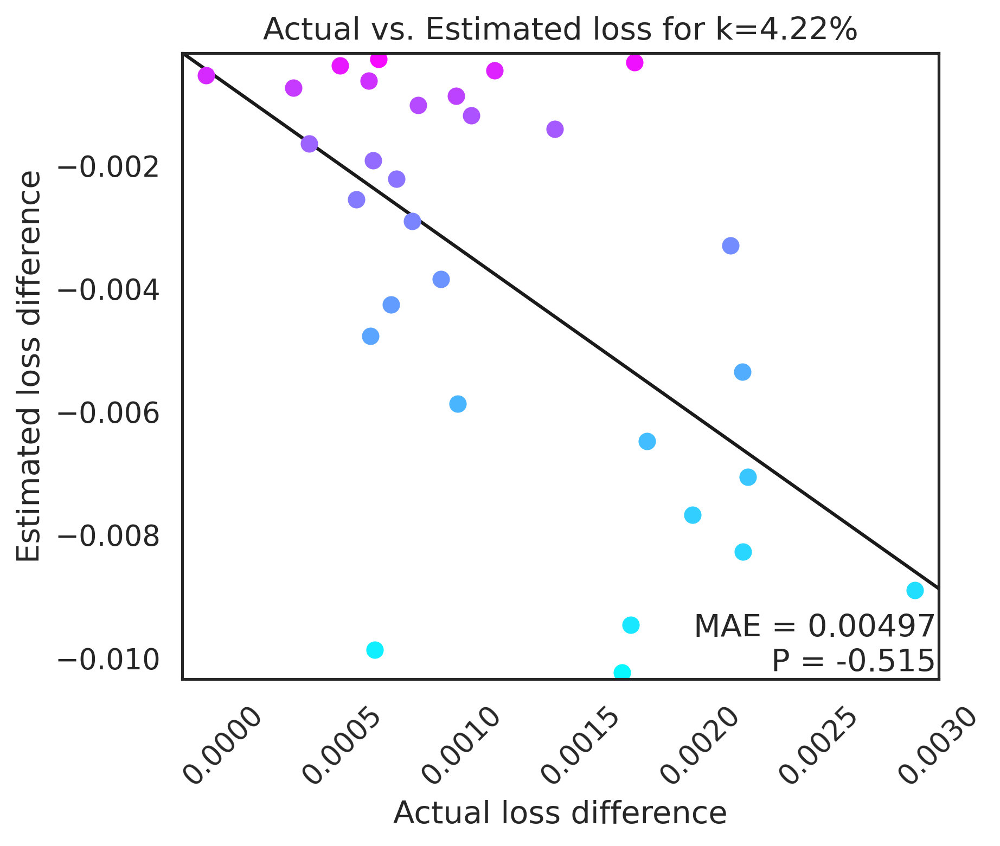


k: 7.444444444444445
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 447.87it/s, est norm=4.01]


Approx difference: 0.00205
True difference: 0.00234
ep: 0.17337931034482756
Approx difference: 0.00192
True difference: 0.00263
ep: 0.3457586206896551
Approx difference: 0.00184
True difference: 0.00461
ep: 0.5181379310344827
Approx difference: 0.00182
True difference: 0.00336
ep: 0.6905172413793103
Approx difference: 0.00160
True difference: 0.00135
ep: 0.8628965517241378
Approx difference: 0.00150
True difference: 0.00313
ep: 1.0352758620689653
Approx difference: 0.00140
True difference: 0.00268
ep: 1.207655172413793
Approx difference: 0.00131
True difference: 0.00365
ep: 1.3800344827586204
Approx difference: 0.00119
True difference: 0.00180
ep: 1.5524137931034478
Approx difference: 0.00101
True difference: 0.00197
ep: 1.7247931034482755
Approx difference: 0.00097
True difference: 0.00197
ep: 1.8971724137931032
Approx difference: 0.00082
True difference: 0.00292
ep: 2.0695517241379306
Approx difference: 0.00076
True difference: 0.00148
ep: 2.241931034482758
Approx difference: 0.00066

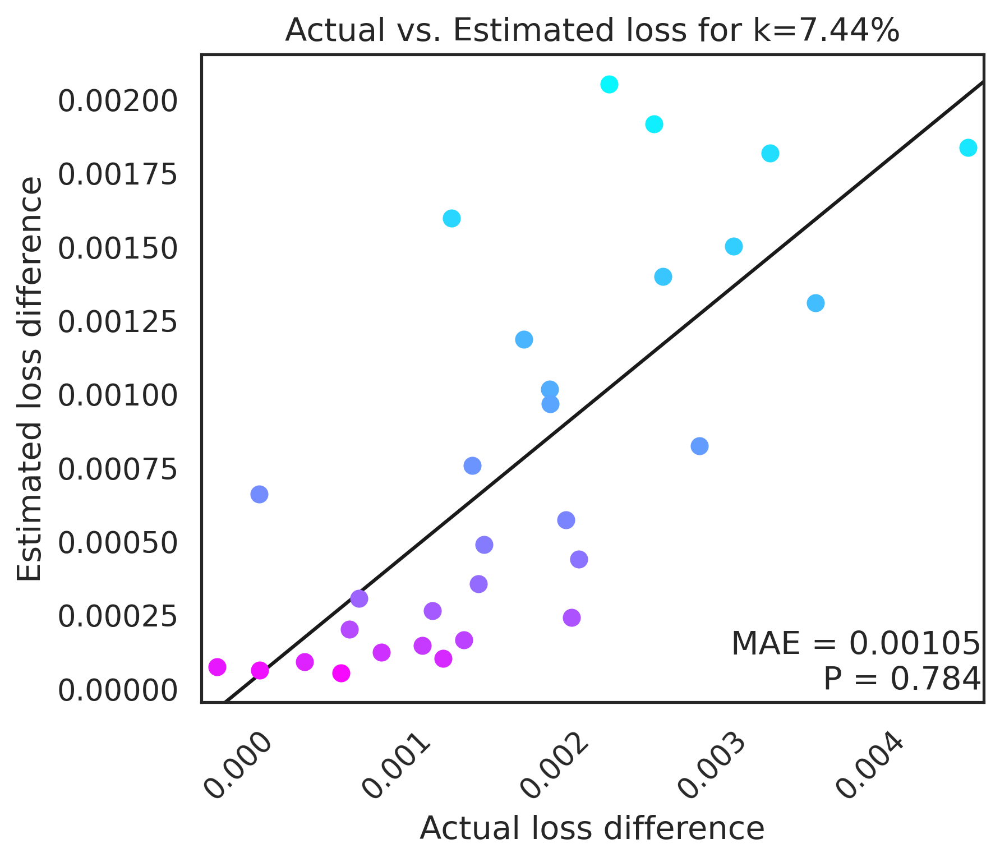


k: 10.666666666666668
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 417.14it/s, est norm=4.26]


Approx difference: 0.03118
True difference: 0.00521
ep: 0.17337931034482756
Approx difference: 0.02959
True difference: 0.00254
ep: 0.3457586206896551
Approx difference: 0.02830
True difference: 0.00333
ep: 0.5181379310344827
Approx difference: 0.02657
True difference: 0.00461
ep: 0.6905172413793103
Approx difference: 0.02494
True difference: 0.00302
ep: 0.8628965517241378
Approx difference: 0.02328
True difference: 0.00240
ep: 1.0352758620689653
Approx difference: 0.02138
True difference: 0.00356
ep: 1.207655172413793
Approx difference: 0.01981
True difference: 0.00478
ep: 1.3800344827586204
Approx difference: 0.01781
True difference: 0.00541
ep: 1.5524137931034478
Approx difference: 0.01609
True difference: 0.00552
ep: 1.7247931034482755
Approx difference: 0.01444
True difference: 0.00290
ep: 1.8971724137931032
Approx difference: 0.01286
True difference: 0.00152
ep: 2.0695517241379306
Approx difference: 0.01134
True difference: 0.00185
ep: 2.241931034482758
Approx difference: 0.01000

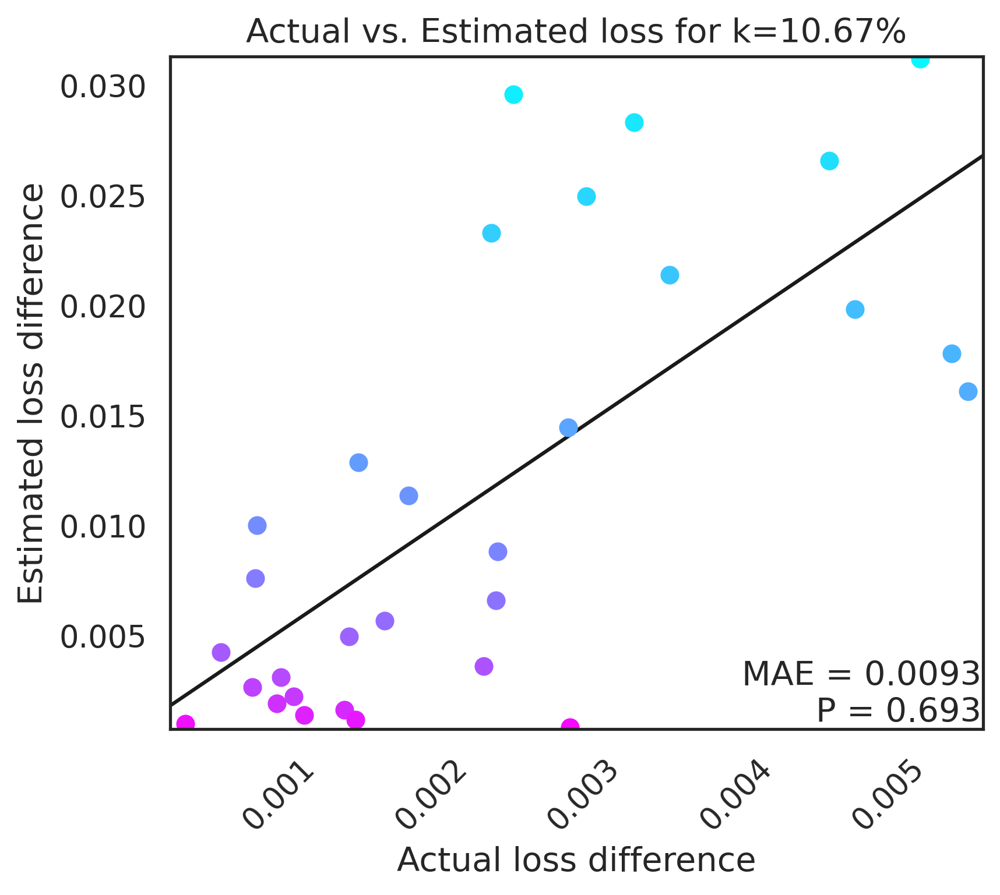


k: 13.88888888888889
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 452.14it/s, est norm=5.89]


Approx difference: 0.04476
True difference: 0.00599
ep: 0.17337931034482756
Approx difference: 0.04250
True difference: 0.00286
ep: 0.3457586206896551
Approx difference: 0.04016
True difference: 0.00476
ep: 0.5181379310344827
Approx difference: 0.03819
True difference: 0.00881
ep: 0.6905172413793103
Approx difference: 0.03550
True difference: 0.00359
ep: 0.8628965517241378
Approx difference: 0.03323
True difference: 0.00487
ep: 1.0352758620689653
Approx difference: 0.03067
True difference: 0.00402
ep: 1.207655172413793
Approx difference: 0.02803
True difference: 0.00486
ep: 1.3800344827586204
Approx difference: 0.02568
True difference: 0.00473
ep: 1.5524137931034478
Approx difference: 0.02330
True difference: 0.00287
ep: 1.7247931034482755
Approx difference: 0.02075
True difference: 0.00095
ep: 1.8971724137931032
Approx difference: 0.01846
True difference: 0.00254
ep: 2.0695517241379306
Approx difference: 0.01638
True difference: 0.00268
ep: 2.241931034482758
Approx difference: 0.01443

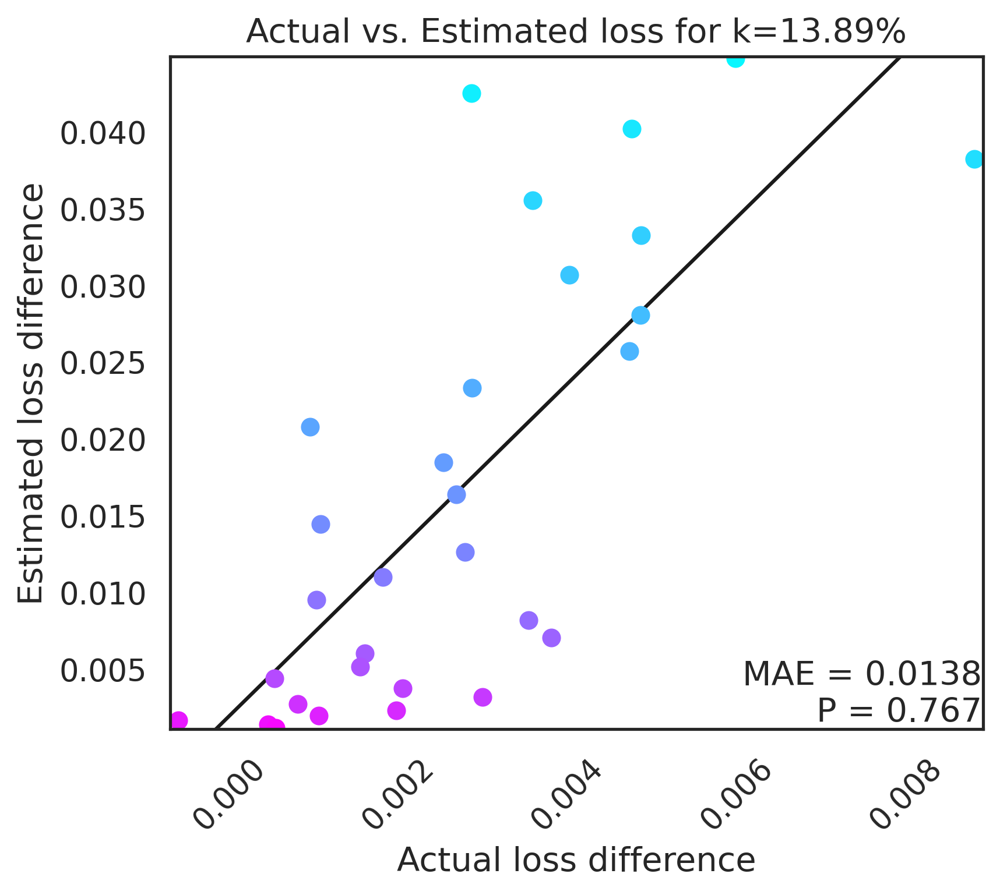


k: 17.11111111111111
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 436.82it/s, est norm=5.37]


Approx difference: 0.04290
True difference: 0.00826
ep: 0.17337931034482756
Approx difference: 0.04124
True difference: 0.00418
ep: 0.3457586206896551
Approx difference: 0.03910
True difference: 0.00530
ep: 0.5181379310344827
Approx difference: 0.03694
True difference: 0.00361
ep: 0.6905172413793103
Approx difference: 0.03470
True difference: 0.00629
ep: 0.8628965517241378
Approx difference: 0.03204
True difference: 0.00724
ep: 1.0352758620689653
Approx difference: 0.02968
True difference: 0.00305
ep: 1.207655172413793
Approx difference: 0.02718
True difference: 0.00383
ep: 1.3800344827586204
Approx difference: 0.02472
True difference: 0.00513
ep: 1.5524137931034478
Approx difference: 0.02229
True difference: 0.00290
ep: 1.7247931034482755
Approx difference: 0.02002
True difference: 0.00541
ep: 1.8971724137931032
Approx difference: 0.01790
True difference: 0.00322
ep: 2.0695517241379306
Approx difference: 0.01584
True difference: 0.00184
ep: 2.241931034482758
Approx difference: 0.01388

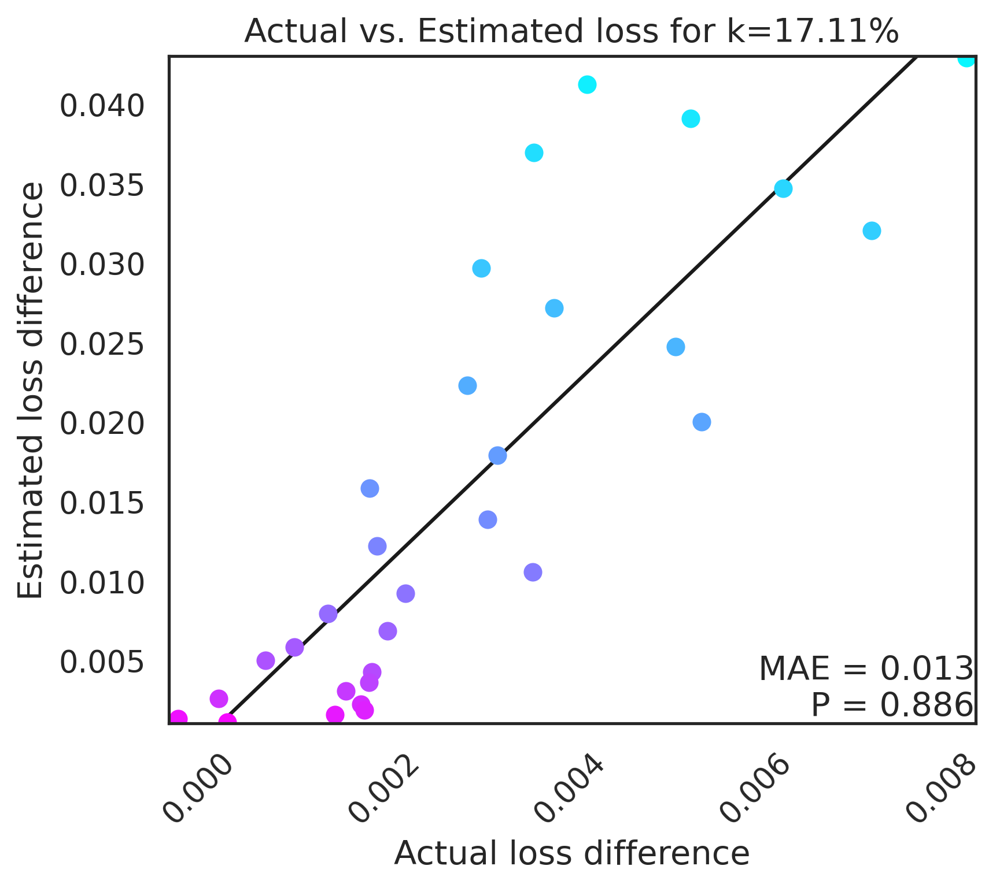


k: 20.333333333333336
ep: 0.001


IHVP sample 2: 100%|█████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 432.52it/s, est norm=3.9]


Approx difference: 0.04459
True difference: 0.00990
ep: 0.17337931034482756
Approx difference: 0.04258
True difference: 0.00973
ep: 0.3457586206896551
Approx difference: 0.04041
True difference: 0.00772
ep: 0.5181379310344827
Approx difference: 0.03818
True difference: 0.00672
ep: 0.6905172413793103
Approx difference: 0.03584
True difference: 0.00524
ep: 0.8628965517241378
Approx difference: 0.03320
True difference: 0.00983
ep: 1.0352758620689653
Approx difference: 0.03066
True difference: 0.00610
ep: 1.207655172413793
Approx difference: 0.02815
True difference: 0.00913
ep: 1.3800344827586204
Approx difference: 0.02557
True difference: 0.00446
ep: 1.5524137931034478
Approx difference: 0.02315
True difference: 0.00453
ep: 1.7247931034482755
Approx difference: 0.02072
True difference: 0.00420
ep: 1.8971724137931032
Approx difference: 0.01852
True difference: 0.00387
ep: 2.0695517241379306
Approx difference: 0.01638
True difference: 0.00217
ep: 2.241931034482758
Approx difference: 0.01443

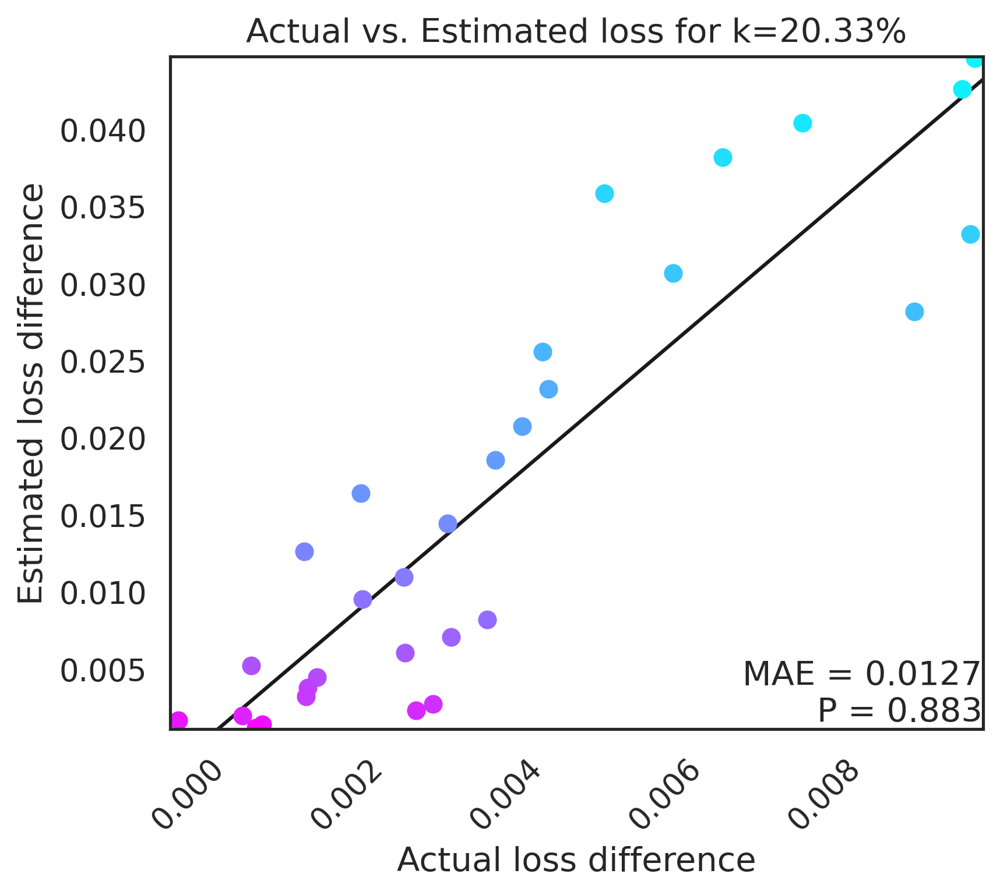


k: 23.555555555555557
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 408.34it/s, est norm=4.57]


Approx difference: 0.07269
True difference: 0.01300
ep: 0.17337931034482756
Approx difference: 0.06943
True difference: 0.01448
ep: 0.3457586206896551
Approx difference: 0.06617
True difference: 0.00607
ep: 0.5181379310344827
Approx difference: 0.06209
True difference: 0.00417
ep: 0.6905172413793103
Approx difference: 0.05832
True difference: 0.00857
ep: 0.8628965517241378
Approx difference: 0.05426
True difference: 0.00979
ep: 1.0352758620689653
Approx difference: 0.05004
True difference: 0.00606
ep: 1.207655172413793
Approx difference: 0.04596
True difference: 0.00646
ep: 1.3800344827586204
Approx difference: 0.04174
True difference: 0.00600
ep: 1.5524137931034478
Approx difference: 0.03770
True difference: 0.00434
ep: 1.7247931034482755
Approx difference: 0.03379
True difference: 0.00550
ep: 1.8971724137931032
Approx difference: 0.03015
True difference: 0.00440
ep: 2.0695517241379306
Approx difference: 0.02667
True difference: 0.00459
ep: 2.241931034482758
Approx difference: 0.02344

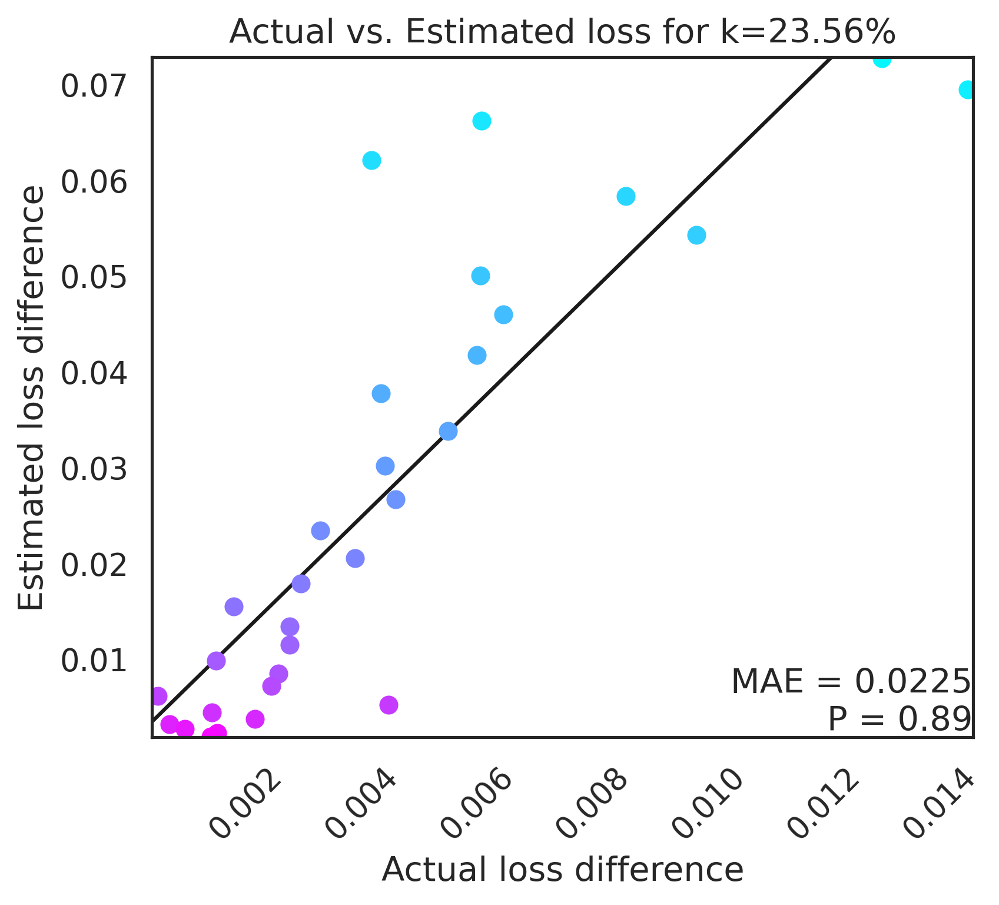


k: 26.77777777777778
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 410.56it/s, est norm=3.29]


Approx difference: 0.00549
True difference: 0.01497
ep: 0.17337931034482756
Approx difference: 0.00523
True difference: 0.01011
ep: 0.3457586206896551
Approx difference: 0.00497
True difference: 0.01264
ep: 0.5181379310344827
Approx difference: 0.00468
True difference: 0.01000
ep: 0.6905172413793103
Approx difference: 0.00437
True difference: 0.01152
ep: 0.8628965517241378
Approx difference: 0.00406
True difference: 0.00994
ep: 1.0352758620689653
Approx difference: 0.00375
True difference: 0.00314
ep: 1.207655172413793
Approx difference: 0.00345
True difference: 0.00477
ep: 1.3800344827586204
Approx difference: 0.00313
True difference: 0.01212
ep: 1.5524137931034478
Approx difference: 0.00283
True difference: 0.00411
ep: 1.7247931034482755
Approx difference: 0.00255
True difference: 0.00416
ep: 1.8971724137931032
Approx difference: 0.00227
True difference: 0.00520
ep: 2.0695517241379306
Approx difference: 0.00201
True difference: 0.00417
ep: 2.241931034482758
Approx difference: 0.00177

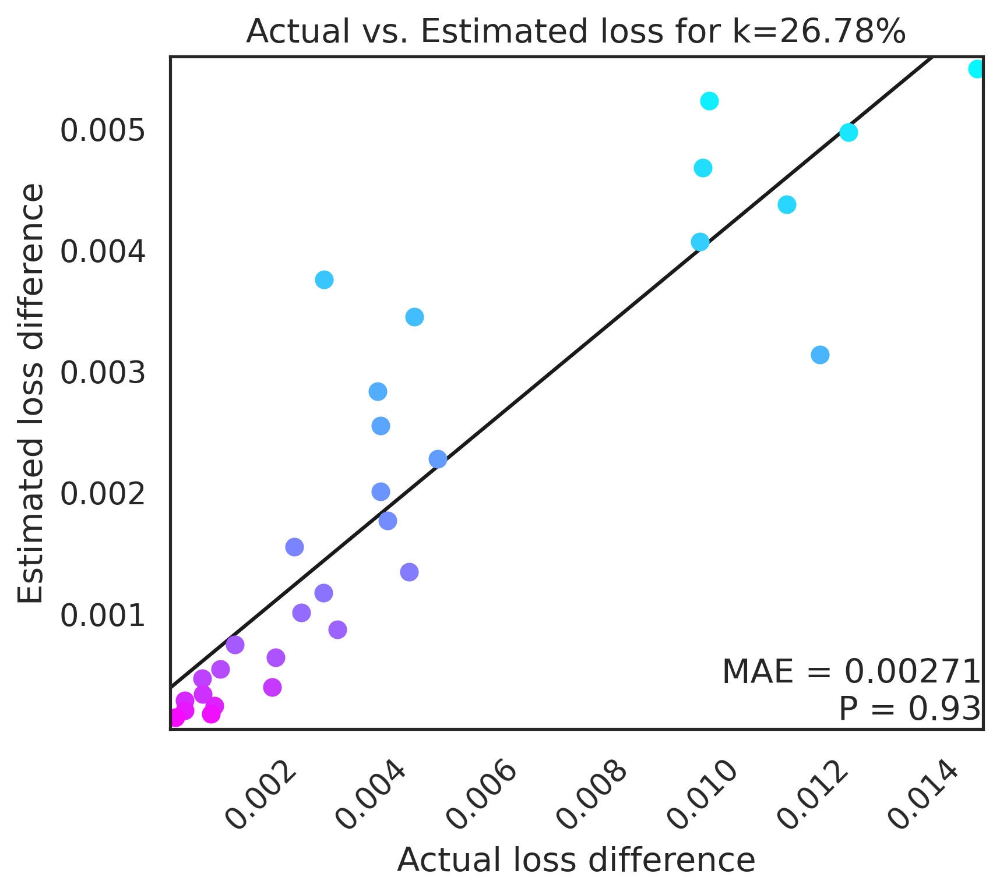


k: 30.0
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 410.18it/s, est norm=8.34]


Approx difference: 0.13719
True difference: 0.00655
ep: 0.17337931034482756
Approx difference: 0.13173
True difference: 0.00994
ep: 0.3457586206896551
Approx difference: 0.12478
True difference: 0.01031
ep: 0.5181379310344827
Approx difference: 0.11831
True difference: 0.01009
ep: 0.6905172413793103
Approx difference: 0.11054
True difference: 0.00715
ep: 0.8628965517241378
Approx difference: 0.10221
True difference: 0.00404
ep: 1.0352758620689653
Approx difference: 0.09509
True difference: 0.00234
ep: 1.207655172413793
Approx difference: 0.08678
True difference: 0.00572
ep: 1.3800344827586204
Approx difference: 0.07921
True difference: 0.00372
ep: 1.5524137931034478
Approx difference: 0.07106
True difference: 0.00446
ep: 1.7247931034482755
Approx difference: 0.06426
True difference: 0.00332
ep: 1.8971724137931032
Approx difference: 0.05721
True difference: 0.00396
ep: 2.0695517241379306
Approx difference: 0.05071
True difference: 0.00366
ep: 2.241931034482758
Approx difference: 0.04436

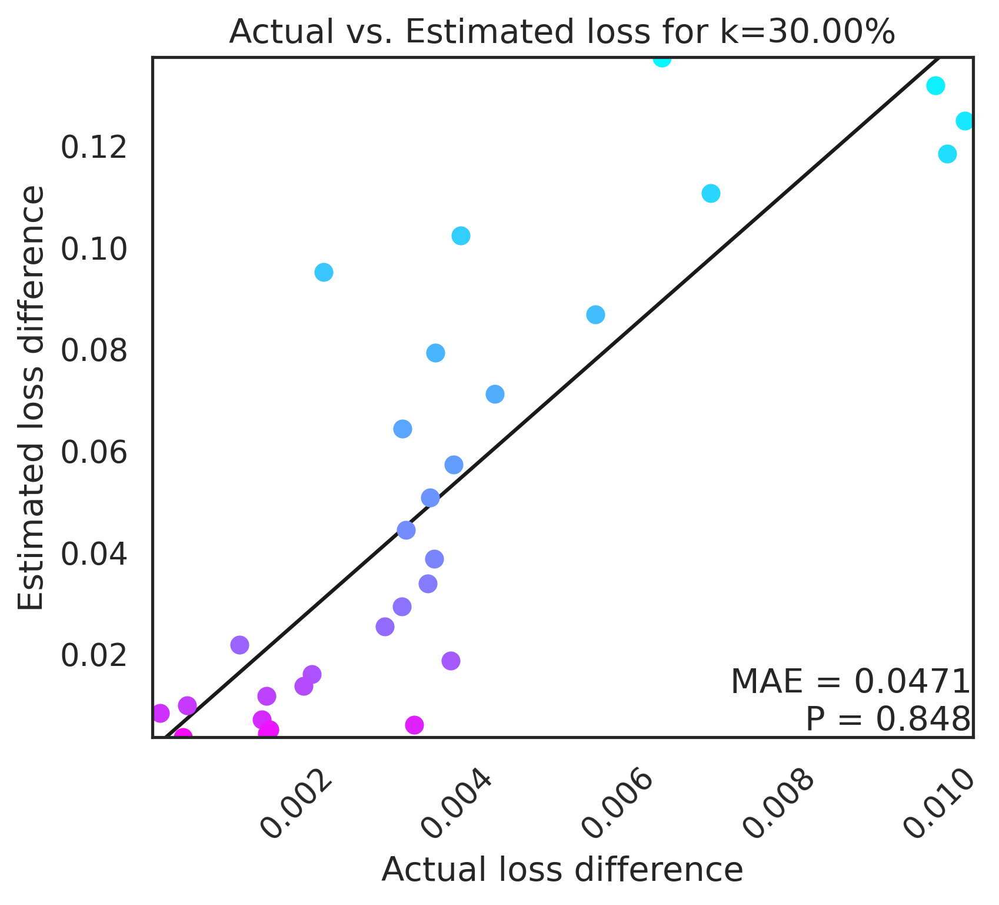


Round 5

Getting Data...
24989
Training original model...

Begining epsilon and k rounds
-----------------------------

k: 1.0
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 416.54it/s, est norm=3.62]


Approx difference: -0.00067
True difference: 0.00033
ep: 0.17337931034482756
Approx difference: -0.00060
True difference: 0.00144
ep: 0.3457586206896551
Approx difference: -0.00059
True difference: 0.00133
ep: 0.5181379310344827
Approx difference: -0.00055
True difference: 0.00122
ep: 0.6905172413793103
Approx difference: -0.00053
True difference: 0.00152
ep: 0.8628965517241378
Approx difference: -0.00047
True difference: 0.00156
ep: 1.0352758620689653
Approx difference: -0.00043
True difference: -0.00004
ep: 1.207655172413793
Approx difference: -0.00040
True difference: 0.00022
ep: 1.3800344827586204
Approx difference: -0.00038
True difference: -0.00024
ep: 1.5524137931034478
Approx difference: -0.00032
True difference: 0.00033
ep: 1.7247931034482755
Approx difference: -0.00029
True difference: 0.00087
ep: 1.8971724137931032
Approx difference: -0.00026
True difference: 0.00122
ep: 2.0695517241379306
Approx difference: -0.00023
True difference: 0.00299
ep: 2.241931034482758
Approx diff

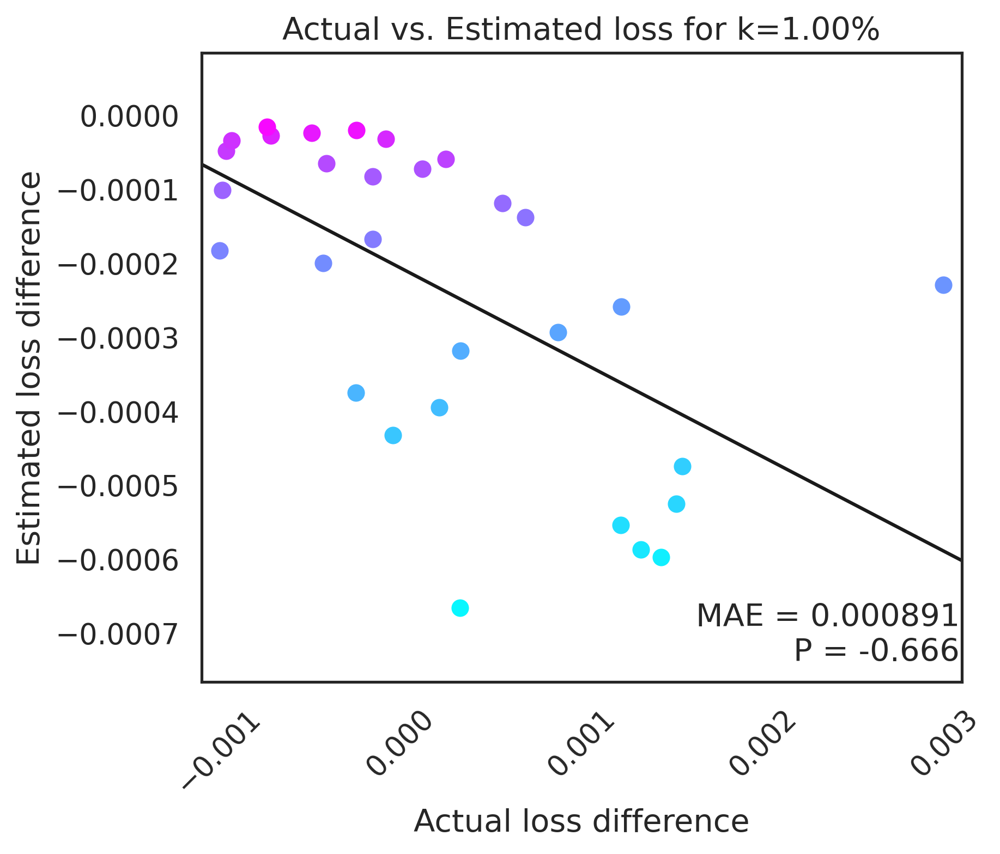


k: 4.222222222222222
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:17<00:00, 437.73it/s, est norm=6.27]


Approx difference: -0.00360
True difference: 0.00238
ep: 0.17337931034482756
Approx difference: -0.00348
True difference: 0.00074
ep: 0.3457586206896551
Approx difference: -0.00332
True difference: 0.00033
ep: 0.5181379310344827
Approx difference: -0.00314
True difference: 0.00195
ep: 0.6905172413793103
Approx difference: -0.00291
True difference: -0.00016
ep: 0.8628965517241378
Approx difference: -0.00272
True difference: 0.00047
ep: 1.0352758620689653
Approx difference: -0.00254
True difference: 0.00256
ep: 1.207655172413793
Approx difference: -0.00221
True difference: 0.00101
ep: 1.3800344827586204
Approx difference: -0.00212
True difference: 0.00082
ep: 1.5524137931034478
Approx difference: -0.00186
True difference: -0.00032
ep: 1.7247931034482755
Approx difference: -0.00171
True difference: -0.00024
ep: 1.8971724137931032
Approx difference: -0.00150
True difference: 0.00095
ep: 2.0695517241379306
Approx difference: -0.00133
True difference: -0.00041
ep: 2.241931034482758
Approx di

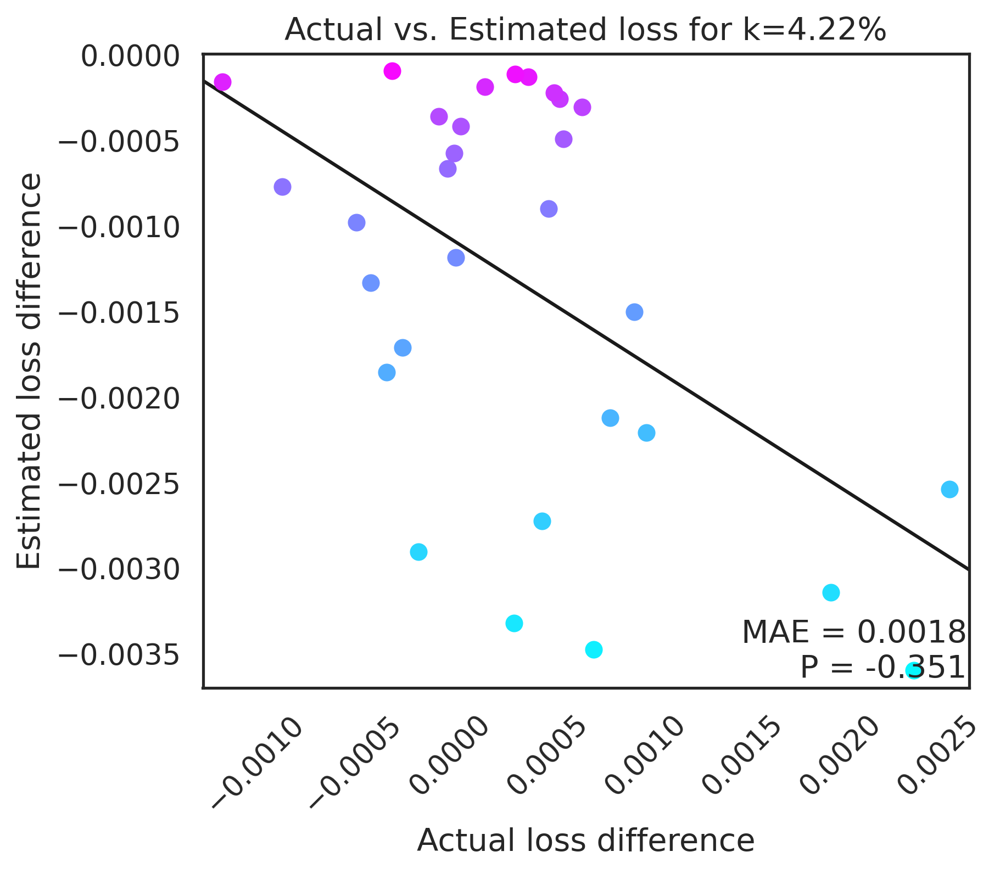


k: 7.444444444444445
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:15<00:00, 481.95it/s, est norm=5.43]


Approx difference: -0.01033
True difference: 0.00159
ep: 0.17337931034482756
Approx difference: -0.00996
True difference: 0.00301
ep: 0.3457586206896551
Approx difference: -0.00938
True difference: 0.00374
ep: 0.5181379310344827
Approx difference: -0.00888
True difference: 0.00187
ep: 0.6905172413793103
Approx difference: -0.00820
True difference: 0.00320
ep: 0.8628965517241378
Approx difference: -0.00776
True difference: 0.00531
ep: 1.0352758620689653
Approx difference: -0.00716
True difference: 0.00114
ep: 1.207655172413793
Approx difference: -0.00655
True difference: 0.00100
ep: 1.3800344827586204
Approx difference: -0.00588
True difference: 0.00154
ep: 1.5524137931034478
Approx difference: -0.00541
True difference: 0.00157
ep: 1.7247931034482755
Approx difference: -0.00481
True difference: 0.00266
ep: 1.8971724137931032
Approx difference: -0.00432
True difference: 0.00414
ep: 2.0695517241379306
Approx difference: -0.00381
True difference: 0.00272
ep: 2.241931034482758
Approx differ

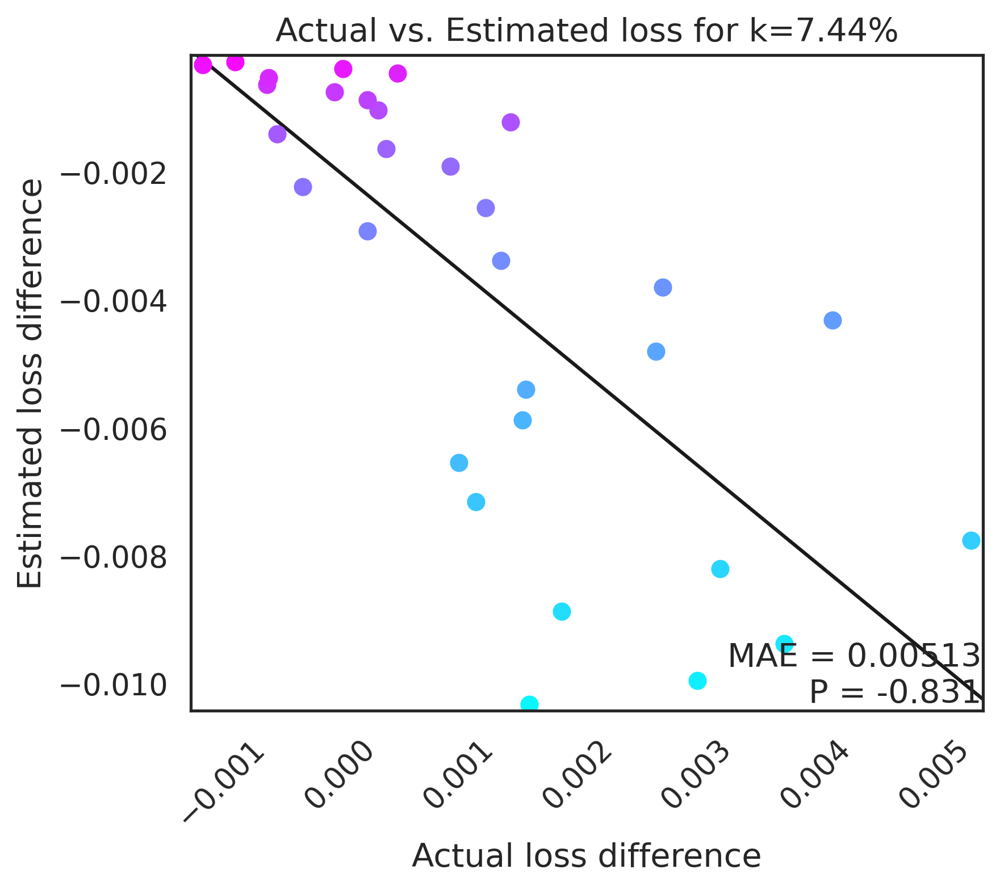


k: 10.666666666666668
ep: 0.001


IHVP sample 2: 100%|█████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 413.37it/s, est norm=4.7]


Approx difference: -0.00178
True difference: 0.00357
ep: 0.17337931034482756
Approx difference: -0.00168
True difference: 0.00691
ep: 0.3457586206896551
Approx difference: -0.00156
True difference: 0.00309
ep: 0.5181379310344827
Approx difference: -0.00139
True difference: 0.00182
ep: 0.6905172413793103
Approx difference: -0.00142
True difference: 0.00345
ep: 0.8628965517241378
Approx difference: -0.00128
True difference: 0.00186
ep: 1.0352758620689653
Approx difference: -0.00118
True difference: 0.00529
ep: 1.207655172413793
Approx difference: -0.00108
True difference: 0.00457
ep: 1.3800344827586204
Approx difference: -0.00101
True difference: 0.00281
ep: 1.5524137931034478
Approx difference: -0.00088
True difference: 0.00063
ep: 1.7247931034482755
Approx difference: -0.00080
True difference: 0.00222
ep: 1.8971724137931032
Approx difference: -0.00070
True difference: 0.00325
ep: 2.0695517241379306
Approx difference: -0.00064
True difference: 0.00257
ep: 2.241931034482758
Approx differ

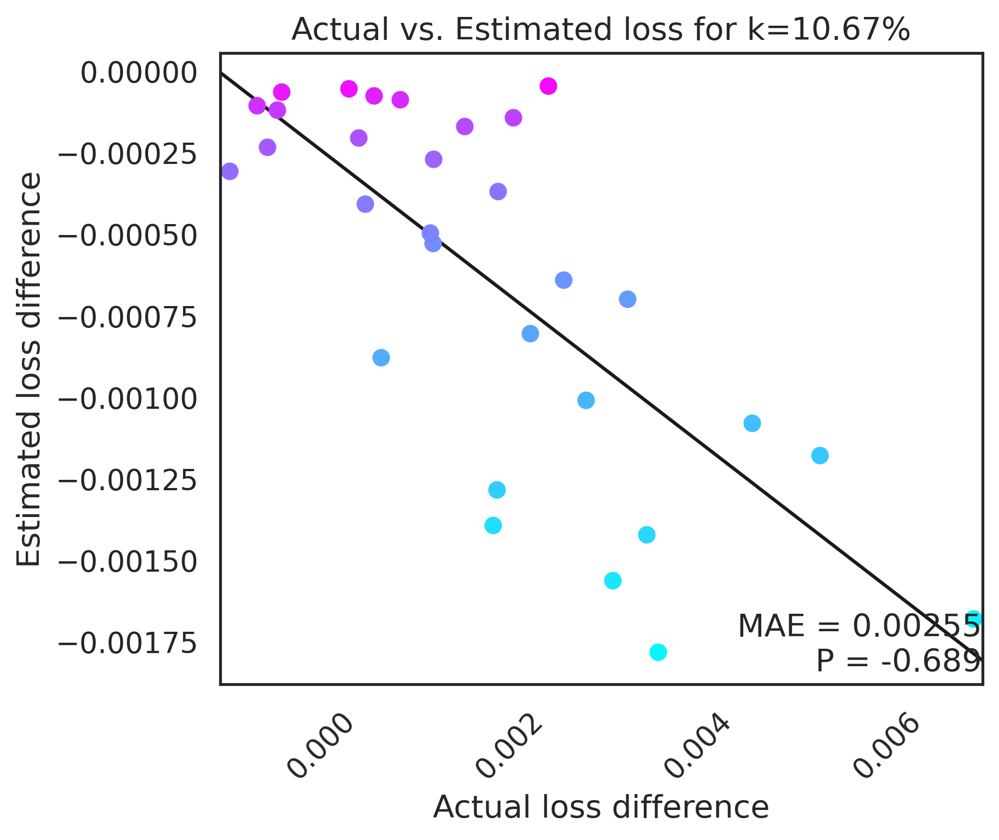


k: 13.88888888888889
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 412.64it/s, est norm=4.87]


Approx difference: 0.01524
True difference: 0.00778
ep: 0.17337931034482756
Approx difference: 0.01450
True difference: 0.00395
ep: 0.3457586206896551
Approx difference: 0.01389
True difference: 0.00328
ep: 0.5181379310344827
Approx difference: 0.01308
True difference: 0.00275
ep: 0.6905172413793103
Approx difference: 0.01214
True difference: 0.00271
ep: 0.8628965517241378
Approx difference: 0.01125
True difference: 0.00137
ep: 1.0352758620689653
Approx difference: 0.01042
True difference: 0.00175
ep: 1.207655172413793
Approx difference: 0.00959
True difference: 0.00357
ep: 1.3800344827586204
Approx difference: 0.00869
True difference: 0.00167
ep: 1.5524137931034478
Approx difference: 0.00793
True difference: 0.00124
ep: 1.7247931034482755
Approx difference: 0.00713
True difference: 0.00198
ep: 1.8971724137931032
Approx difference: 0.00631
True difference: 0.00178
ep: 2.0695517241379306
Approx difference: 0.00550
True difference: 0.00198
ep: 2.241931034482758
Approx difference: 0.00488

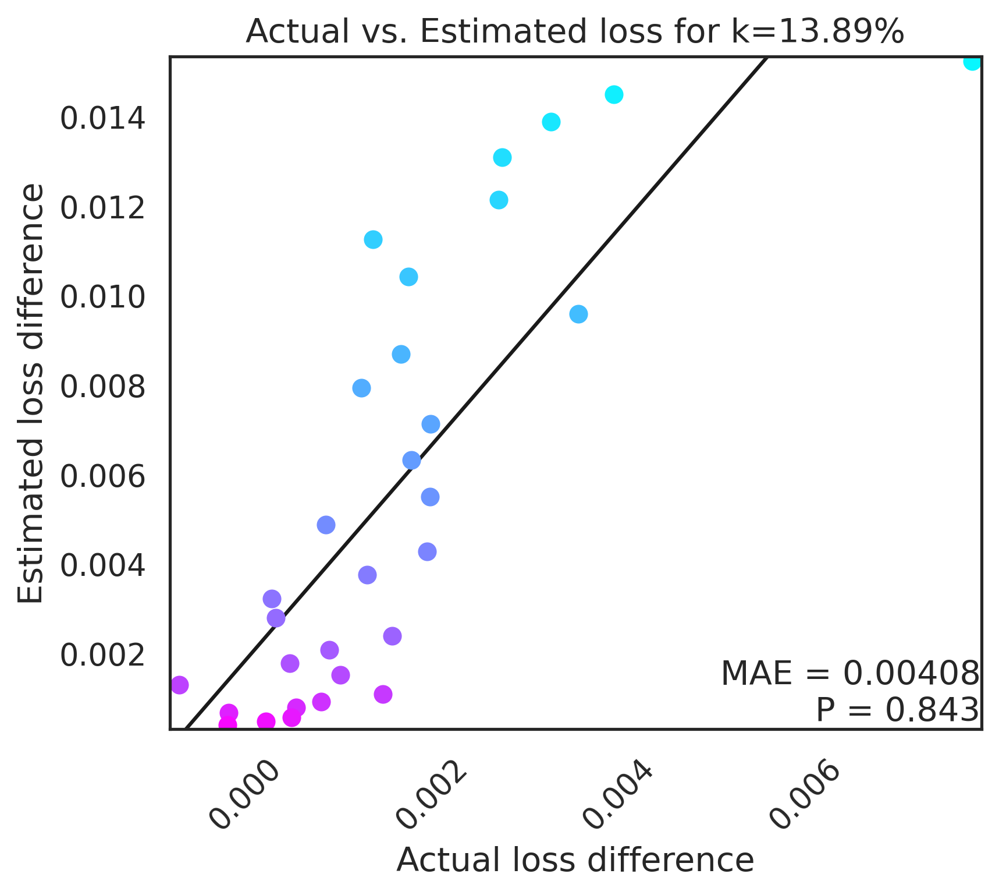


k: 17.11111111111111
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 395.60it/s, est norm=3.82]


Approx difference: 0.04563
True difference: 0.00305
ep: 0.17337931034482756
Approx difference: 0.04375
True difference: 0.00601
ep: 0.3457586206896551
Approx difference: 0.04157
True difference: 0.00687
ep: 0.5181379310344827
Approx difference: 0.03919
True difference: 0.00442
ep: 0.6905172413793103
Approx difference: 0.03671
True difference: 0.00313
ep: 0.8628965517241378
Approx difference: 0.03412
True difference: 0.00513
ep: 1.0352758620689653
Approx difference: 0.03165
True difference: 0.00299
ep: 1.207655172413793
Approx difference: 0.02885
True difference: 0.00093
ep: 1.3800344827586204
Approx difference: 0.02625
True difference: 0.00398
ep: 1.5524137931034478
Approx difference: 0.02369
True difference: 0.00766
ep: 1.7247931034482755
Approx difference: 0.02130
True difference: 0.00198
ep: 1.8971724137931032
Approx difference: 0.01897
True difference: 0.00158
ep: 2.0695517241379306
Approx difference: 0.01679
True difference: 0.00214
ep: 2.241931034482758
Approx difference: 0.01475

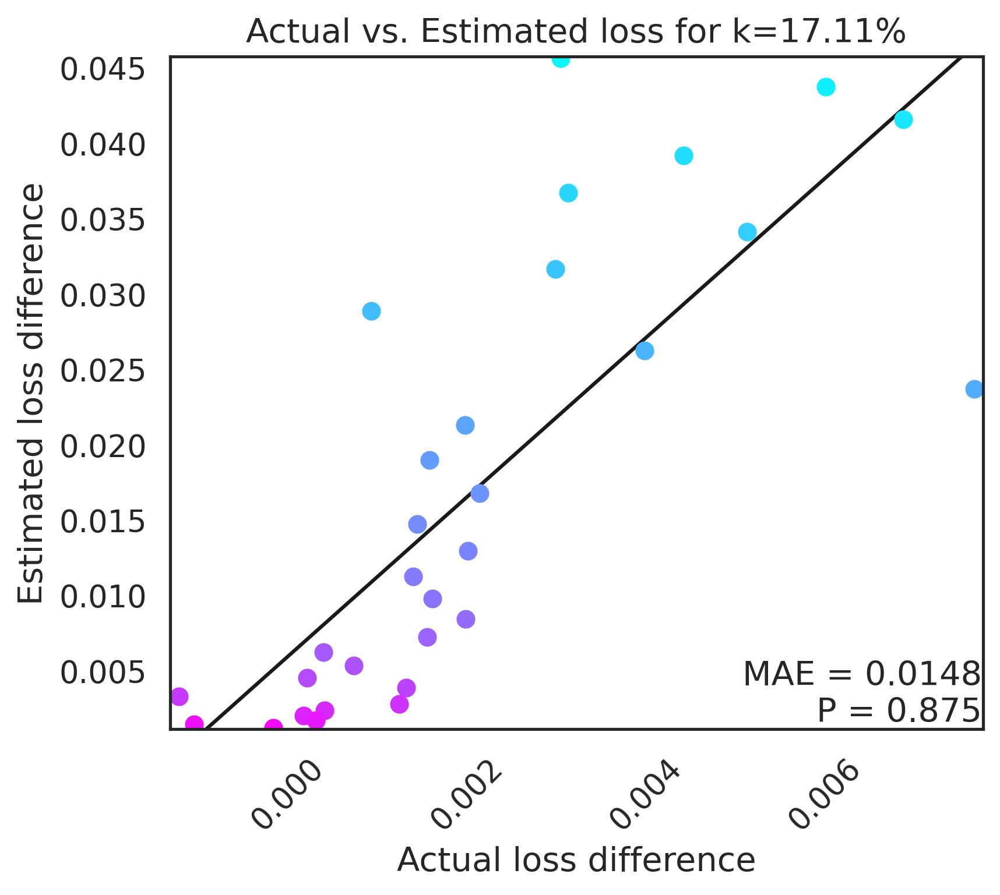


k: 20.333333333333336
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 401.34it/s, est norm=4.59]


Approx difference: 0.03341
True difference: 0.00939
ep: 0.17337931034482756
Approx difference: 0.03185
True difference: 0.00402
ep: 0.3457586206896551
Approx difference: 0.03021
True difference: 0.00938
ep: 0.5181379310344827
Approx difference: 0.02854
True difference: 0.00382
ep: 0.6905172413793103
Approx difference: 0.02678
True difference: 0.00397
ep: 0.8628965517241378
Approx difference: 0.02487
True difference: 0.00749
ep: 1.0352758620689653
Approx difference: 0.02292
True difference: 0.00611
ep: 1.207655172413793
Approx difference: 0.02105
True difference: 0.00388
ep: 1.3800344827586204
Approx difference: 0.01909
True difference: 0.00419
ep: 1.5524137931034478
Approx difference: 0.01728
True difference: 0.00433
ep: 1.7247931034482755
Approx difference: 0.01549
True difference: 0.00147
ep: 1.8971724137931032
Approx difference: 0.01386
True difference: 0.00244
ep: 2.0695517241379306
Approx difference: 0.01223
True difference: 0.00248
ep: 2.241931034482758
Approx difference: 0.01076

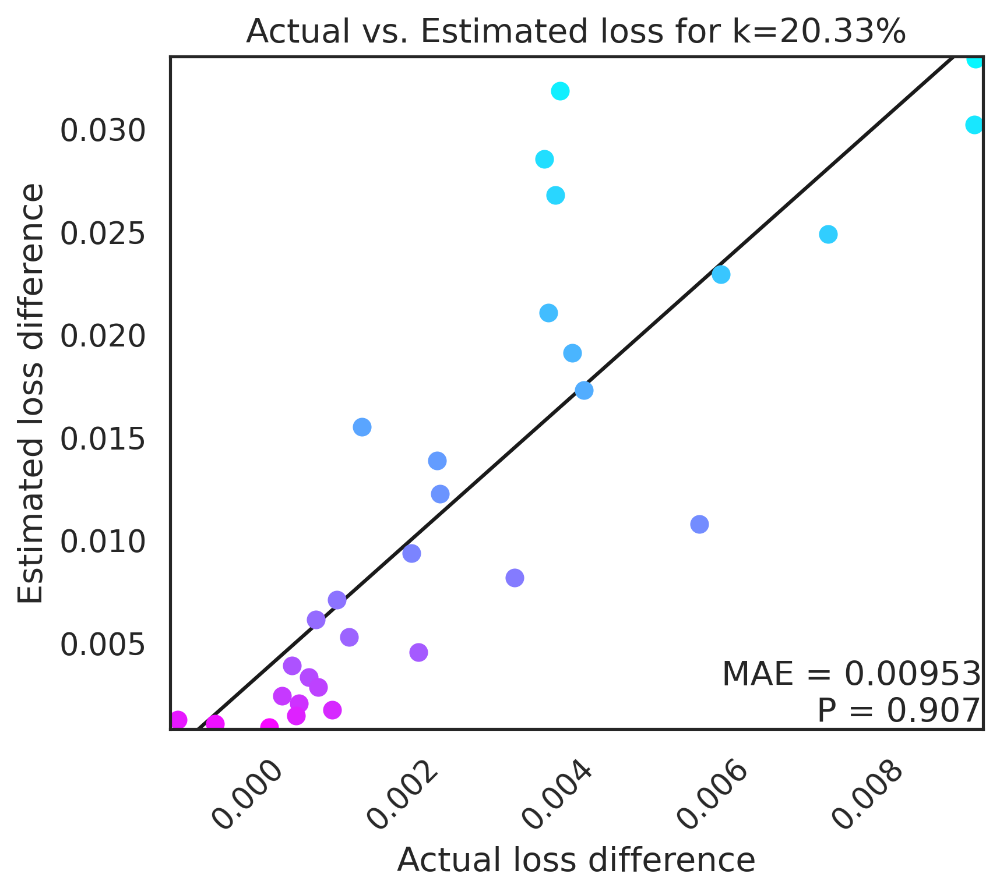


k: 23.555555555555557
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 406.06it/s, est norm=5.06]


Approx difference: 0.08212
True difference: 0.00884
ep: 0.17337931034482756
Approx difference: 0.07851
True difference: 0.01054
ep: 0.3457586206896551
Approx difference: 0.07468
True difference: 0.00894
ep: 0.5181379310344827
Approx difference: 0.07012
True difference: 0.00468
ep: 0.6905172413793103
Approx difference: 0.06578
True difference: 0.00548
ep: 0.8628965517241378
Approx difference: 0.06126
True difference: 0.01188
ep: 1.0352758620689653
Approx difference: 0.05658
True difference: 0.00558
ep: 1.207655172413793
Approx difference: 0.05183
True difference: 0.00769
ep: 1.3800344827586204
Approx difference: 0.04717
True difference: 0.00622
ep: 1.5524137931034478
Approx difference: 0.04268
True difference: 0.00297
ep: 1.7247931034482755
Approx difference: 0.03818
True difference: 0.00304
ep: 1.8971724137931032
Approx difference: 0.03395
True difference: 0.00311
ep: 2.0695517241379306
Approx difference: 0.03004
True difference: 0.00533
ep: 2.241931034482758
Approx difference: 0.02647

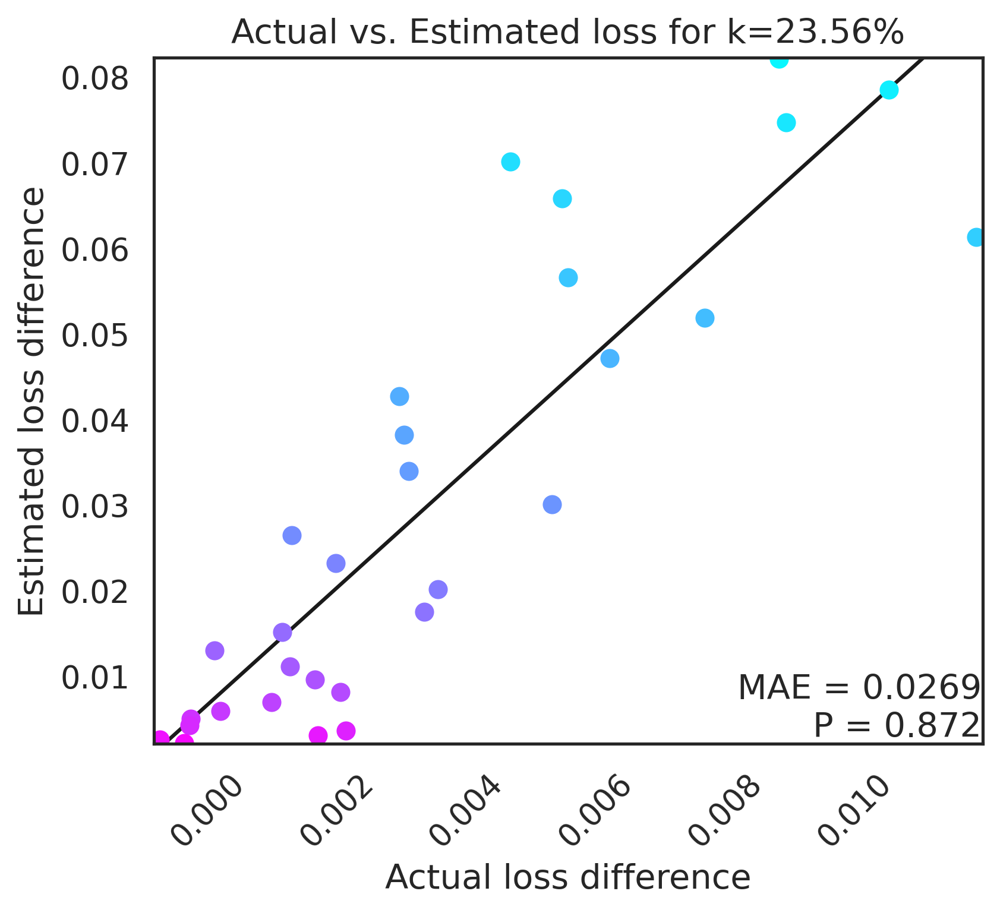


k: 26.77777777777778
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:18<00:00, 395.20it/s, est norm=5.74]


Approx difference: 0.05554
True difference: 0.02061
ep: 0.17337931034482756
Approx difference: 0.05307
True difference: 0.01631
ep: 0.3457586206896551
Approx difference: 0.05037
True difference: 0.01306
ep: 0.5181379310344827
Approx difference: 0.04749
True difference: 0.01641
ep: 0.6905172413793103
Approx difference: 0.04452
True difference: 0.01087
ep: 0.8628965517241378
Approx difference: 0.04140
True difference: 0.00492
ep: 1.0352758620689653
Approx difference: 0.03823
True difference: 0.00775
ep: 1.207655172413793
Approx difference: 0.03504
True difference: 0.00944
ep: 1.3800344827586204
Approx difference: 0.03186
True difference: 0.00184
ep: 1.5524137931034478
Approx difference: 0.02877
True difference: 0.00660
ep: 1.7247931034482755
Approx difference: 0.02582
True difference: 0.00294
ep: 1.8971724137931032
Approx difference: 0.02301
True difference: 0.00284
ep: 2.0695517241379306
Approx difference: 0.02035
True difference: 0.00791
ep: 2.241931034482758
Approx difference: 0.01791

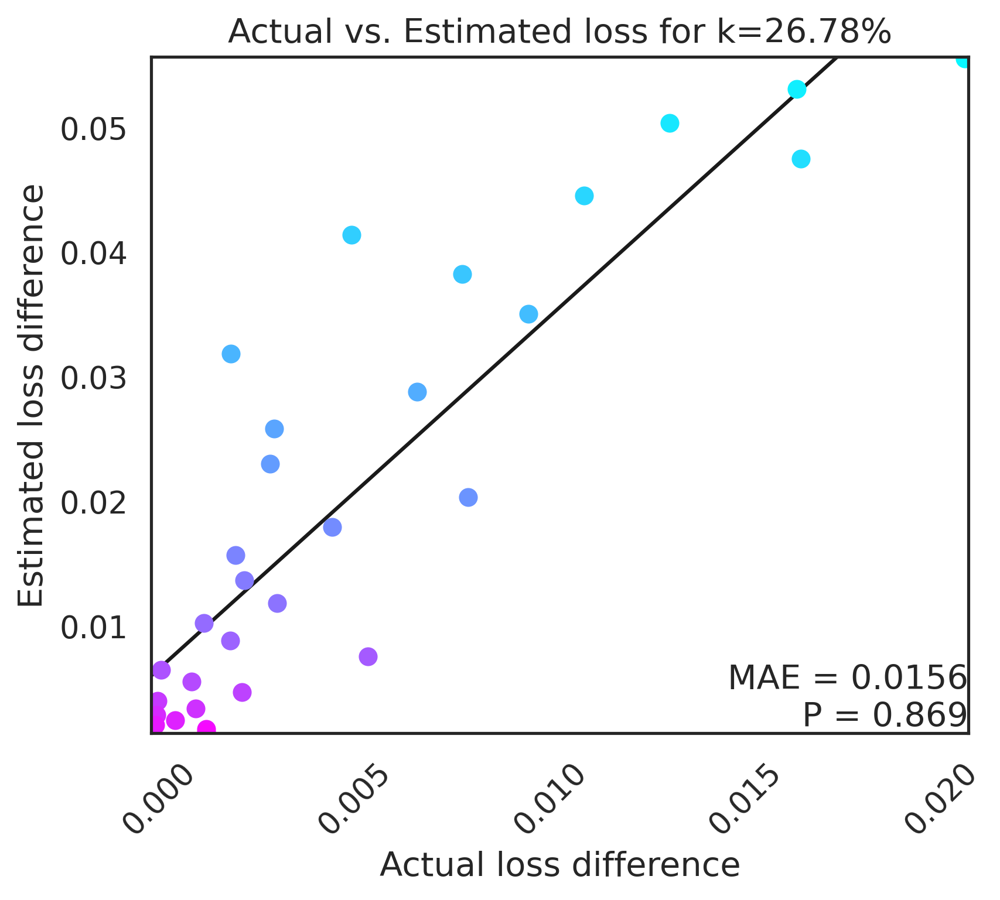


k: 30.0
ep: 0.001


IHVP sample 2: 100%|████████████████████████████████████████████████| 7500/7500 [00:16<00:00, 448.13it/s, est norm=4.57]


Approx difference: 0.08208
True difference: 0.00461
ep: 0.17337931034482756
Approx difference: 0.07829
True difference: 0.00860
ep: 0.3457586206896551
Approx difference: 0.07464
True difference: 0.01028
ep: 0.5181379310344827
Approx difference: 0.07000
True difference: 0.00742
ep: 0.6905172413793103
Approx difference: 0.06526
True difference: 0.01128
ep: 0.8628965517241378
Approx difference: 0.06110
True difference: 0.00545
ep: 1.0352758620689653
Approx difference: 0.05623
True difference: 0.00982
ep: 1.207655172413793
Approx difference: 0.05148
True difference: 0.00522
ep: 1.3800344827586204
Approx difference: 0.04722
True difference: 0.00400
ep: 1.5524137931034478
Approx difference: 0.04259
True difference: 0.00326
ep: 1.7247931034482755
Approx difference: 0.03810
True difference: 0.00441
ep: 1.8971724137931032
Approx difference: 0.03395
True difference: 0.00692
ep: 2.0695517241379306
Approx difference: 0.03001
True difference: 0.00216
ep: 2.241931034482758
Approx difference: 0.02640

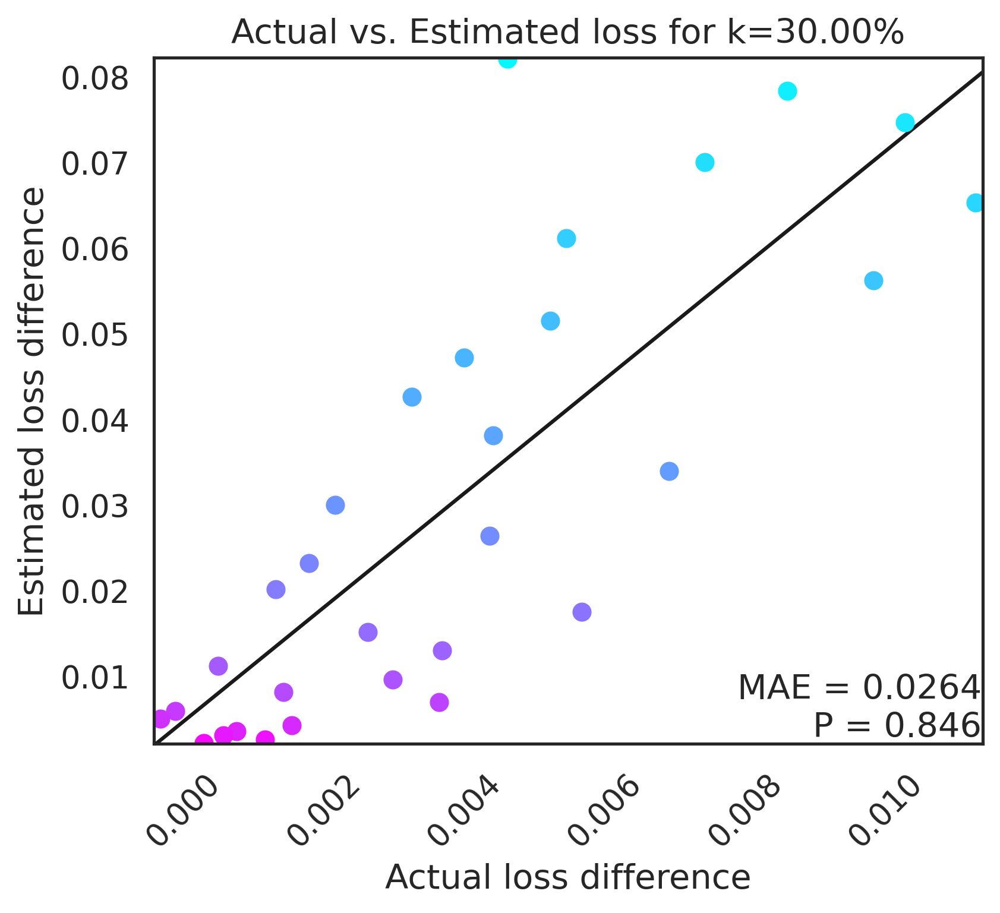

In [20]:
all_orig_loss_e_k, all_est_loss_e_k, all_time = Main('mnist', epsilons, k, rounds)

with open('all_orig_loss_e_k_mnist-4_class.txt', "wb") as file:   #Pickling
    pickle.dump(all_orig_loss_e_k, file)

with open('all_est_loss_e_k_mnist-4_class.txt', "wb") as file2:   #Pickling
    pickle.dump(all_est_loss_e_k, file2)

In [21]:
with open('all_orig_loss_e_k_mnist-4_class.txt', 'rb') as f:
    all_orig_loss_e_k = pickle.load(f)
    
with open('all_est_loss_e_k_mnist-4_class.txt', 'rb') as f:
    all_est_loss_e_k = pickle.load(f)

In [22]:
# [actual, estimate]

sum_orig_loss_e_k = [[0 for _ in range(len(k))] for _ in range(len(epsilons))]
sum_est_loss_e_k = [[0 for _ in range(len(k))] for _ in range(len(epsilons))]
sum_time = [[0 for _ in range(len(k))] for _ in range(len(epsilons))]

avg_orig_loss = []
avg_est_loss = []
avg_time = []

for round_ in range(len(all_orig_loss_e_k)):
    for e in range(len(epsilons)):
        for k_ in range(len(k)):
            sum_orig_loss_e_k[e][k_] = sum_orig_loss_e_k[e][k_] + all_orig_loss_e_k[round_][e][k_]
            sum_est_loss_e_k[e][k_] = sum_est_loss_e_k[e][k_] + all_est_loss_e_k[round_][e][k_]
            sum_time[e][k_] = sum_time[e][k_] + all_time[round_][e][k_]

for e in range(len(epsilons)):
    avg_orig_loss.append([ elem / len(all_orig_loss_e_k) for elem in sum_orig_loss_e_k[e]])
    avg_est_loss.append([elem/ len(all_orig_loss_e_k) for elem in sum_est_loss_e_k[e]])
    avg_time.append([elem/ len(all_orig_loss_e_k) for elem in sum_time[e]])

k_e_orig = [[] for _ in range(len(k))]
k_e_est = [[] for _ in range(len(k))]

for e in range(len(epsilons)):
    for k_ in range(len(k)):
        k_e_orig[k_].append(avg_orig_loss[e][k_])
        k_e_est[k_].append(avg_est_loss[e][k_])

averaged_time = []

for e in range(len(epsilons)):
    averaged_time.append(sum_time[e][0])

average_time_final = sum(averaged_time) / len(averaged_time)

IndexError: list index out of range

In [ ]:
k = np.linspace(1, 25, 10)
k_ = list(k)
k_

In [ ]:
for i in range(len(k_e_orig)):
    visualize_result(k_e_orig[i], k_e_est[i], epsilons, k_[i])